Q2.

importing libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch
import torch.utils.data
from torch import nn, optim
from torch.nn import functional as F
from torchvision import datasets, transforms
import torchvision
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Class to print string in bold
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [ ]:
cuda = torch.cuda.is_available()
device = torch.device("cuda" if cuda else "cpu")

In [ ]:
# functions to show an image

def imshow(img, title = False):

    plt.imshow(np.transpose(img, (1, 2, 0)))
    if(title):
        plt.title("{}".format(title))
    plt.show()


Data loading and preprocessing

In [ ]:
path = '/content/drive/MyDrive/Dataset/Assignment3_dataset/Assignment3_dataset3'

from torchvision import datasets, transforms
# Define data transformations
transform = transforms.Compose([
    transforms.Resize((64,64)),  # Resize images to a common size
    transforms.ToTensor(),           # Convert images to PyTorch tensors
])

# Load the dataset
dataset = datasets.ImageFolder(root= path, transform=transform)
dataset


Dataset ImageFolder
    Number of datapoints: 109
    Root location: /content/drive/MyDrive/Dataset/Assignment3_dataset/Assignment3_dataset3
    StandardTransform
Transform: Compose(
               Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
           )

In [ ]:
# Get indices for boat class
def get_indices(dataset, target_class=0):
    indices = [i for i in range(len(dataset.targets)) if dataset.targets[i] == target_class]
    return indices

# Get indices for the boat class
boat_indices = get_indices(dataset, target_class=0)
print('Num Train Samples with labels:', len(boat_indices))

# Split indices into training and validation
split_ratio = 0.9
split_index = int(split_ratio * len(boat_indices))
train_indices = boat_indices[:split_index]
val_indices = boat_indices[split_index:]

# Set up data loaders for training and validation
batch_size = 16
train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                           sampler=torch.utils.data.sampler.SubsetRandomSampler(train_indices))
val_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         sampler=torch.utils.data.sampler.SubsetRandomSampler(val_indices))


Num Train Samples with labels: 109


In [ ]:
#Set up an iterator for data loader and get the next batch
dataIter = iter(train_loader)
imgs, labels = next(dataIter)

In [ ]:
dataIter = iter(val_loader)
imgs, labels = next(dataIter)

In [ ]:
#Print
imgs.shape  #shape of the tensor data obtained from the train loader

torch.Size([16, 3, 64, 64])

2.a

# VAE Model

In [ ]:
class VAE(nn.Module):
    def __init__(self,  image_size = 64, channel_num = 3, kernel_num = 128, z_size = 8):
        # configurations
        super().__init__()
        self.image_size = image_size
        self.channel_num = channel_num
        self.kernel_num = kernel_num
        self.z_size = z_size

        self.num_encoder_layers = 2

        # encoder
        self.encoder = nn.Sequential(
            self._conv(channel_num, kernel_num // 2),

            self._conv(kernel_num // 2, kernel_num)
        )

        # encoded feature's size and volume
        self.feature_size = image_size // (2**self.num_encoder_layers)
        self.feature_volume = kernel_num * (self.feature_size ** 2)

        self.q_mean = self._linear(self.feature_volume, z_size, relu=False)
        self.q_logvar = self._linear(self.feature_volume, z_size, relu=False)

        # projection
        self.project = self._linear(z_size, self.feature_volume, relu=False)


        # decoder
        self.decoder = nn.Sequential(
            self._deconv(kernel_num, kernel_num // 2),

            self._deconv(kernel_num // 2, channel_num),


            nn.ReLU()
        )


    def forward(self, x):
        # encode x
        encoded = self.encoder(x)

        mean, logvar = self.q(encoded)
        z = self.z(mean, logvar)
        z_projected = self.project(z).view(
            -1, self.kernel_num,
            self.feature_size,
            self.feature_size,
        )
        # reconstruct x from z
        x_reconstructed = self.decoder(z_projected)
        return (mean, logvar, x_reconstructed)

    # ==============
    # VAE components
    # ==============

    def q(self, encoded):
        unrolled = encoded.view(-1, self.feature_volume)
        return self.q_mean(unrolled), self.q_logvar(unrolled)

    def z(self, mean, logvar):
        std = logvar.mul(0.5).exp_()
        eps = (
            Variable(torch.randn(std.size())).to(device)
        )
        return eps.mul(std).add_(mean)

    def reconstruction_loss(self, x_reconstructed, x):
        return nn.MSELoss(size_average=False)(x_reconstructed, x)/ x.size(0)
    def kl_divergence_loss(self, mean, logvar):
        return ((mean**2 + logvar.exp() - 1 - logvar) / 2).mean()


    # ======
    # Layers
    # ======

    def _conv(self, channel_size, kernel_num):
        return nn.Sequential(
            nn.Conv2d(
                channel_size, kernel_num,
                kernel_size=4, stride=2, padding=1,
            ),
            nn.ReLU(),
        )

    def _deconv(self, channel_num, kernel_num):
        return nn.Sequential(
            nn.ConvTranspose2d(
                channel_num, kernel_num,
                kernel_size=4, stride=2, padding=1,
            ),
            nn.ReLU(),
        )

    def _linear(self, in_size, out_size, relu=True):
        return nn.Sequential(
            nn.Linear(in_size, out_size),
            nn.ReLU(),
        ) if relu else nn.Linear(in_size, out_size)

In [ ]:
model = VAE().to(device)
optimizer_vae = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-3)

2.b,c,d

# Train Function

In [ ]:
def train(epoch):
    train_loss = 0
    recon_loss = 0
    kl_loss = 0
    recon_batch = None
    for batch_idx, (data, classes) in enumerate(train_loader):
            data, classes = data.to(device), classes.to(device)
            optimizer_vae.zero_grad()
            mu, logvar, recon_batch = model(data)


            reconstruction_loss = model.reconstruction_loss(recon_batch, data)
            kl_divergence_loss = model.kl_divergence_loss(mu, logvar)
            recon_loss += reconstruction_loss.item()
            loss = reconstruction_loss + kl_divergence_loss #+ 100*quantile_loss
            kl_loss += kl_divergence_loss.item()
            loss.backward()
            train_loss += loss.item()
            optimizer_vae.step()

    print('====> Epoch: {} Average loss: {:.4f}'.format(
        epoch, train_loss / (len(train_loader)*20)))
    print('====> Epoch: {} Average Reconstruction loss: {:.4f}'.format(
        epoch, recon_loss / (len(train_loader)*20)))
    print('====> Epoch: {} Average KL loss: {:.4f}'.format(
        epoch, kl_loss / (len(train_loader)*20)))

    if (True):#(epoch % 10 == 0):
        print(color.BOLD + 'Original Samples:' + color.END)
        imshow(torchvision.utils.make_grid(data.cpu()))
        print(color.BOLD + 'Generated Generated:' + color.END)
        imshow(torchvision.utils.make_grid(recon_batch.view(-1,3,64,64).detach().cpu()))


In [ ]:
def validate(epoch):
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for batch_idx, (data, _) in enumerate(val_loader):
            data = data.to(device)
            mu, logvar, recon_batch = model(data)

            reconstruction_loss = model.reconstruction_loss(recon_batch, data)
            kl_divergence_loss = model.kl_divergence_loss(mu, logvar)

            loss = reconstruction_loss + kl_divergence_loss
            val_loss += loss.item()

    print('====> Validation Epoch: {} Average loss: {:.4f}'.format(
        epoch, val_loss / len(val_loader)))



====> Epoch: 1 Average loss: 7.6494
====> Epoch: 1 Average Reconstruction loss: 7.4758
====> Epoch: 1 Average KL loss: 0.1736
Original Samples:


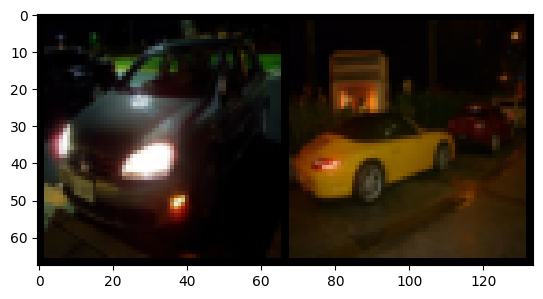

Generated Generated:


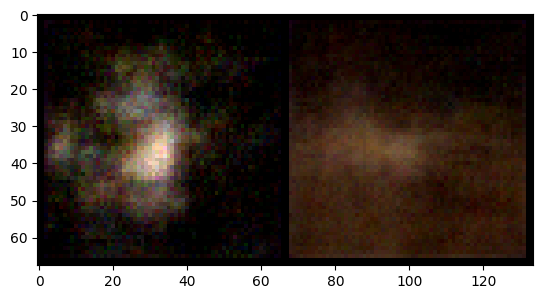

====> Validation Epoch: 1 Average loss: 266.7917
====> Epoch: 2 Average loss: 8.0428
====> Epoch: 2 Average Reconstruction loss: 7.8679
====> Epoch: 2 Average KL loss: 0.1748
Original Samples:


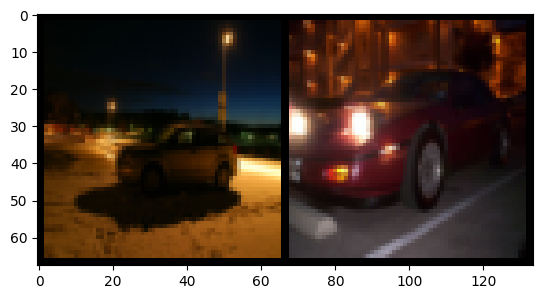

Generated Generated:


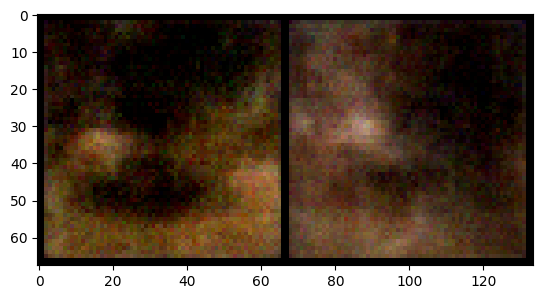

====> Validation Epoch: 2 Average loss: 267.1323
====> Epoch: 3 Average loss: 8.4216
====> Epoch: 3 Average Reconstruction loss: 8.2471
====> Epoch: 3 Average KL loss: 0.1745
Original Samples:


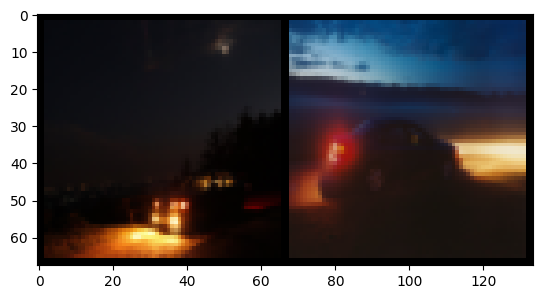

Generated Generated:


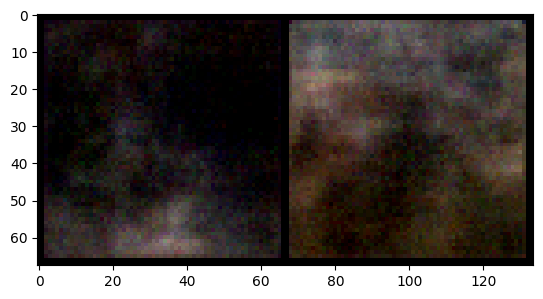

====> Validation Epoch: 3 Average loss: 269.8200
====> Epoch: 4 Average loss: 7.6641
====> Epoch: 4 Average Reconstruction loss: 7.4862
====> Epoch: 4 Average KL loss: 0.1780
Original Samples:


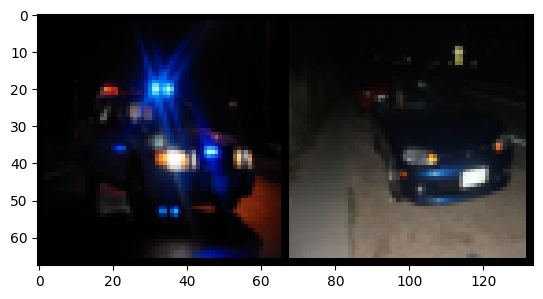

Generated Generated:


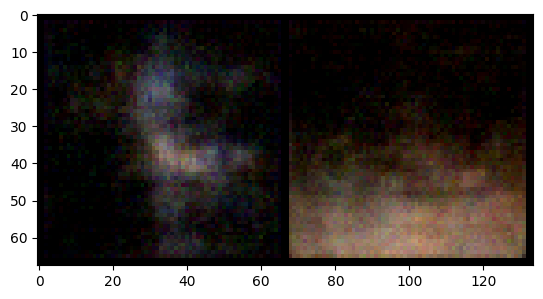

====> Validation Epoch: 4 Average loss: 269.6299
====> Epoch: 5 Average loss: 7.5723
====> Epoch: 5 Average Reconstruction loss: 7.3971
====> Epoch: 5 Average KL loss: 0.1752
Original Samples:


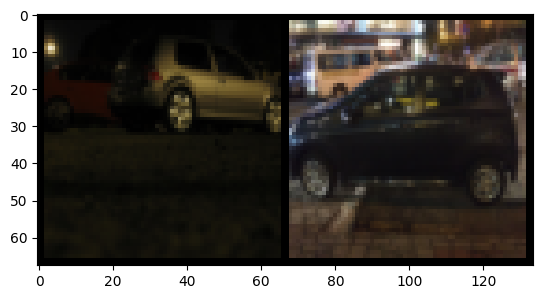

Generated Generated:


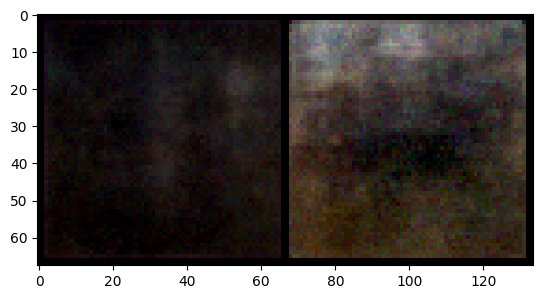

====> Validation Epoch: 5 Average loss: 267.3228
====> Epoch: 6 Average loss: 7.7757
====> Epoch: 6 Average Reconstruction loss: 7.6001
====> Epoch: 6 Average KL loss: 0.1756
Original Samples:


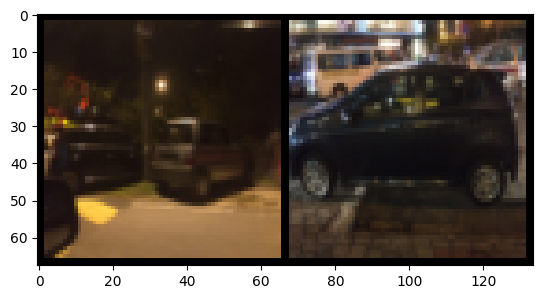

Generated Generated:


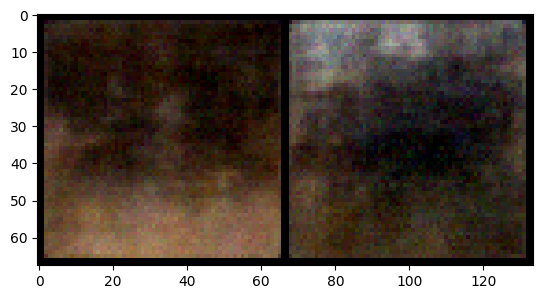

====> Validation Epoch: 6 Average loss: 266.6841
====> Epoch: 7 Average loss: 7.8648
====> Epoch: 7 Average Reconstruction loss: 7.6927
====> Epoch: 7 Average KL loss: 0.1721
Original Samples:


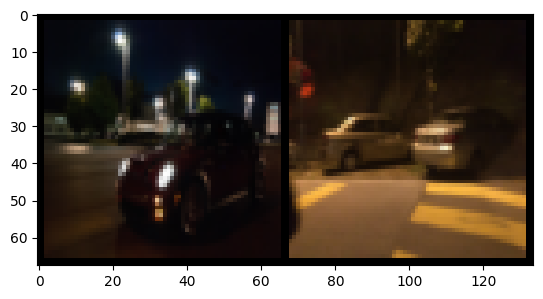

Generated Generated:


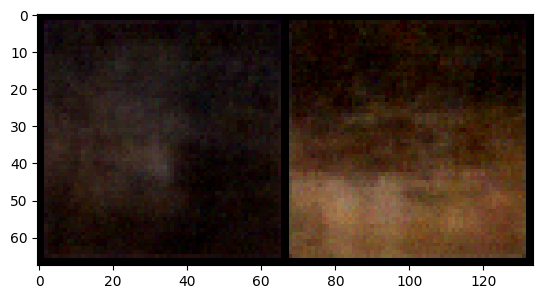

====> Validation Epoch: 7 Average loss: 266.5573
====> Epoch: 8 Average loss: 7.7543
====> Epoch: 8 Average Reconstruction loss: 7.5851
====> Epoch: 8 Average KL loss: 0.1693
Original Samples:


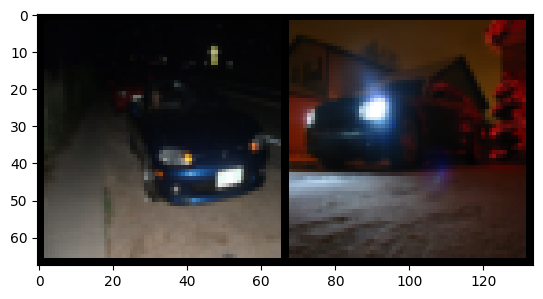

Generated Generated:


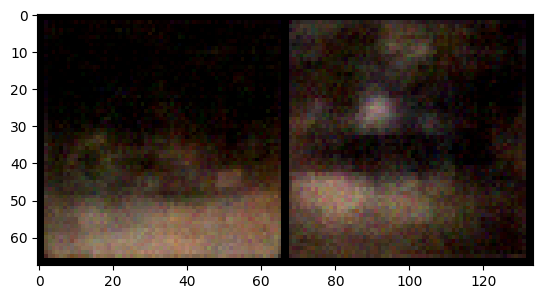

====> Validation Epoch: 8 Average loss: 275.0735
====> Epoch: 9 Average loss: 7.9254
====> Epoch: 9 Average Reconstruction loss: 7.7501
====> Epoch: 9 Average KL loss: 0.1753
Original Samples:


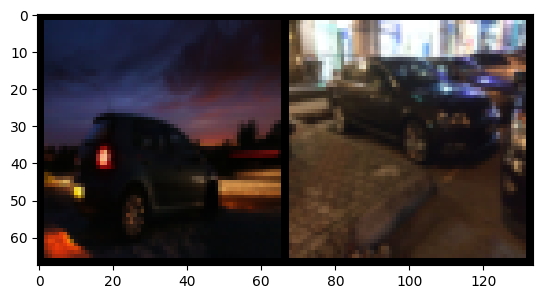

Generated Generated:


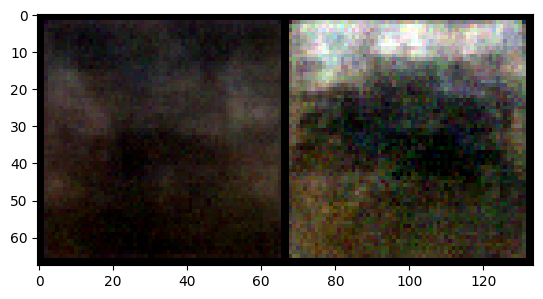

====> Validation Epoch: 9 Average loss: 278.8347
====> Epoch: 10 Average loss: 8.2864
====> Epoch: 10 Average Reconstruction loss: 8.1098
====> Epoch: 10 Average KL loss: 0.1766
Original Samples:


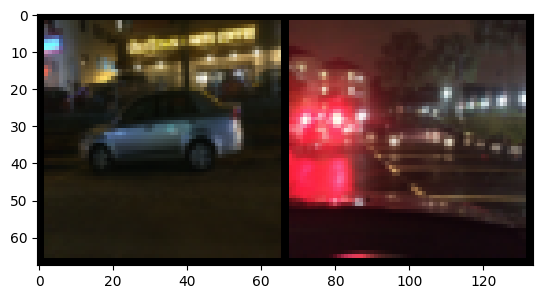

Generated Generated:


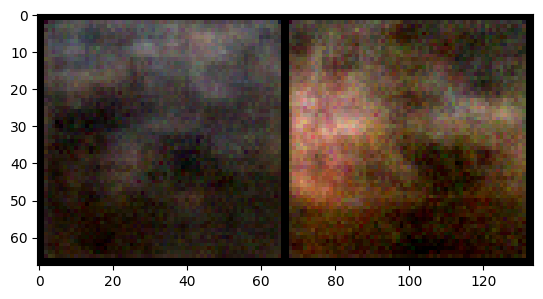

====> Validation Epoch: 10 Average loss: 269.1536
====> Epoch: 11 Average loss: 7.7754
====> Epoch: 11 Average Reconstruction loss: 7.6016
====> Epoch: 11 Average KL loss: 0.1739
Original Samples:


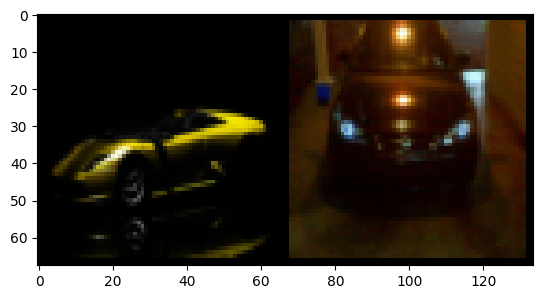

Generated Generated:


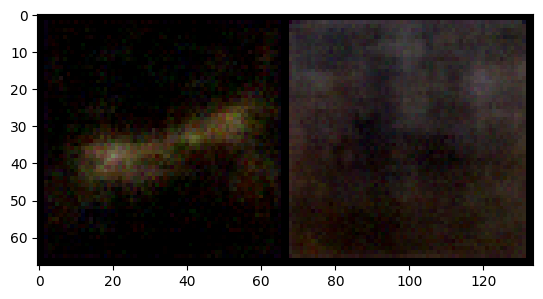

====> Validation Epoch: 11 Average loss: 270.9665
====> Epoch: 12 Average loss: 8.2627
====> Epoch: 12 Average Reconstruction loss: 8.0855
====> Epoch: 12 Average KL loss: 0.1772
Original Samples:


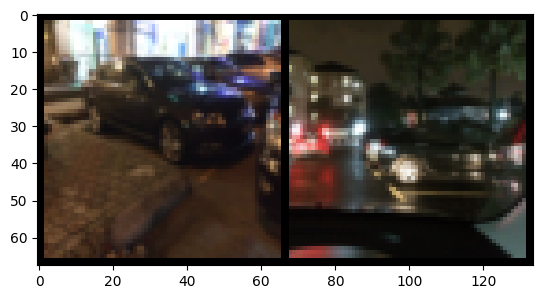

Generated Generated:


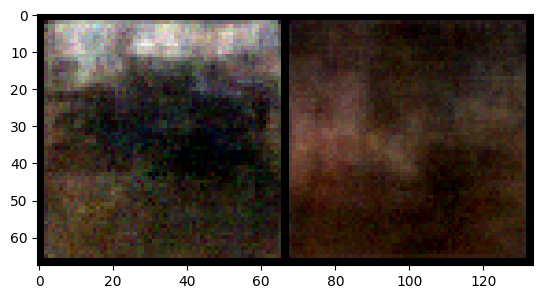

====> Validation Epoch: 12 Average loss: 268.1536
====> Epoch: 13 Average loss: 7.9958
====> Epoch: 13 Average Reconstruction loss: 7.8252
====> Epoch: 13 Average KL loss: 0.1705
Original Samples:


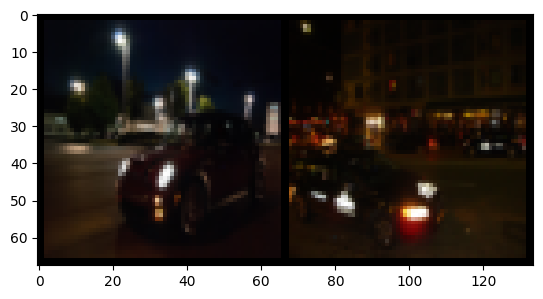

Generated Generated:


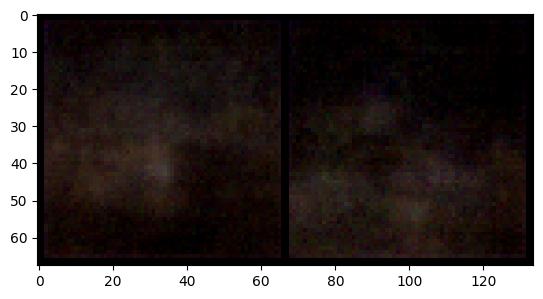

====> Validation Epoch: 13 Average loss: 287.9834
====> Epoch: 14 Average loss: 8.2541
====> Epoch: 14 Average Reconstruction loss: 8.0853
====> Epoch: 14 Average KL loss: 0.1688
Original Samples:


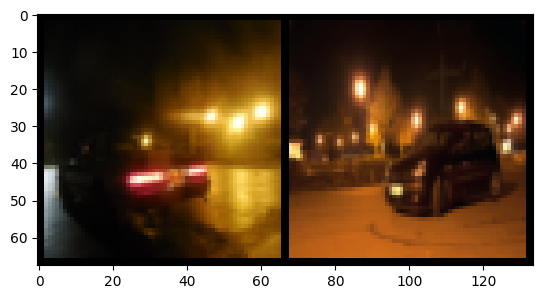

Generated Generated:


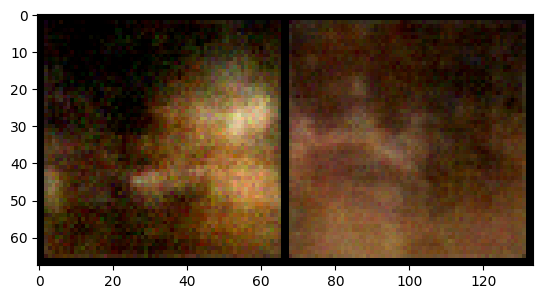

====> Validation Epoch: 14 Average loss: 272.4787
====> Epoch: 15 Average loss: 7.6507
====> Epoch: 15 Average Reconstruction loss: 7.4890
====> Epoch: 15 Average KL loss: 0.1617
Original Samples:


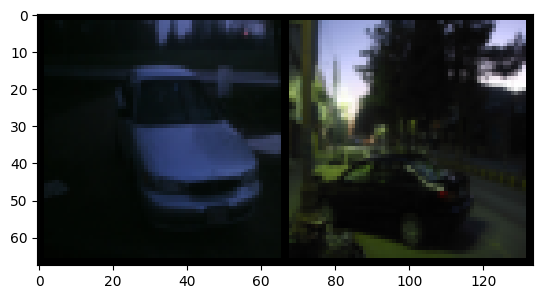

Generated Generated:


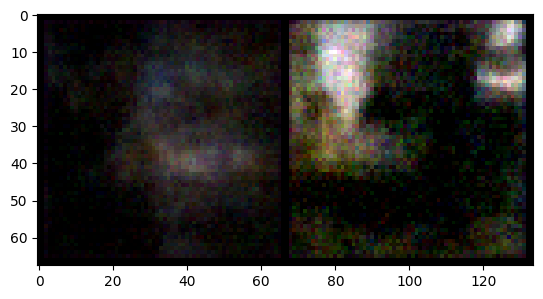

====> Validation Epoch: 15 Average loss: 276.1573
====> Epoch: 16 Average loss: 7.6113
====> Epoch: 16 Average Reconstruction loss: 7.4451
====> Epoch: 16 Average KL loss: 0.1662
Original Samples:


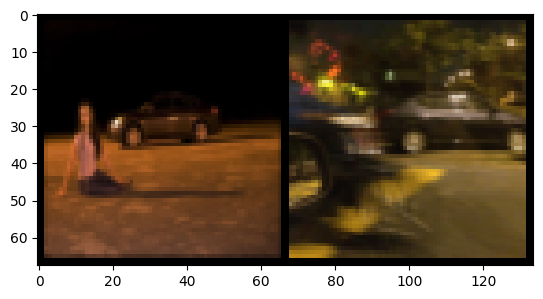

Generated Generated:


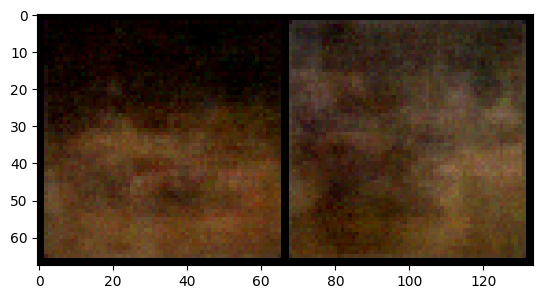

====> Validation Epoch: 16 Average loss: 270.0349
====> Epoch: 17 Average loss: 7.0463
====> Epoch: 17 Average Reconstruction loss: 6.8773
====> Epoch: 17 Average KL loss: 0.1689
Original Samples:


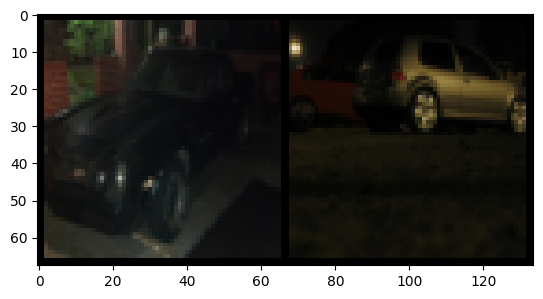

Generated Generated:


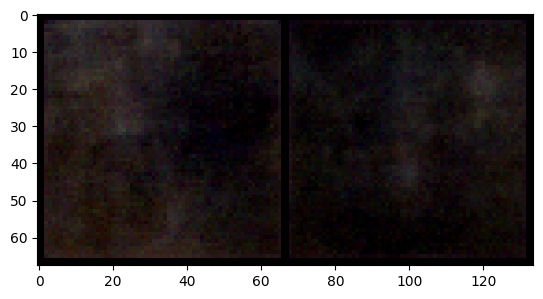

====> Validation Epoch: 17 Average loss: 269.3811
====> Epoch: 18 Average loss: 8.2107
====> Epoch: 18 Average Reconstruction loss: 8.0280
====> Epoch: 18 Average KL loss: 0.1827
Original Samples:


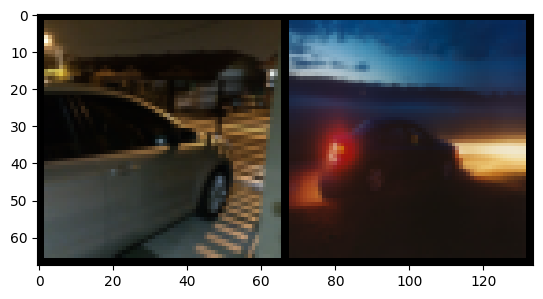

Generated Generated:


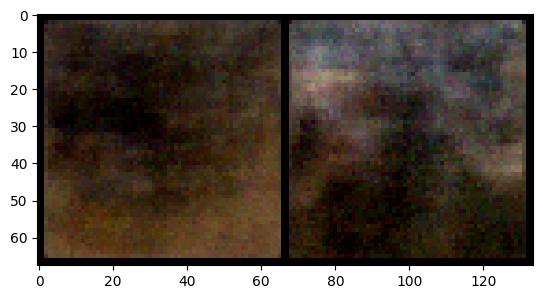

====> Validation Epoch: 18 Average loss: 271.0045
====> Epoch: 19 Average loss: 7.2102
====> Epoch: 19 Average Reconstruction loss: 7.0295
====> Epoch: 19 Average KL loss: 0.1807
Original Samples:


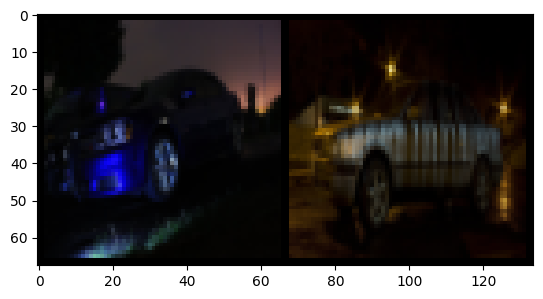

Generated Generated:


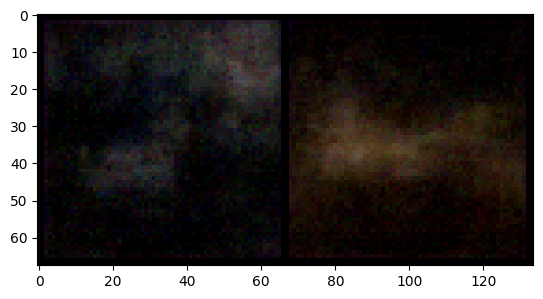

====> Validation Epoch: 19 Average loss: 274.8950
====> Epoch: 20 Average loss: 7.4779
====> Epoch: 20 Average Reconstruction loss: 7.2983
====> Epoch: 20 Average KL loss: 0.1796
Original Samples:


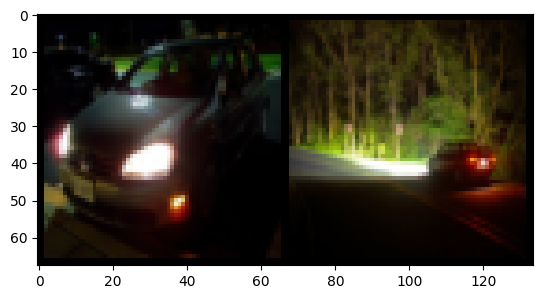

Generated Generated:


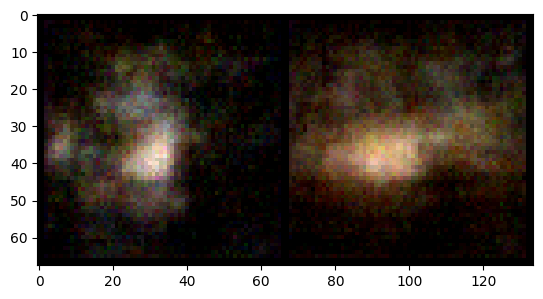

====> Validation Epoch: 20 Average loss: 270.5933
====> Epoch: 21 Average loss: 7.1333
====> Epoch: 21 Average Reconstruction loss: 6.9575
====> Epoch: 21 Average KL loss: 0.1759
Original Samples:


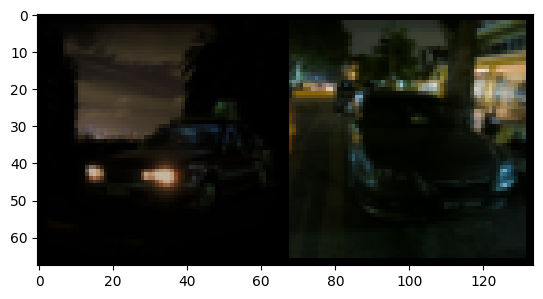

Generated Generated:


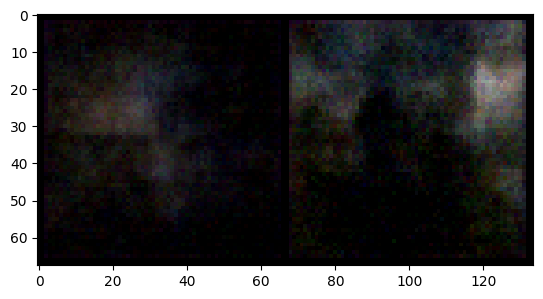

====> Validation Epoch: 21 Average loss: 272.3340
====> Epoch: 22 Average loss: 7.1419
====> Epoch: 22 Average Reconstruction loss: 6.9684
====> Epoch: 22 Average KL loss: 0.1735
Original Samples:


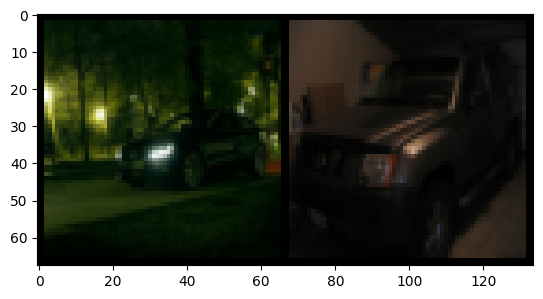

Generated Generated:


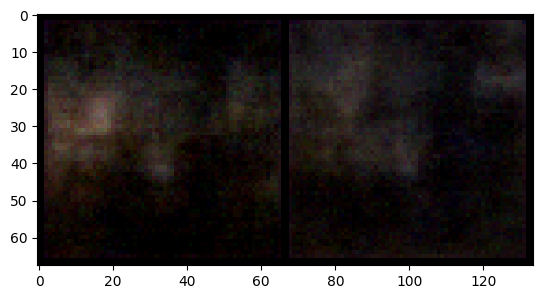

====> Validation Epoch: 22 Average loss: 271.0240
====> Epoch: 23 Average loss: 7.8663
====> Epoch: 23 Average Reconstruction loss: 7.6877
====> Epoch: 23 Average KL loss: 0.1786
Original Samples:


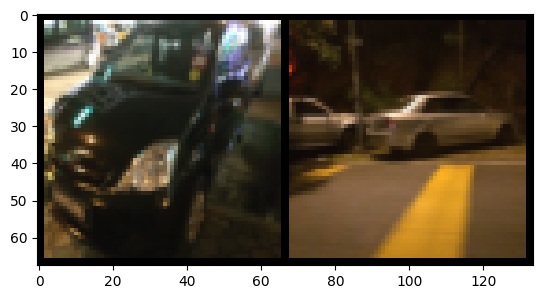

Generated Generated:


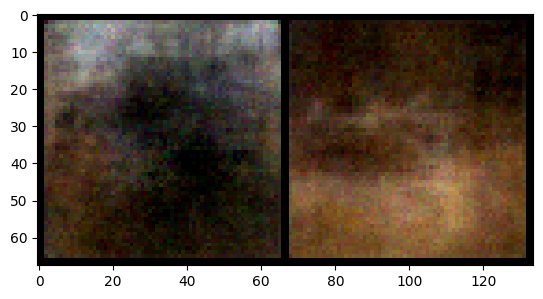

====> Validation Epoch: 23 Average loss: 269.5474
====> Epoch: 24 Average loss: 7.1339
====> Epoch: 24 Average Reconstruction loss: 6.9568
====> Epoch: 24 Average KL loss: 0.1771
Original Samples:


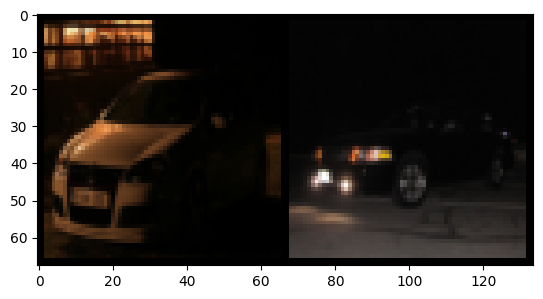

Generated Generated:


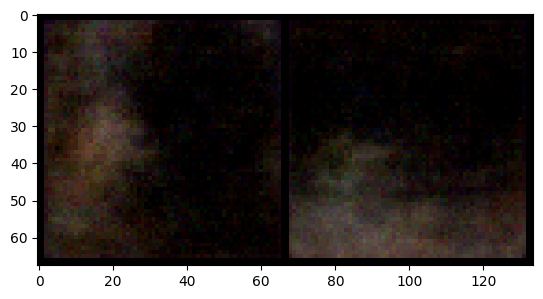

====> Validation Epoch: 24 Average loss: 273.4627
====> Epoch: 25 Average loss: 7.2932
====> Epoch: 25 Average Reconstruction loss: 7.1184
====> Epoch: 25 Average KL loss: 0.1748
Original Samples:


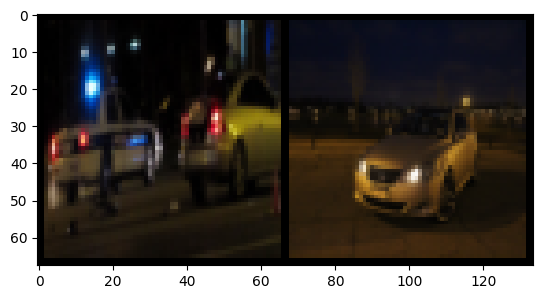

Generated Generated:


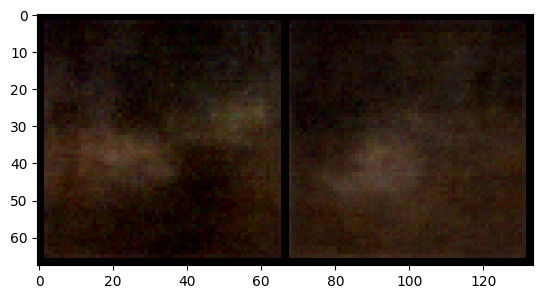

====> Validation Epoch: 25 Average loss: 270.5776
====> Epoch: 26 Average loss: 7.6540
====> Epoch: 26 Average Reconstruction loss: 7.4764
====> Epoch: 26 Average KL loss: 0.1776
Original Samples:


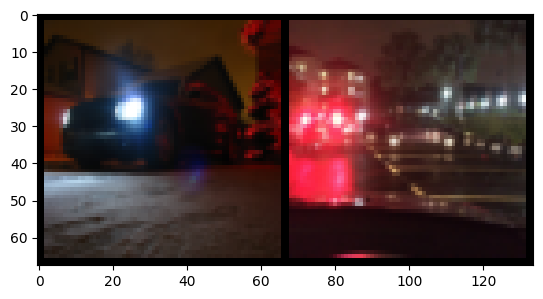

Generated Generated:


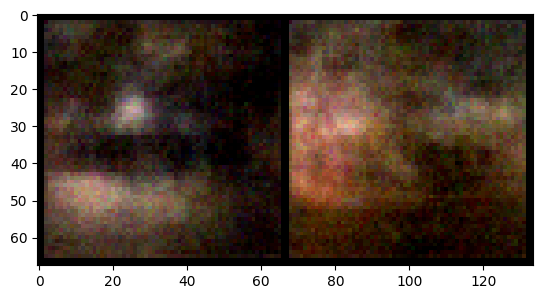

====> Validation Epoch: 26 Average loss: 269.9642
====> Epoch: 27 Average loss: 7.0664
====> Epoch: 27 Average Reconstruction loss: 6.8888
====> Epoch: 27 Average KL loss: 0.1775
Original Samples:


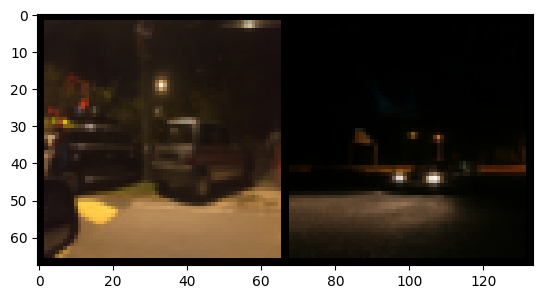

Generated Generated:


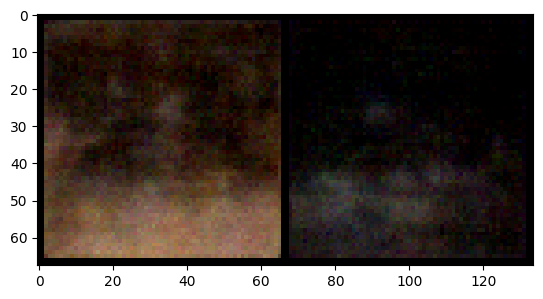

====> Validation Epoch: 27 Average loss: 272.5557
====> Epoch: 28 Average loss: 7.1513
====> Epoch: 28 Average Reconstruction loss: 6.9736
====> Epoch: 28 Average KL loss: 0.1777
Original Samples:


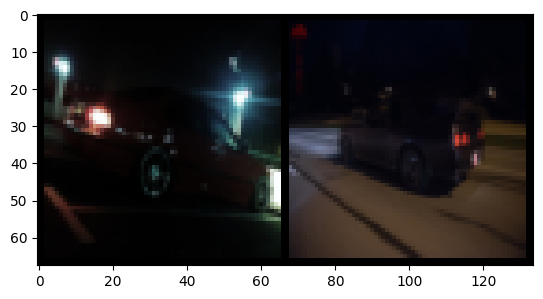

Generated Generated:


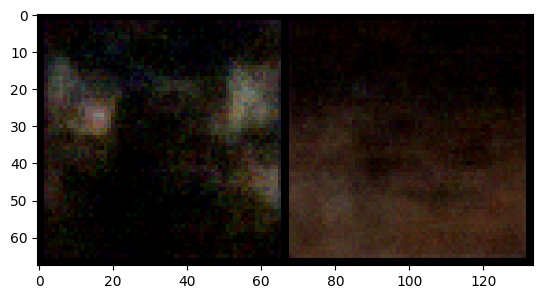

====> Validation Epoch: 28 Average loss: 270.5189
====> Epoch: 29 Average loss: 7.9031
====> Epoch: 29 Average Reconstruction loss: 7.7179
====> Epoch: 29 Average KL loss: 0.1852
Original Samples:


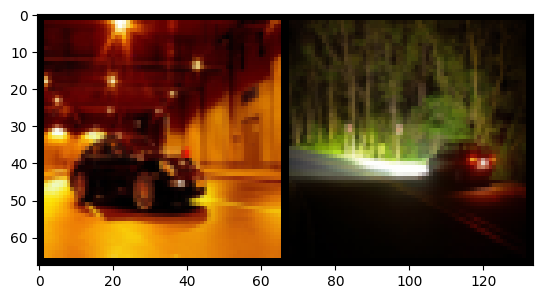

Generated Generated:


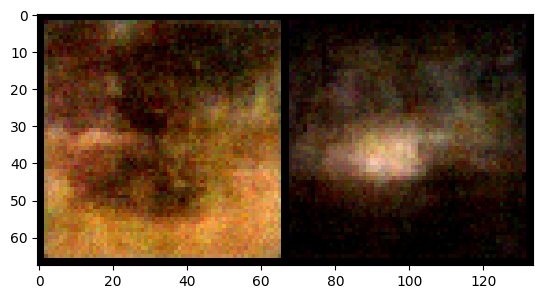

====> Validation Epoch: 29 Average loss: 271.1477
====> Epoch: 30 Average loss: 8.0655
====> Epoch: 30 Average Reconstruction loss: 7.8822
====> Epoch: 30 Average KL loss: 0.1834
Original Samples:


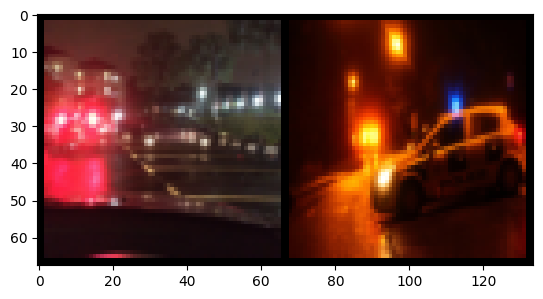

Generated Generated:


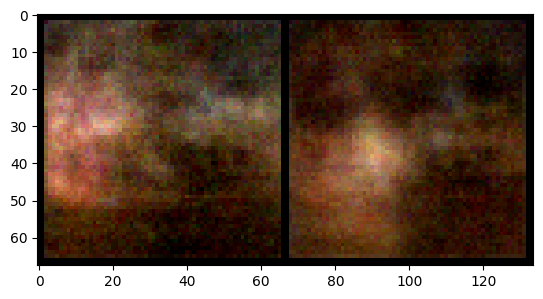

====> Validation Epoch: 30 Average loss: 271.9685
====> Epoch: 31 Average loss: 7.0285
====> Epoch: 31 Average Reconstruction loss: 6.8487
====> Epoch: 31 Average KL loss: 0.1798
Original Samples:


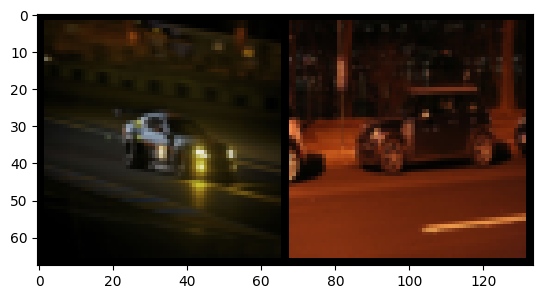

Generated Generated:


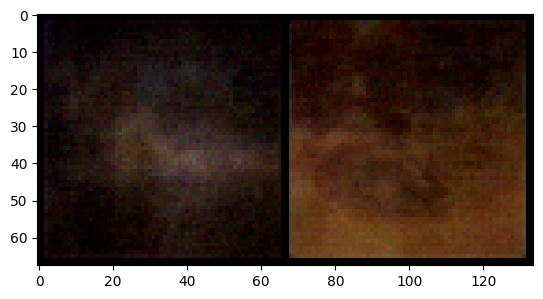

====> Validation Epoch: 31 Average loss: 273.5756
====> Epoch: 32 Average loss: 7.3401
====> Epoch: 32 Average Reconstruction loss: 7.1605
====> Epoch: 32 Average KL loss: 0.1796
Original Samples:


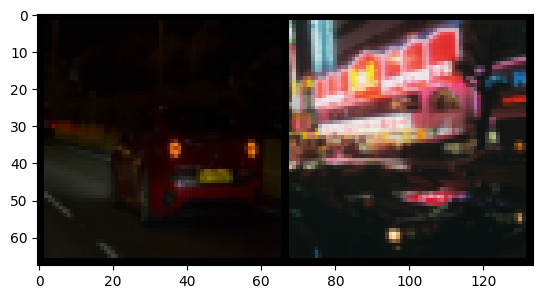

Generated Generated:


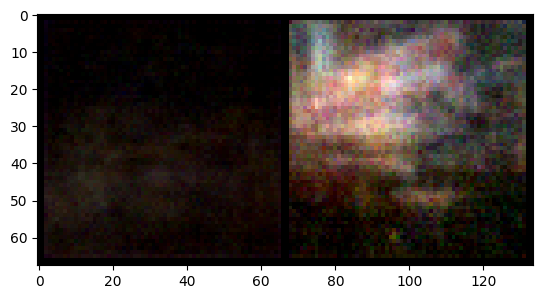

====> Validation Epoch: 32 Average loss: 272.0872
====> Epoch: 33 Average loss: 7.6582
====> Epoch: 33 Average Reconstruction loss: 7.4821
====> Epoch: 33 Average KL loss: 0.1761
Original Samples:


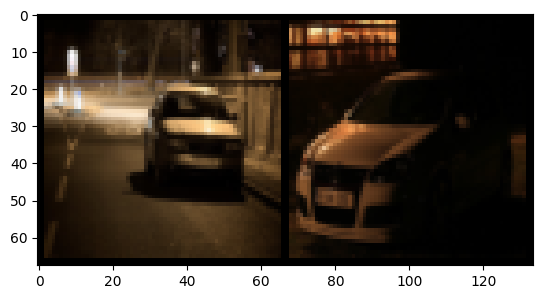

Generated Generated:


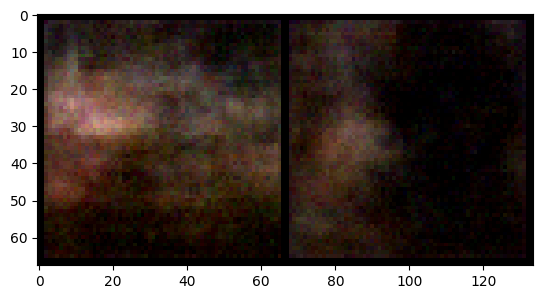

====> Validation Epoch: 33 Average loss: 270.9621
====> Epoch: 34 Average loss: 7.2387
====> Epoch: 34 Average Reconstruction loss: 7.0639
====> Epoch: 34 Average KL loss: 0.1748
Original Samples:


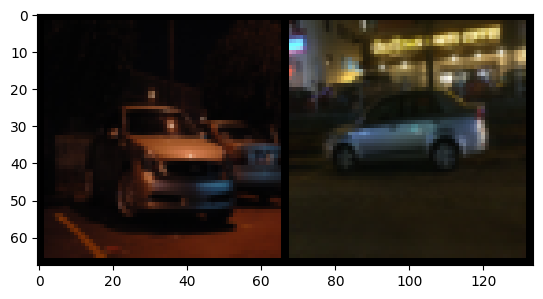

Generated Generated:


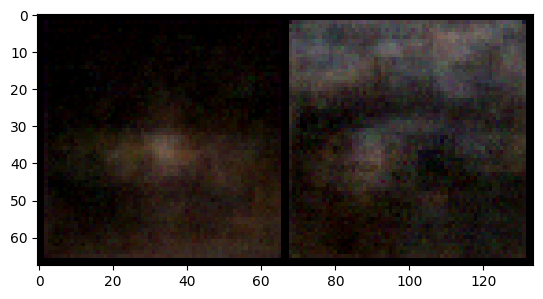

====> Validation Epoch: 34 Average loss: 272.4672
====> Epoch: 35 Average loss: 7.1306
====> Epoch: 35 Average Reconstruction loss: 6.9533
====> Epoch: 35 Average KL loss: 0.1773
Original Samples:


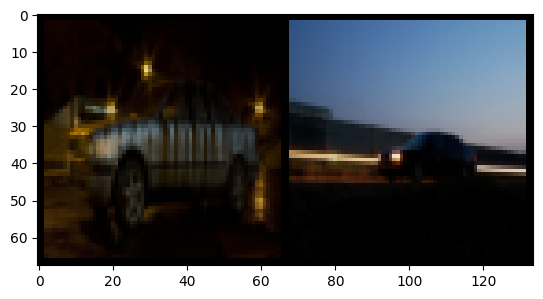

Generated Generated:


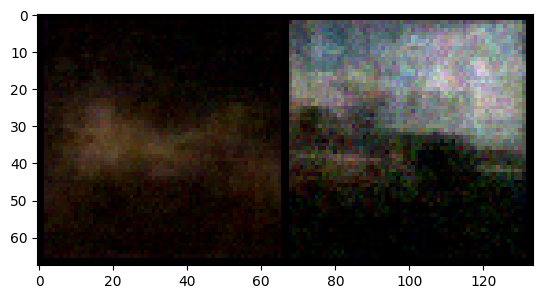

====> Validation Epoch: 35 Average loss: 273.4143
====> Epoch: 36 Average loss: 6.9397
====> Epoch: 36 Average Reconstruction loss: 6.7650
====> Epoch: 36 Average KL loss: 0.1747
Original Samples:


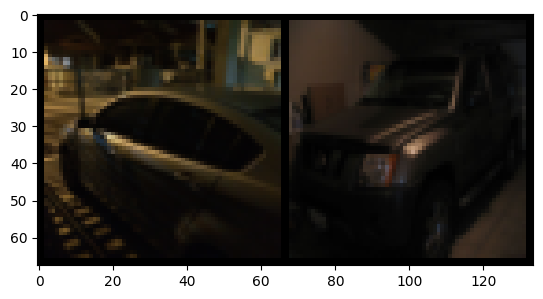

Generated Generated:


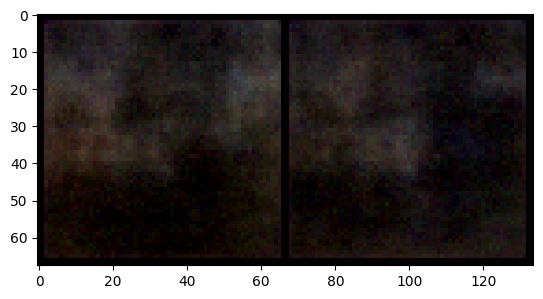

====> Validation Epoch: 36 Average loss: 270.8337
====> Epoch: 37 Average loss: 7.8270
====> Epoch: 37 Average Reconstruction loss: 7.6447
====> Epoch: 37 Average KL loss: 0.1822
Original Samples:


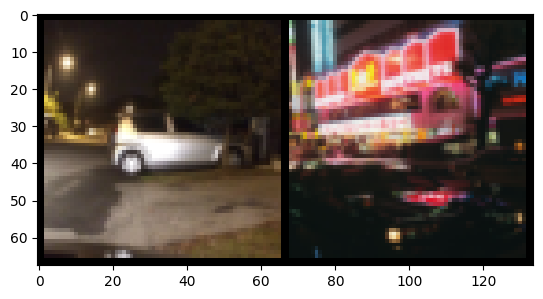

Generated Generated:


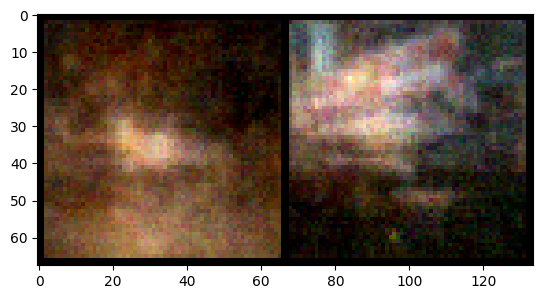

====> Validation Epoch: 37 Average loss: 270.8139
====> Epoch: 38 Average loss: 7.1460
====> Epoch: 38 Average Reconstruction loss: 6.9691
====> Epoch: 38 Average KL loss: 0.1768
Original Samples:


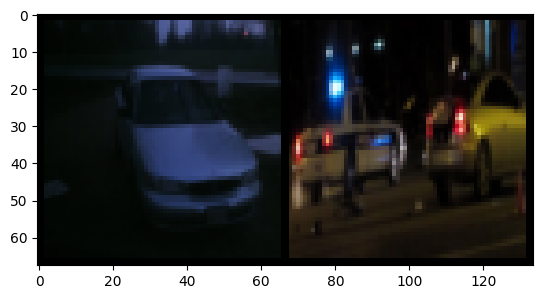

Generated Generated:


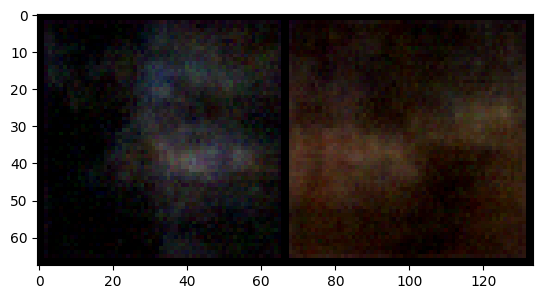

====> Validation Epoch: 38 Average loss: 272.4911
====> Epoch: 39 Average loss: 7.0312
====> Epoch: 39 Average Reconstruction loss: 6.8553
====> Epoch: 39 Average KL loss: 0.1759
Original Samples:


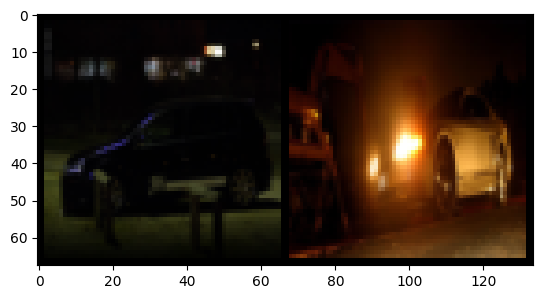

Generated Generated:


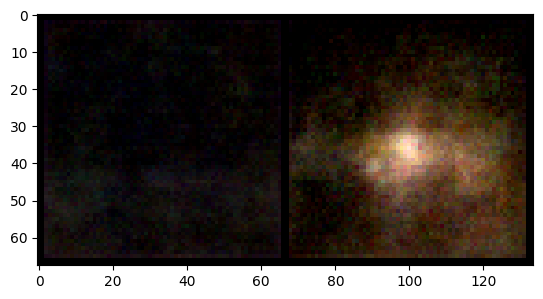

====> Validation Epoch: 39 Average loss: 277.2453
====> Epoch: 40 Average loss: 7.3301
====> Epoch: 40 Average Reconstruction loss: 7.1563
====> Epoch: 40 Average KL loss: 0.1738
Original Samples:


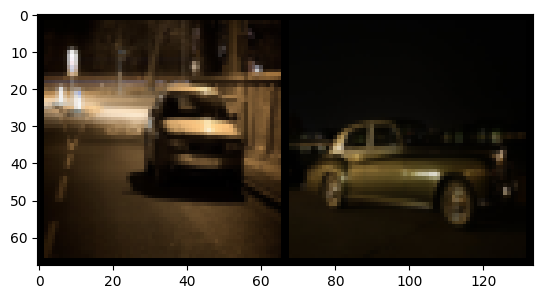

Generated Generated:


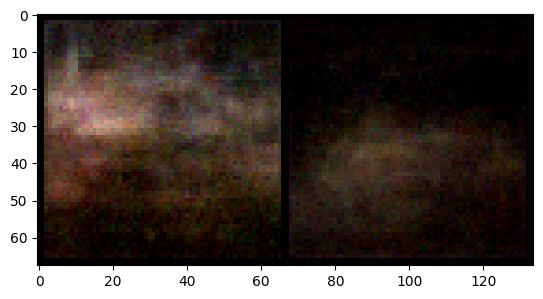

====> Validation Epoch: 40 Average loss: 271.8590
====> Epoch: 41 Average loss: 7.0178
====> Epoch: 41 Average Reconstruction loss: 6.8464
====> Epoch: 41 Average KL loss: 0.1714
Original Samples:


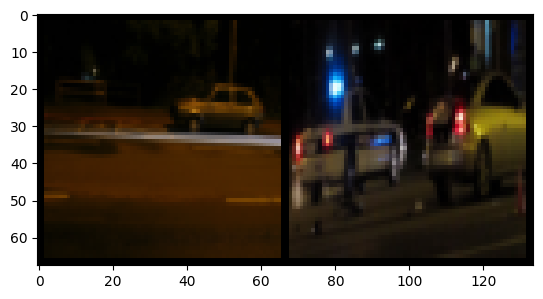

Generated Generated:


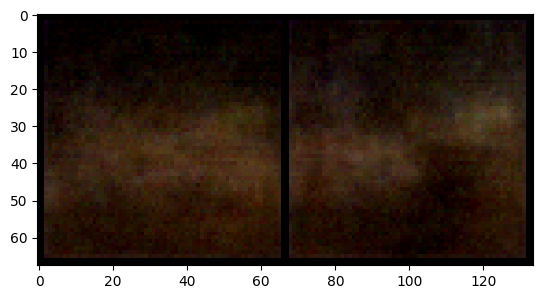

====> Validation Epoch: 41 Average loss: 271.4271
====> Epoch: 42 Average loss: 7.0228
====> Epoch: 42 Average Reconstruction loss: 6.8493
====> Epoch: 42 Average KL loss: 0.1735
Original Samples:


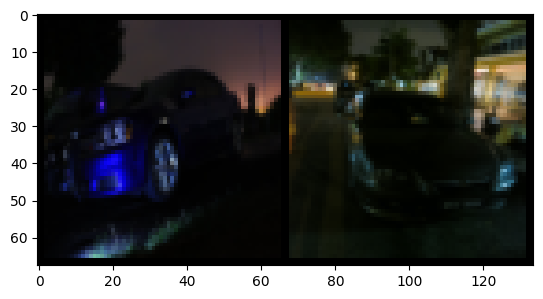

Generated Generated:


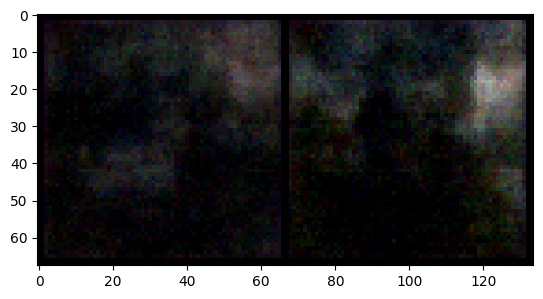

====> Validation Epoch: 42 Average loss: 273.6241
====> Epoch: 43 Average loss: 7.5187
====> Epoch: 43 Average Reconstruction loss: 7.3387
====> Epoch: 43 Average KL loss: 0.1800
Original Samples:


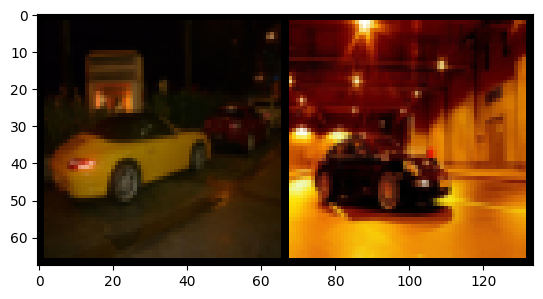

Generated Generated:


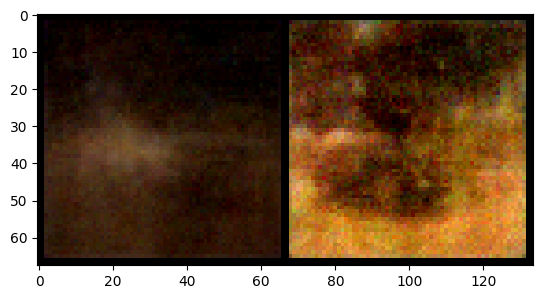

====> Validation Epoch: 43 Average loss: 272.2639
====> Epoch: 44 Average loss: 7.1672
====> Epoch: 44 Average Reconstruction loss: 6.9883
====> Epoch: 44 Average KL loss: 0.1790
Original Samples:


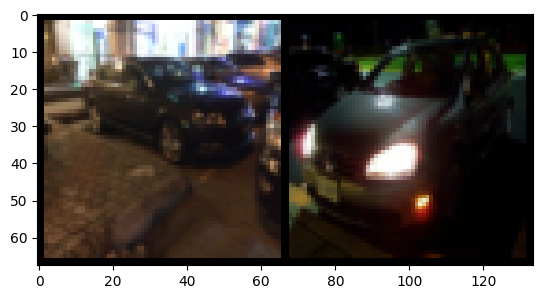

Generated Generated:


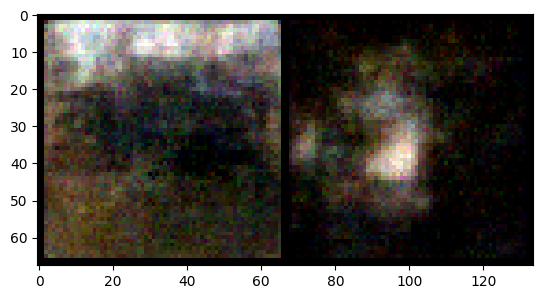

====> Validation Epoch: 44 Average loss: 273.1735
====> Epoch: 45 Average loss: 7.3395
====> Epoch: 45 Average Reconstruction loss: 7.1610
====> Epoch: 45 Average KL loss: 0.1786
Original Samples:


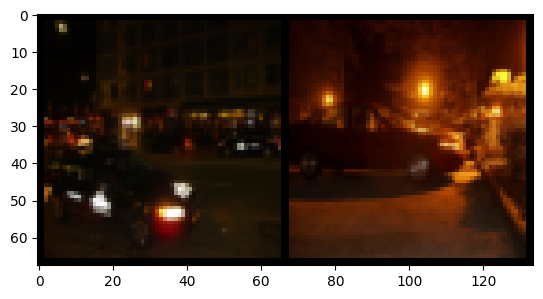

Generated Generated:


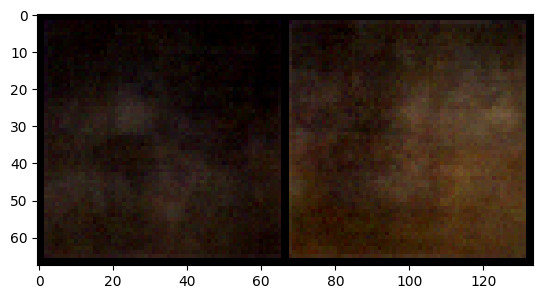

====> Validation Epoch: 45 Average loss: 272.7674
====> Epoch: 46 Average loss: 7.0067
====> Epoch: 46 Average Reconstruction loss: 6.8280
====> Epoch: 46 Average KL loss: 0.1788
Original Samples:


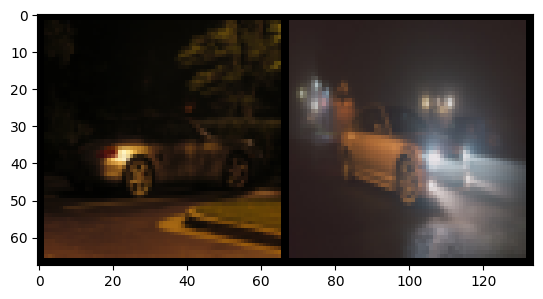

Generated Generated:


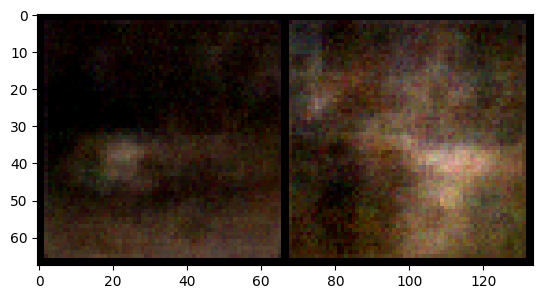

====> Validation Epoch: 46 Average loss: 270.4756
====> Epoch: 47 Average loss: 7.3379
====> Epoch: 47 Average Reconstruction loss: 7.1609
====> Epoch: 47 Average KL loss: 0.1770
Original Samples:


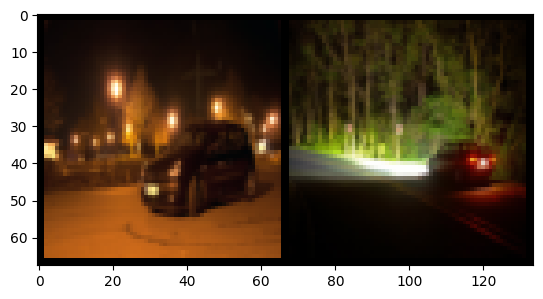

Generated Generated:


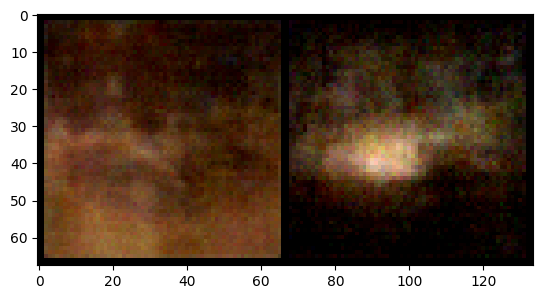

====> Validation Epoch: 47 Average loss: 271.7527
====> Epoch: 48 Average loss: 6.7743
====> Epoch: 48 Average Reconstruction loss: 6.6045
====> Epoch: 48 Average KL loss: 0.1698
Original Samples:


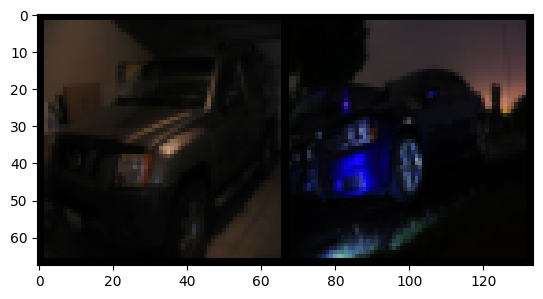

Generated Generated:


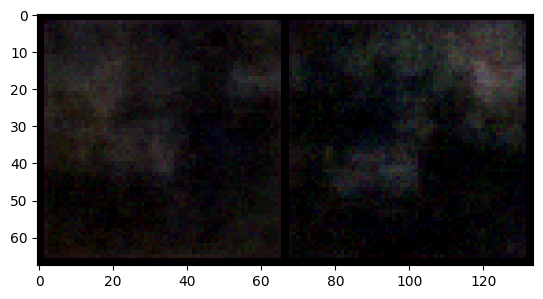

====> Validation Epoch: 48 Average loss: 273.7450
====> Epoch: 49 Average loss: 6.8877
====> Epoch: 49 Average Reconstruction loss: 6.7121
====> Epoch: 49 Average KL loss: 0.1757
Original Samples:


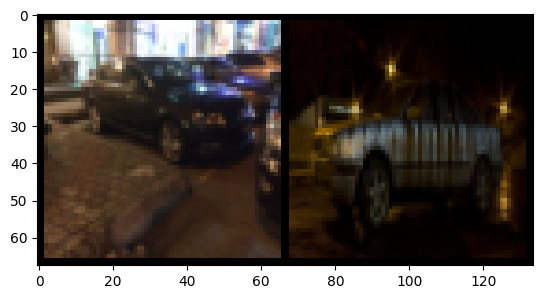

Generated Generated:


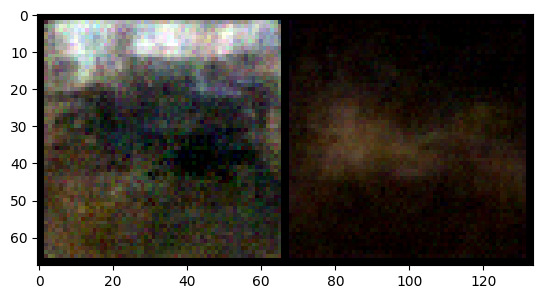

====> Validation Epoch: 49 Average loss: 273.1893
====> Epoch: 50 Average loss: 7.8863
====> Epoch: 50 Average Reconstruction loss: 7.7047
====> Epoch: 50 Average KL loss: 0.1816
Original Samples:


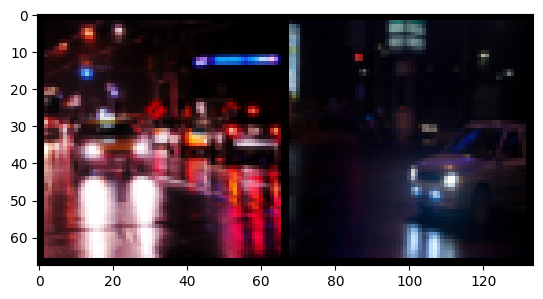

Generated Generated:


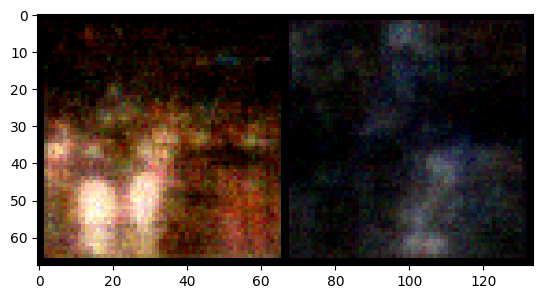

====> Validation Epoch: 50 Average loss: 270.6758
====> Epoch: 51 Average loss: 6.7720
====> Epoch: 51 Average Reconstruction loss: 6.5922
====> Epoch: 51 Average KL loss: 0.1797
Original Samples:


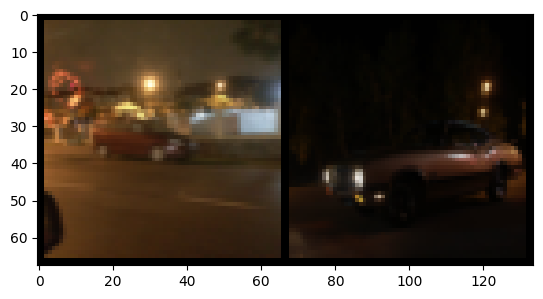

Generated Generated:


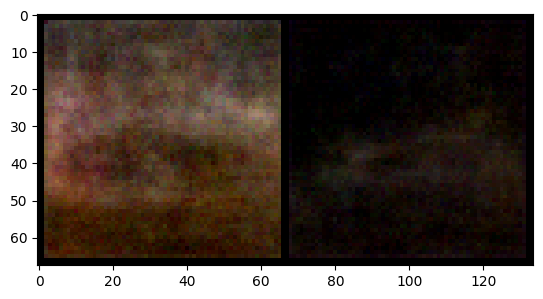

====> Validation Epoch: 51 Average loss: 271.6831
====> Epoch: 52 Average loss: 7.4605
====> Epoch: 52 Average Reconstruction loss: 7.2820
====> Epoch: 52 Average KL loss: 0.1784
Original Samples:


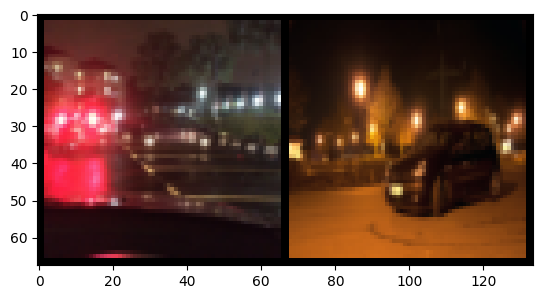

Generated Generated:


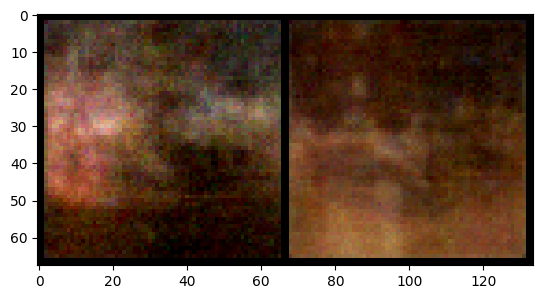

====> Validation Epoch: 52 Average loss: 274.1061
====> Epoch: 53 Average loss: 6.9164
====> Epoch: 53 Average Reconstruction loss: 6.7416
====> Epoch: 53 Average KL loss: 0.1747
Original Samples:


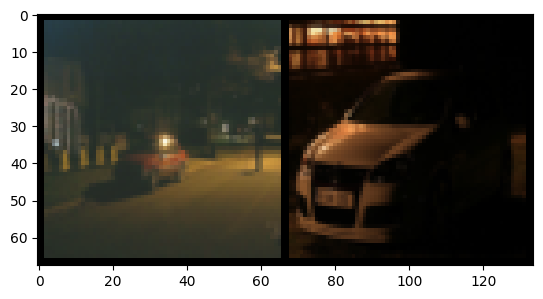

Generated Generated:


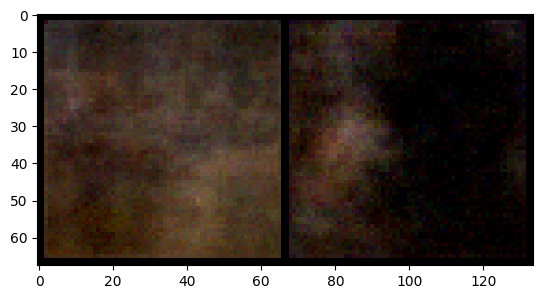

====> Validation Epoch: 53 Average loss: 273.3122
====> Epoch: 54 Average loss: 7.5824
====> Epoch: 54 Average Reconstruction loss: 7.4052
====> Epoch: 54 Average KL loss: 0.1772
Original Samples:


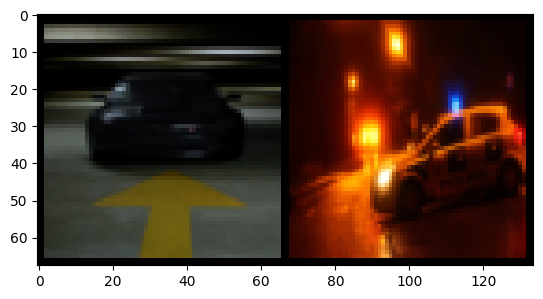

Generated Generated:


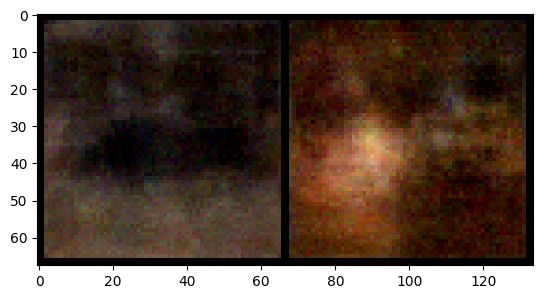

====> Validation Epoch: 54 Average loss: 272.4015
====> Epoch: 55 Average loss: 6.6280
====> Epoch: 55 Average Reconstruction loss: 6.4531
====> Epoch: 55 Average KL loss: 0.1749
Original Samples:


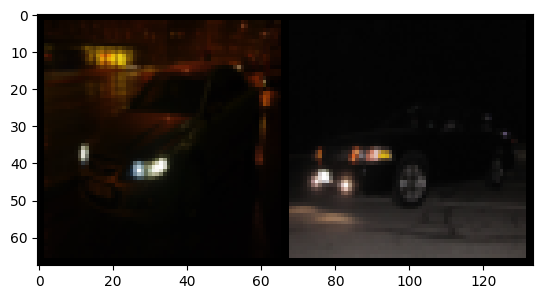

Generated Generated:


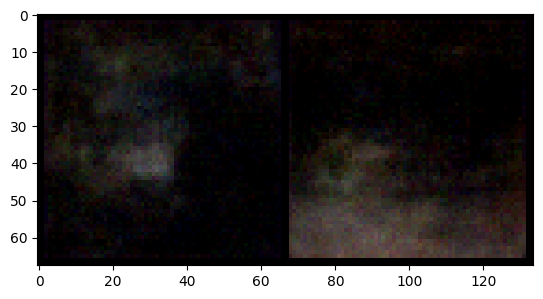

====> Validation Epoch: 55 Average loss: 272.0790
====> Epoch: 56 Average loss: 6.5649
====> Epoch: 56 Average Reconstruction loss: 6.3877
====> Epoch: 56 Average KL loss: 0.1772
Original Samples:


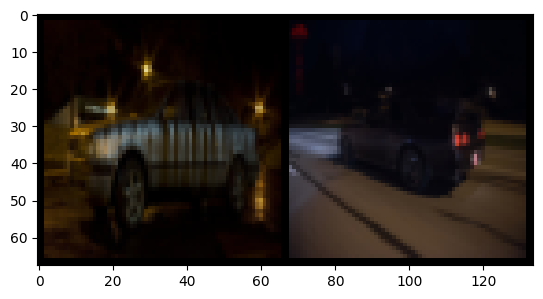

Generated Generated:


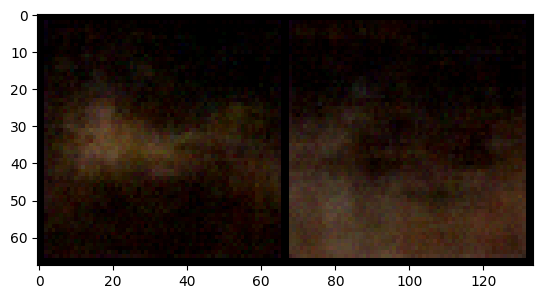

====> Validation Epoch: 56 Average loss: 274.3893
====> Epoch: 57 Average loss: 6.9053
====> Epoch: 57 Average Reconstruction loss: 6.7261
====> Epoch: 57 Average KL loss: 0.1792
Original Samples:


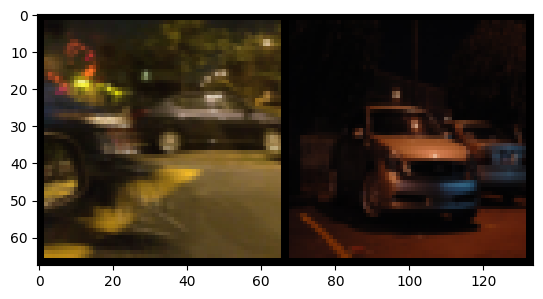

Generated Generated:


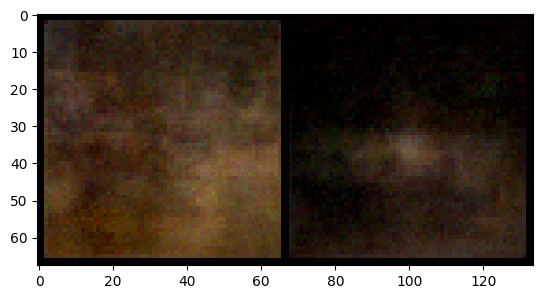

====> Validation Epoch: 57 Average loss: 275.5812
====> Epoch: 58 Average loss: 7.9111
====> Epoch: 58 Average Reconstruction loss: 7.7317
====> Epoch: 58 Average KL loss: 0.1793
Original Samples:


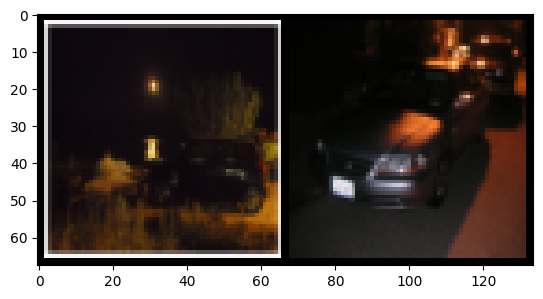

Generated Generated:


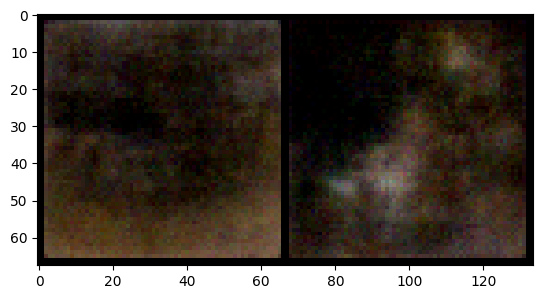

====> Validation Epoch: 58 Average loss: 274.9662
====> Epoch: 59 Average loss: 7.2729
====> Epoch: 59 Average Reconstruction loss: 7.0926
====> Epoch: 59 Average KL loss: 0.1803
Original Samples:


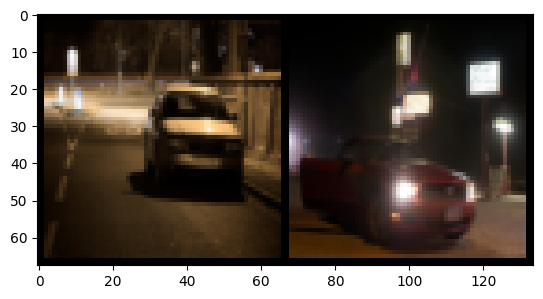

Generated Generated:


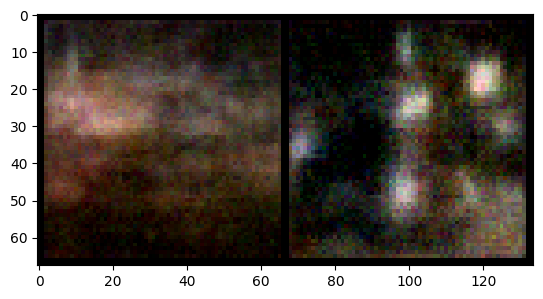

====> Validation Epoch: 59 Average loss: 271.9427
====> Epoch: 60 Average loss: 6.8558
====> Epoch: 60 Average Reconstruction loss: 6.6762
====> Epoch: 60 Average KL loss: 0.1797
Original Samples:


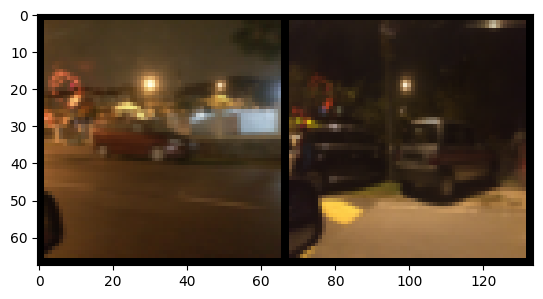

Generated Generated:


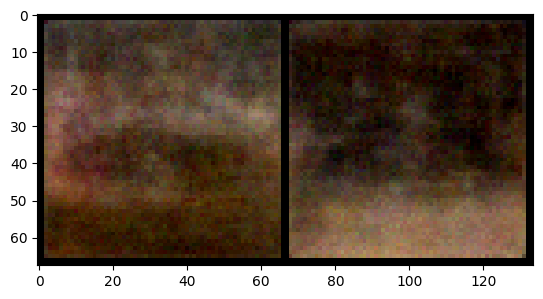

====> Validation Epoch: 60 Average loss: 272.6305
====> Epoch: 61 Average loss: 6.6993
====> Epoch: 61 Average Reconstruction loss: 6.5209
====> Epoch: 61 Average KL loss: 0.1784
Original Samples:


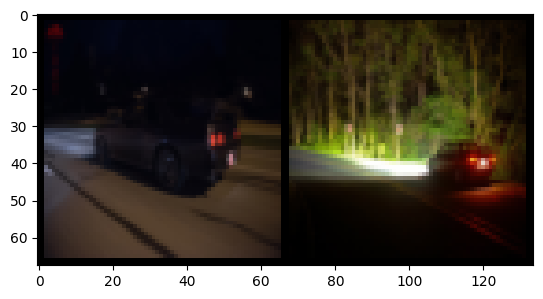

Generated Generated:


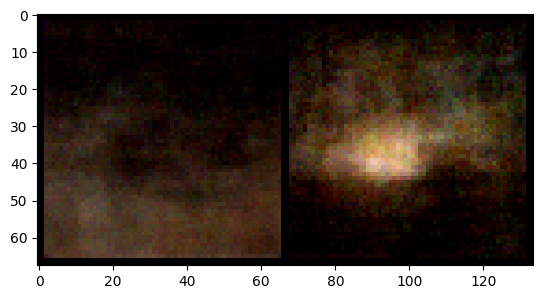

====> Validation Epoch: 61 Average loss: 275.2294
====> Epoch: 62 Average loss: 6.8094
====> Epoch: 62 Average Reconstruction loss: 6.6312
====> Epoch: 62 Average KL loss: 0.1781
Original Samples:


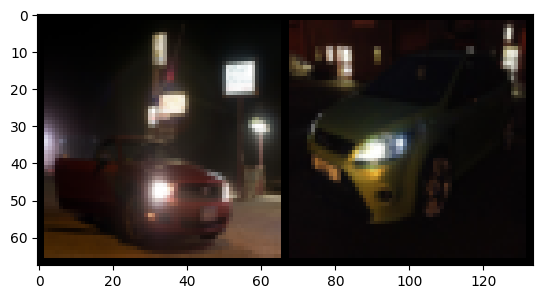

Generated Generated:


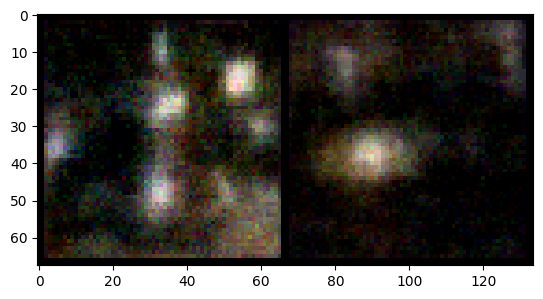

====> Validation Epoch: 62 Average loss: 272.3842
====> Epoch: 63 Average loss: 7.0713
====> Epoch: 63 Average Reconstruction loss: 6.8968
====> Epoch: 63 Average KL loss: 0.1745
Original Samples:


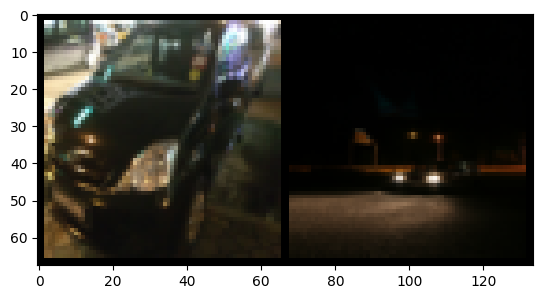

Generated Generated:


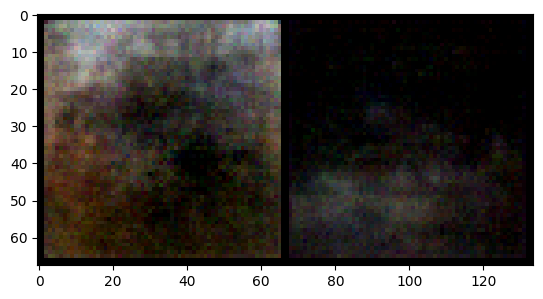

====> Validation Epoch: 63 Average loss: 270.3527
====> Epoch: 64 Average loss: 6.6359
====> Epoch: 64 Average Reconstruction loss: 6.4642
====> Epoch: 64 Average KL loss: 0.1717
Original Samples:


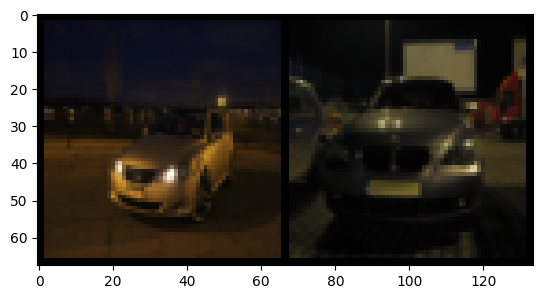

Generated Generated:


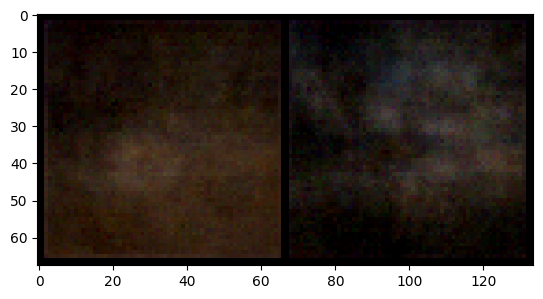

====> Validation Epoch: 64 Average loss: 273.9352
====> Epoch: 65 Average loss: 6.6775
====> Epoch: 65 Average Reconstruction loss: 6.4994
====> Epoch: 65 Average KL loss: 0.1781
Original Samples:


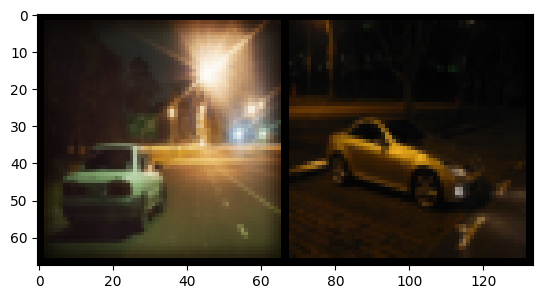

Generated Generated:


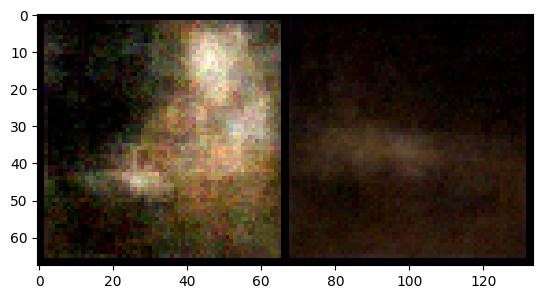

====> Validation Epoch: 65 Average loss: 276.8535
====> Epoch: 66 Average loss: 7.2414
====> Epoch: 66 Average Reconstruction loss: 7.0607
====> Epoch: 66 Average KL loss: 0.1807
Original Samples:


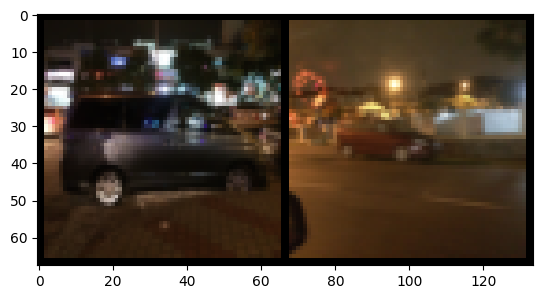

Generated Generated:


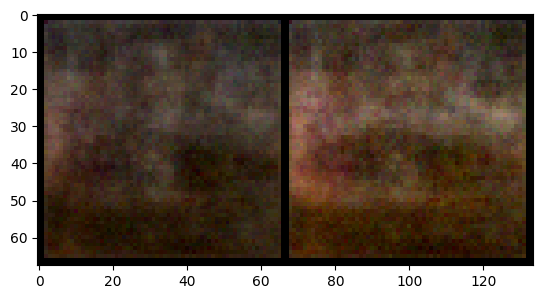

====> Validation Epoch: 66 Average loss: 273.4709
====> Epoch: 67 Average loss: 6.9368
====> Epoch: 67 Average Reconstruction loss: 6.7578
====> Epoch: 67 Average KL loss: 0.1791
Original Samples:


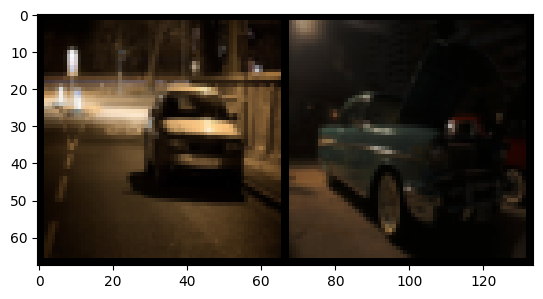

Generated Generated:


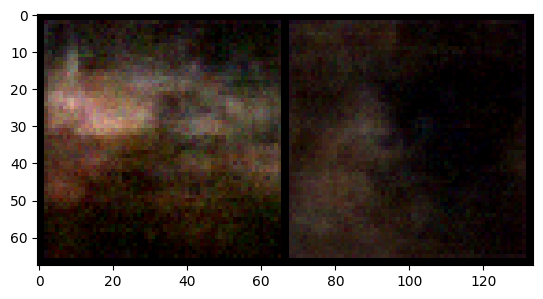

====> Validation Epoch: 67 Average loss: 273.7806
====> Epoch: 68 Average loss: 7.1248
====> Epoch: 68 Average Reconstruction loss: 6.9468
====> Epoch: 68 Average KL loss: 0.1780
Original Samples:


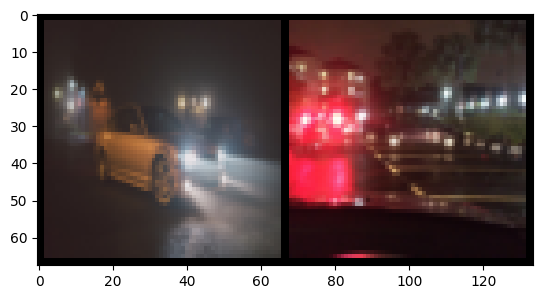

Generated Generated:


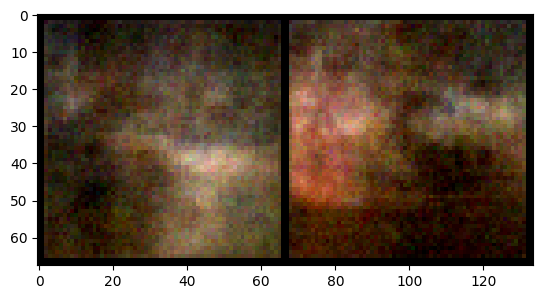

====> Validation Epoch: 68 Average loss: 274.1307
====> Epoch: 69 Average loss: 6.5171
====> Epoch: 69 Average Reconstruction loss: 6.3447
====> Epoch: 69 Average KL loss: 0.1724
Original Samples:


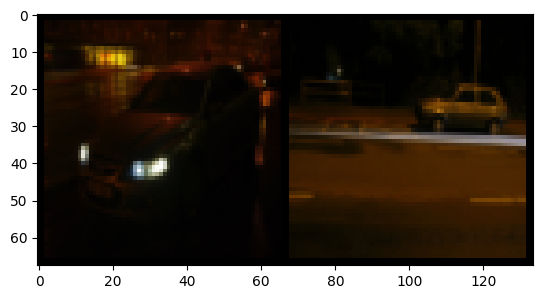

Generated Generated:


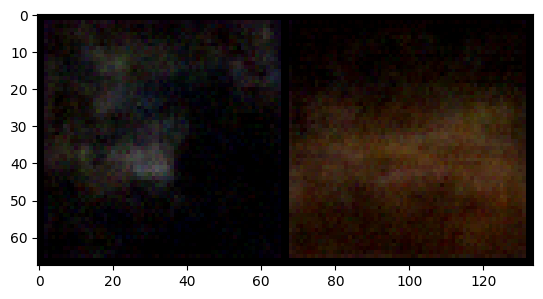

====> Validation Epoch: 69 Average loss: 275.7345
====> Epoch: 70 Average loss: 6.5553
====> Epoch: 70 Average Reconstruction loss: 6.3832
====> Epoch: 70 Average KL loss: 0.1721
Original Samples:


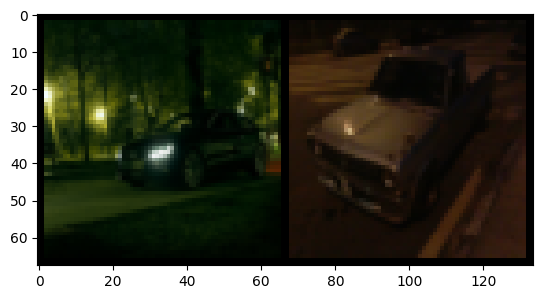

Generated Generated:


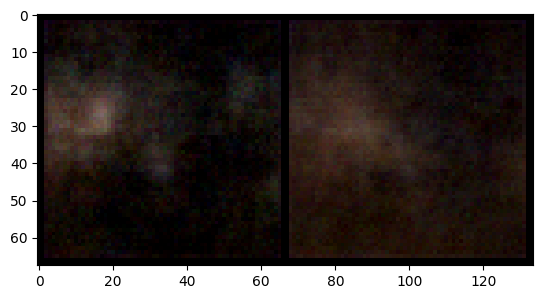

====> Validation Epoch: 70 Average loss: 274.5412
====> Epoch: 71 Average loss: 7.0541
====> Epoch: 71 Average Reconstruction loss: 6.8791
====> Epoch: 71 Average KL loss: 0.1750
Original Samples:


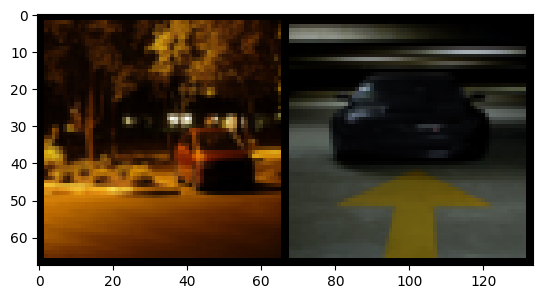

Generated Generated:


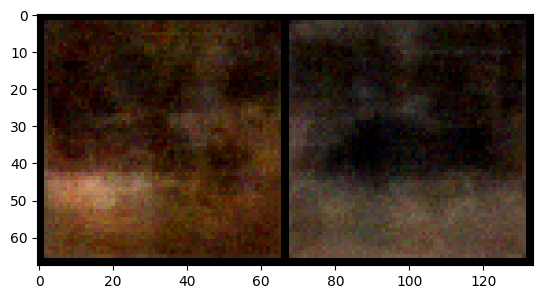

====> Validation Epoch: 71 Average loss: 275.6446
====> Epoch: 72 Average loss: 7.2240
====> Epoch: 72 Average Reconstruction loss: 7.0470
====> Epoch: 72 Average KL loss: 0.1769
Original Samples:


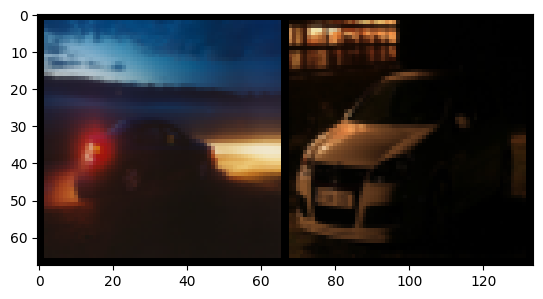

Generated Generated:


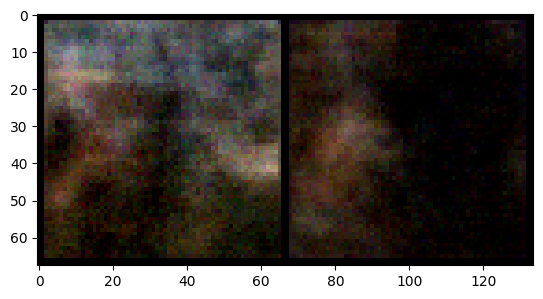

====> Validation Epoch: 72 Average loss: 273.3659
====> Epoch: 73 Average loss: 6.9115
====> Epoch: 73 Average Reconstruction loss: 6.7338
====> Epoch: 73 Average KL loss: 0.1777
Original Samples:


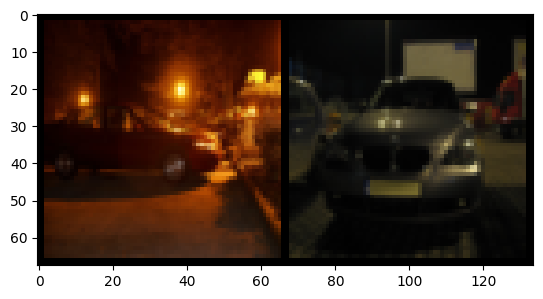

Generated Generated:


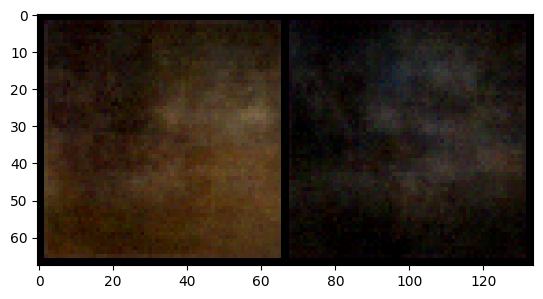

====> Validation Epoch: 73 Average loss: 273.5121
====> Epoch: 74 Average loss: 6.5972
====> Epoch: 74 Average Reconstruction loss: 6.4168
====> Epoch: 74 Average KL loss: 0.1804
Original Samples:


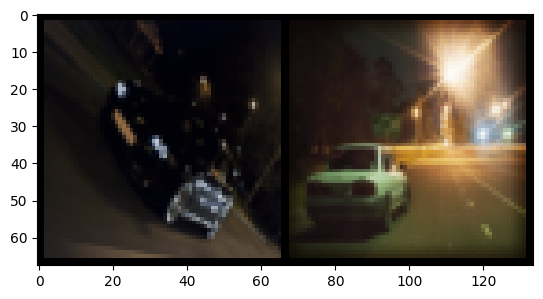

Generated Generated:


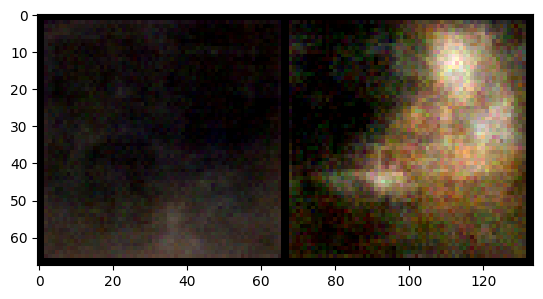

====> Validation Epoch: 74 Average loss: 274.7499
====> Epoch: 75 Average loss: 6.7927
====> Epoch: 75 Average Reconstruction loss: 6.6132
====> Epoch: 75 Average KL loss: 0.1795
Original Samples:


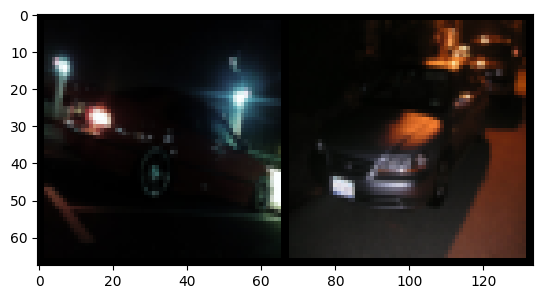

Generated Generated:


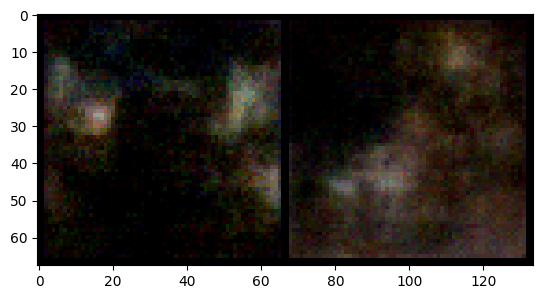

====> Validation Epoch: 75 Average loss: 278.0227
====> Epoch: 76 Average loss: 6.8692
====> Epoch: 76 Average Reconstruction loss: 6.6892
====> Epoch: 76 Average KL loss: 0.1800
Original Samples:


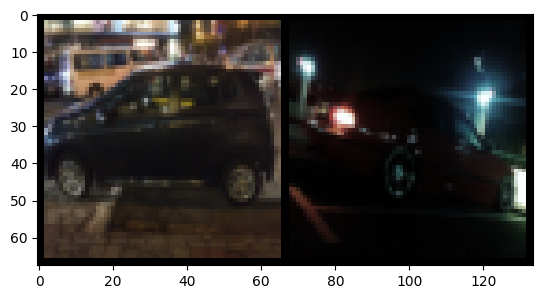

Generated Generated:


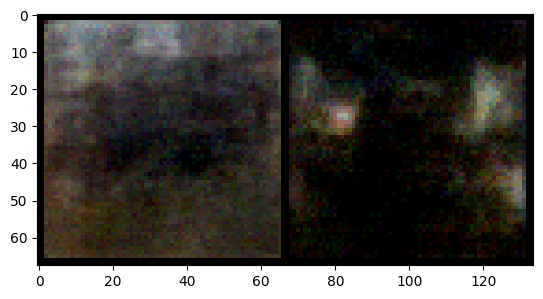

====> Validation Epoch: 76 Average loss: 277.0370
====> Epoch: 77 Average loss: 7.1347
====> Epoch: 77 Average Reconstruction loss: 6.9545
====> Epoch: 77 Average KL loss: 0.1801
Original Samples:


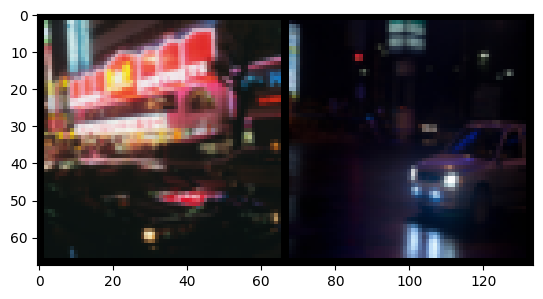

Generated Generated:


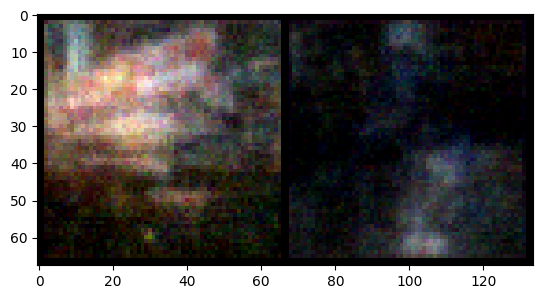

====> Validation Epoch: 77 Average loss: 275.6257
====> Epoch: 78 Average loss: 6.8384
====> Epoch: 78 Average Reconstruction loss: 6.6625
====> Epoch: 78 Average KL loss: 0.1758
Original Samples:


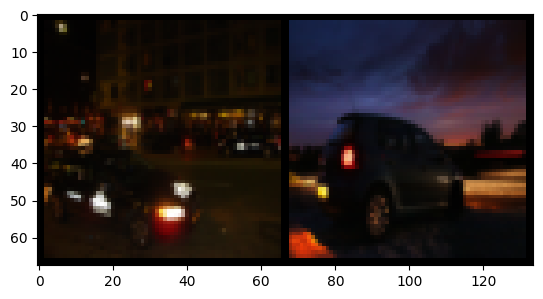

Generated Generated:


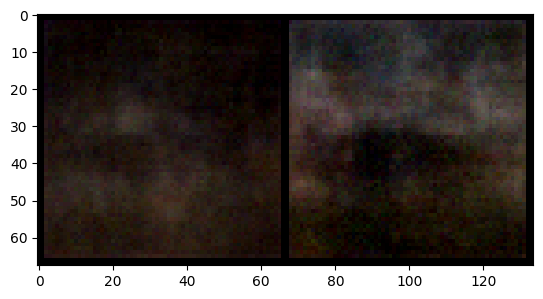

====> Validation Epoch: 78 Average loss: 271.2016
====> Epoch: 79 Average loss: 6.4659
====> Epoch: 79 Average Reconstruction loss: 6.2915
====> Epoch: 79 Average KL loss: 0.1744
Original Samples:


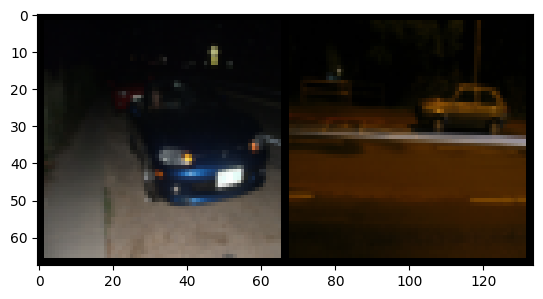

Generated Generated:


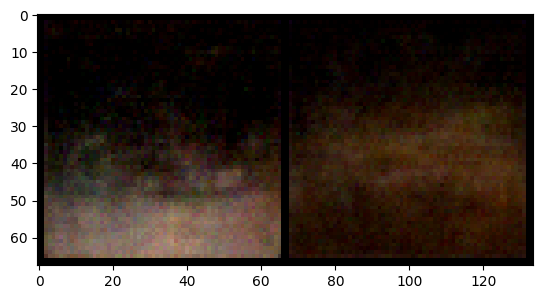

====> Validation Epoch: 79 Average loss: 271.3821
====> Epoch: 80 Average loss: 7.4203
====> Epoch: 80 Average Reconstruction loss: 7.2423
====> Epoch: 80 Average KL loss: 0.1780
Original Samples:


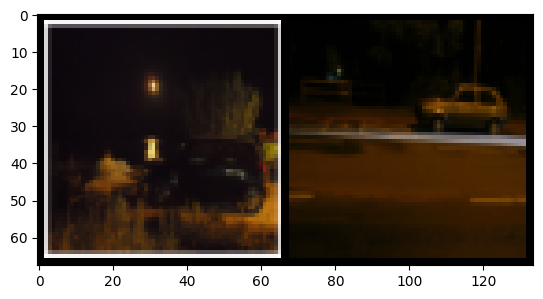

Generated Generated:


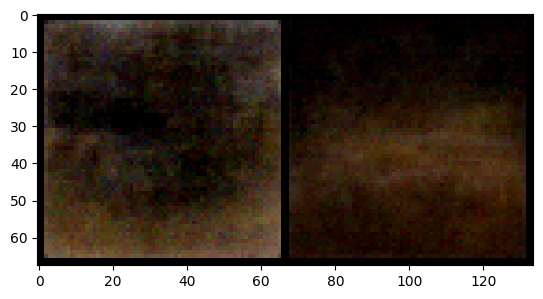

====> Validation Epoch: 80 Average loss: 279.2202
====> Epoch: 81 Average loss: 6.9487
====> Epoch: 81 Average Reconstruction loss: 6.7692
====> Epoch: 81 Average KL loss: 0.1795
Original Samples:


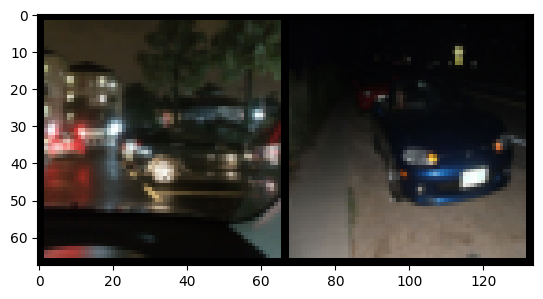

Generated Generated:


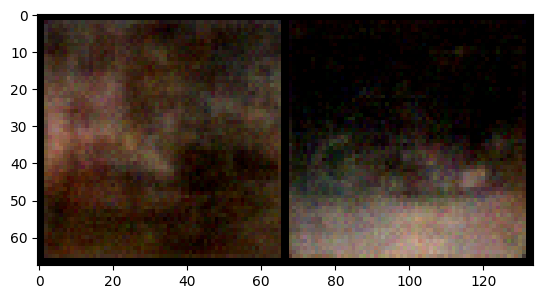

====> Validation Epoch: 81 Average loss: 282.3906
====> Epoch: 82 Average loss: 6.7954
====> Epoch: 82 Average Reconstruction loss: 6.6192
====> Epoch: 82 Average KL loss: 0.1762
Original Samples:


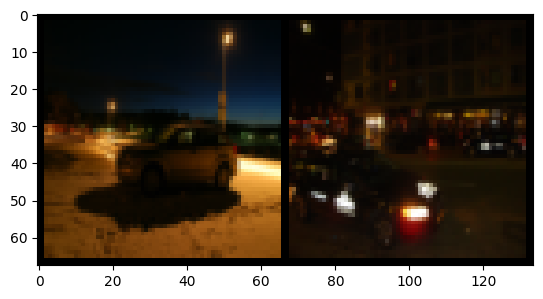

Generated Generated:


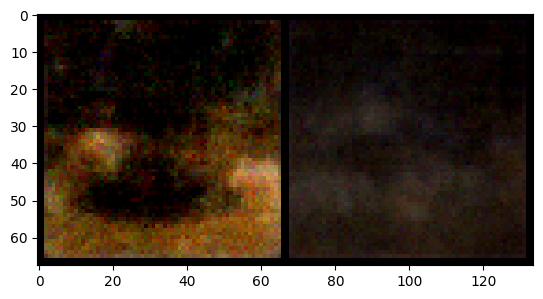

====> Validation Epoch: 82 Average loss: 275.9169
====> Epoch: 83 Average loss: 6.3850
====> Epoch: 83 Average Reconstruction loss: 6.2138
====> Epoch: 83 Average KL loss: 0.1712
Original Samples:


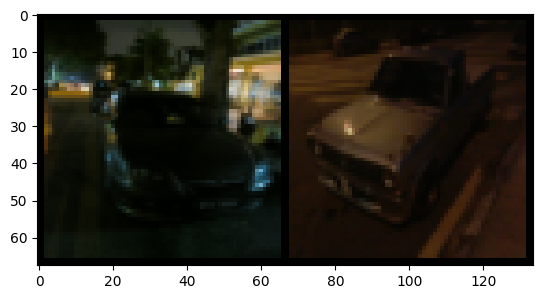

Generated Generated:


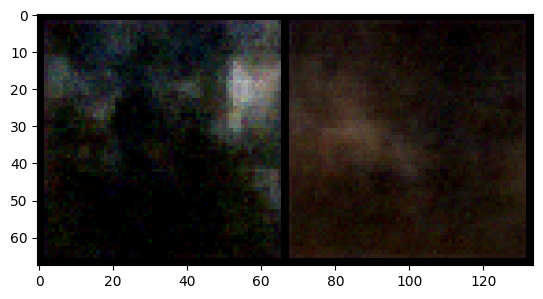

====> Validation Epoch: 83 Average loss: 275.7863
====> Epoch: 84 Average loss: 6.7941
====> Epoch: 84 Average Reconstruction loss: 6.6239
====> Epoch: 84 Average KL loss: 0.1702
Original Samples:


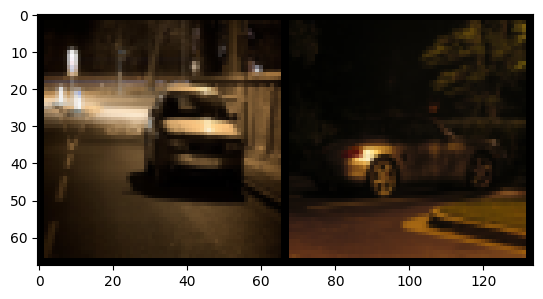

Generated Generated:


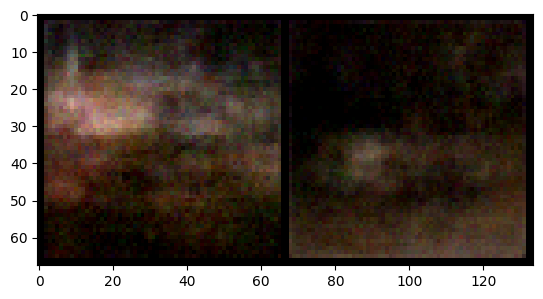

====> Validation Epoch: 84 Average loss: 280.3150
====> Epoch: 85 Average loss: 6.3593
====> Epoch: 85 Average Reconstruction loss: 6.1864
====> Epoch: 85 Average KL loss: 0.1729
Original Samples:


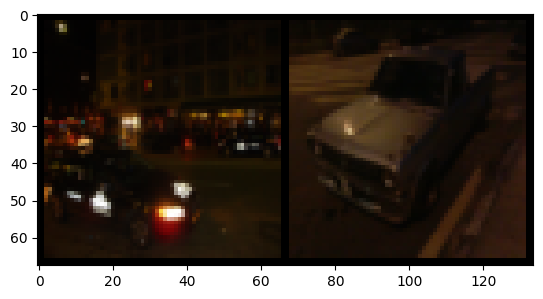

Generated Generated:


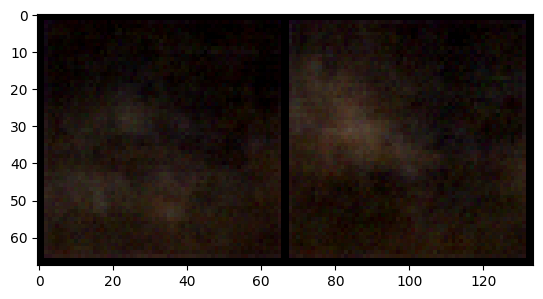

====> Validation Epoch: 85 Average loss: 276.9661
====> Epoch: 86 Average loss: 7.3981
====> Epoch: 86 Average Reconstruction loss: 7.2207
====> Epoch: 86 Average KL loss: 0.1774
Original Samples:


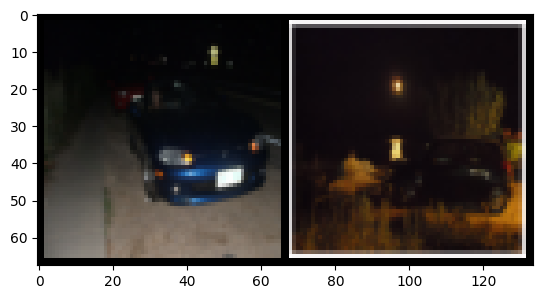

Generated Generated:


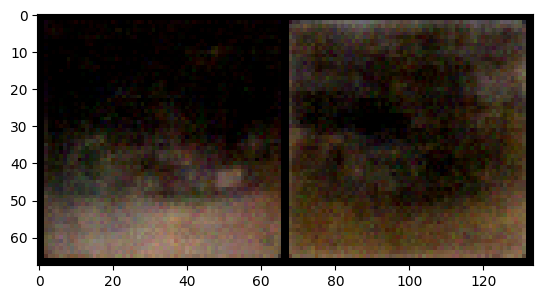

====> Validation Epoch: 86 Average loss: 277.4760
====> Epoch: 87 Average loss: 6.3401
====> Epoch: 87 Average Reconstruction loss: 6.1644
====> Epoch: 87 Average KL loss: 0.1757
Original Samples:


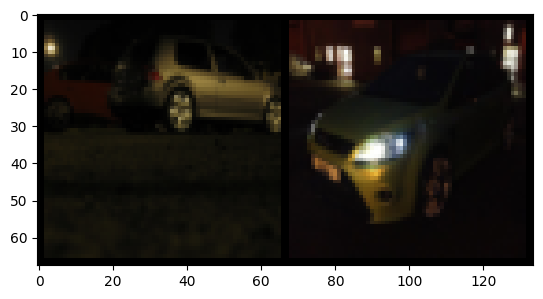

Generated Generated:


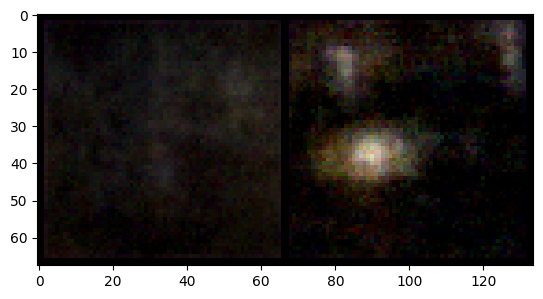

====> Validation Epoch: 87 Average loss: 275.3851
====> Epoch: 88 Average loss: 6.3470
====> Epoch: 88 Average Reconstruction loss: 6.1686
====> Epoch: 88 Average KL loss: 0.1784
Original Samples:


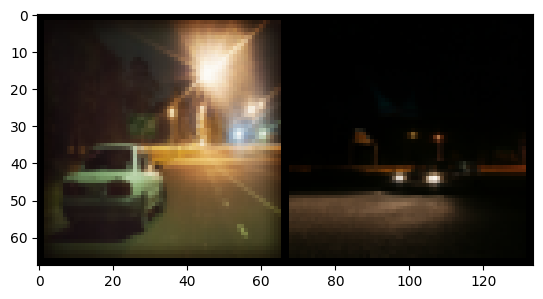

Generated Generated:


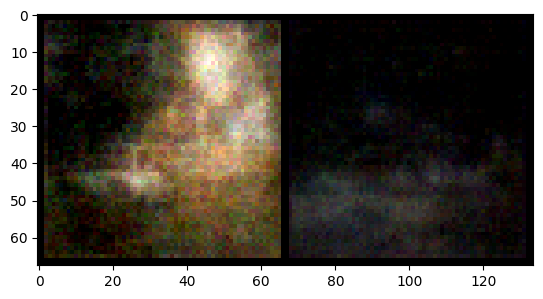

====> Validation Epoch: 88 Average loss: 278.4567
====> Epoch: 89 Average loss: 6.4719
====> Epoch: 89 Average Reconstruction loss: 6.2958
====> Epoch: 89 Average KL loss: 0.1761
Original Samples:


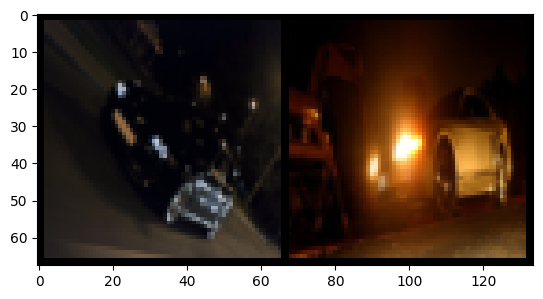

Generated Generated:


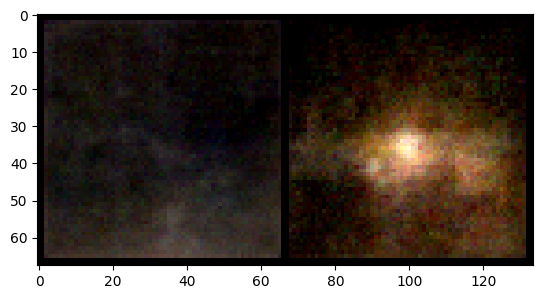

====> Validation Epoch: 89 Average loss: 275.0490
====> Epoch: 90 Average loss: 6.5876
====> Epoch: 90 Average Reconstruction loss: 6.4116
====> Epoch: 90 Average KL loss: 0.1760
Original Samples:


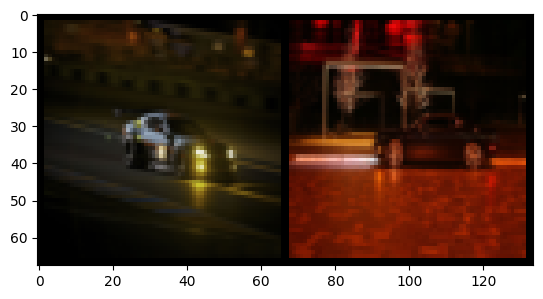

Generated Generated:


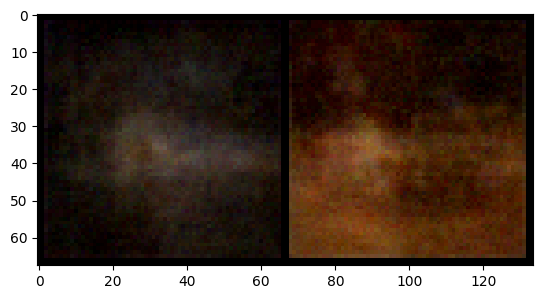

====> Validation Epoch: 90 Average loss: 274.2174
====> Epoch: 91 Average loss: 6.8379
====> Epoch: 91 Average Reconstruction loss: 6.6604
====> Epoch: 91 Average KL loss: 0.1775
Original Samples:


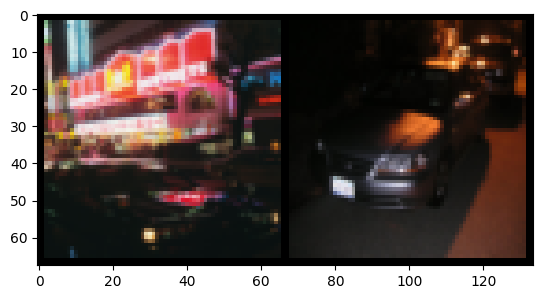

Generated Generated:


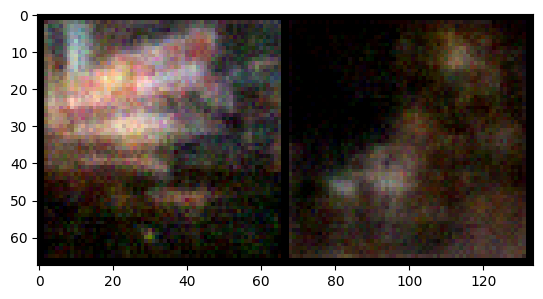

====> Validation Epoch: 91 Average loss: 276.8041
====> Epoch: 92 Average loss: 6.7226
====> Epoch: 92 Average Reconstruction loss: 6.5453
====> Epoch: 92 Average KL loss: 0.1773
Original Samples:


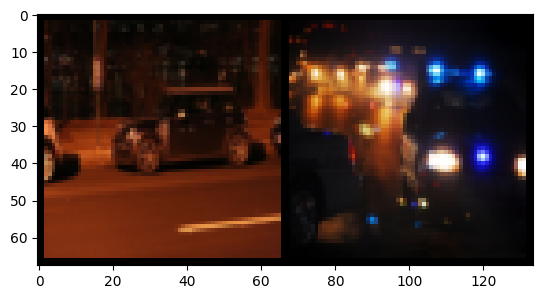

Generated Generated:


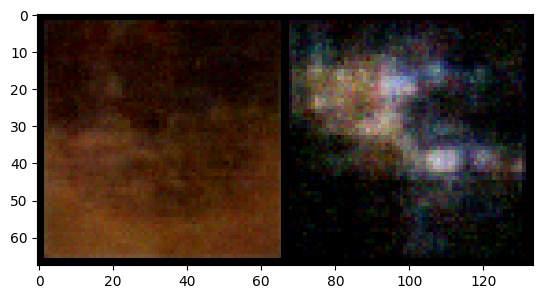

====> Validation Epoch: 92 Average loss: 281.2336
====> Epoch: 93 Average loss: 6.4508
====> Epoch: 93 Average Reconstruction loss: 6.2769
====> Epoch: 93 Average KL loss: 0.1739
Original Samples:


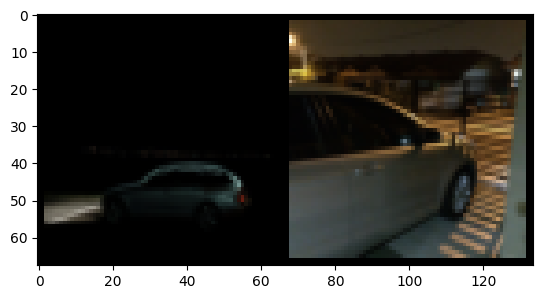

Generated Generated:


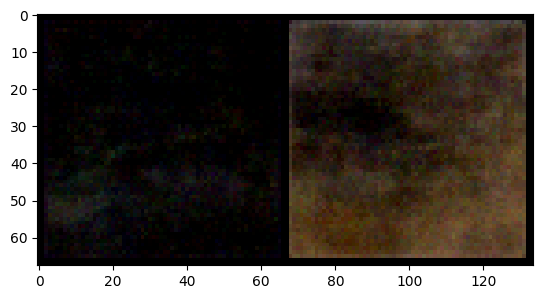

====> Validation Epoch: 93 Average loss: 273.4683
====> Epoch: 94 Average loss: 6.4194
====> Epoch: 94 Average Reconstruction loss: 6.2460
====> Epoch: 94 Average KL loss: 0.1733
Original Samples:


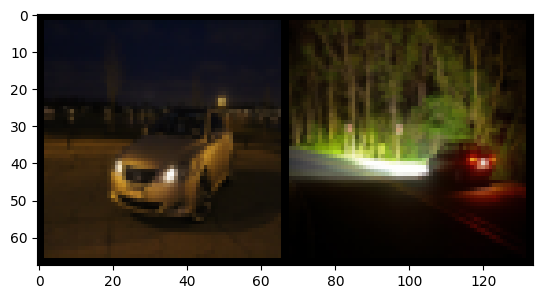

Generated Generated:


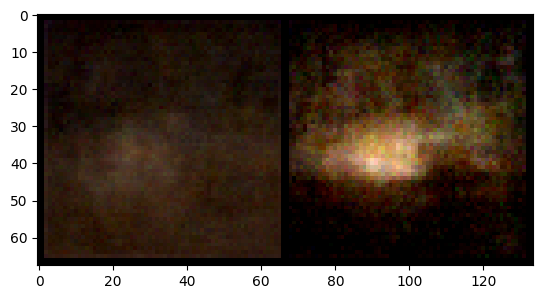

====> Validation Epoch: 94 Average loss: 274.5867
====> Epoch: 95 Average loss: 6.2069
====> Epoch: 95 Average Reconstruction loss: 6.0335
====> Epoch: 95 Average KL loss: 0.1734
Original Samples:


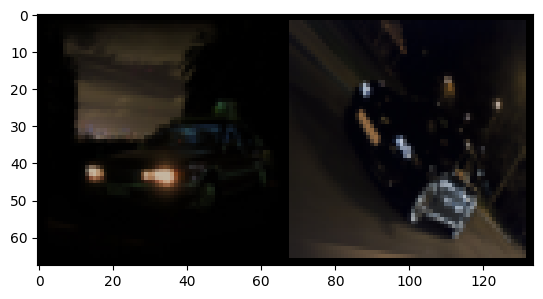

Generated Generated:


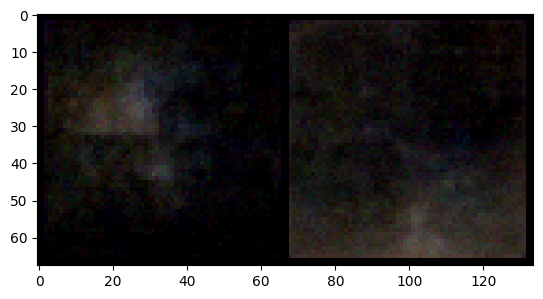

====> Validation Epoch: 95 Average loss: 278.4750
====> Epoch: 96 Average loss: 6.2467
====> Epoch: 96 Average Reconstruction loss: 6.0699
====> Epoch: 96 Average KL loss: 0.1768
Original Samples:


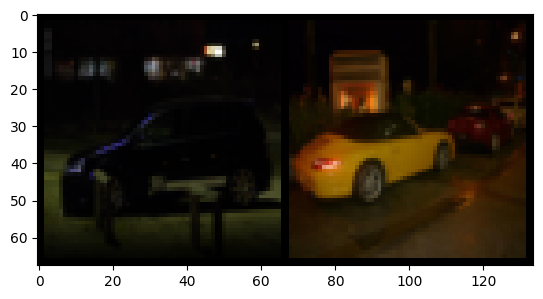

Generated Generated:


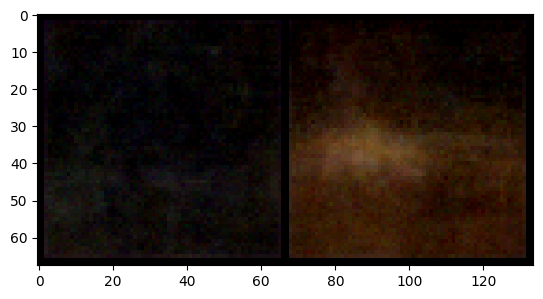

====> Validation Epoch: 96 Average loss: 279.0825
====> Epoch: 97 Average loss: 6.1983
====> Epoch: 97 Average Reconstruction loss: 6.0217
====> Epoch: 97 Average KL loss: 0.1766
Original Samples:


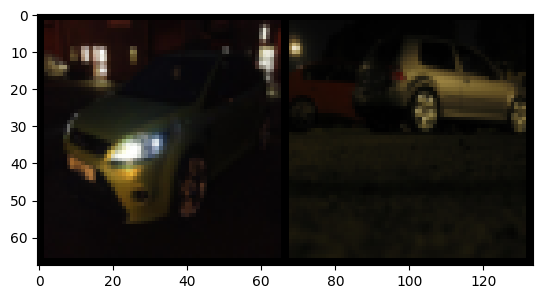

Generated Generated:


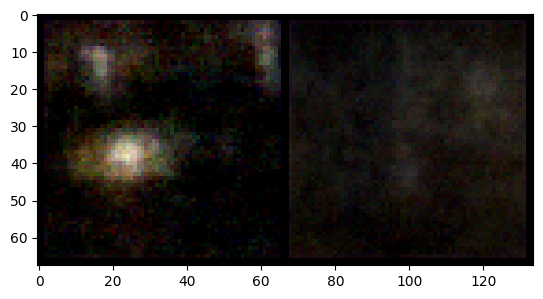

====> Validation Epoch: 97 Average loss: 273.6440
====> Epoch: 98 Average loss: 7.5340
====> Epoch: 98 Average Reconstruction loss: 7.3536
====> Epoch: 98 Average KL loss: 0.1804
Original Samples:


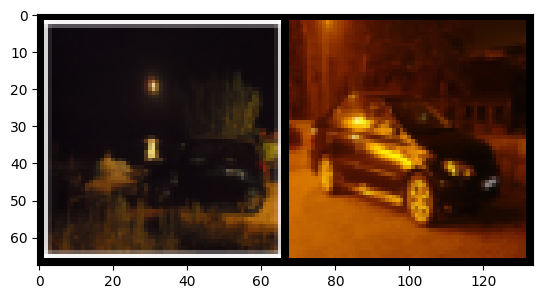

Generated Generated:


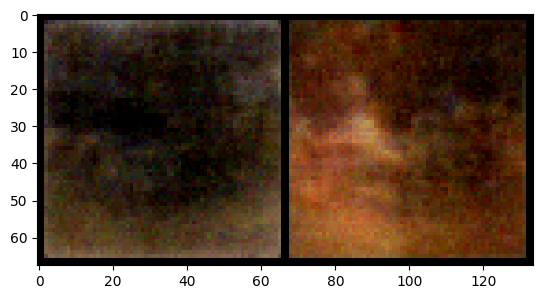

====> Validation Epoch: 98 Average loss: 275.1220
====> Epoch: 99 Average loss: 6.3200
====> Epoch: 99 Average Reconstruction loss: 6.1416
====> Epoch: 99 Average KL loss: 0.1784
Original Samples:


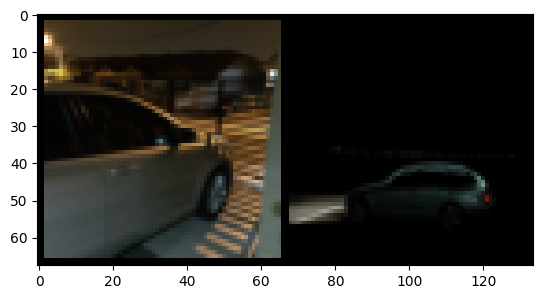

Generated Generated:


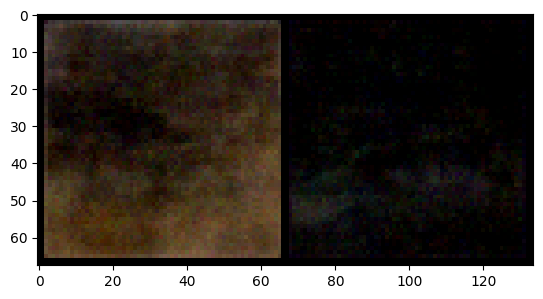

====> Validation Epoch: 99 Average loss: 279.1540
====> Epoch: 100 Average loss: 6.4172
====> Epoch: 100 Average Reconstruction loss: 6.2341
====> Epoch: 100 Average KL loss: 0.1832
Original Samples:


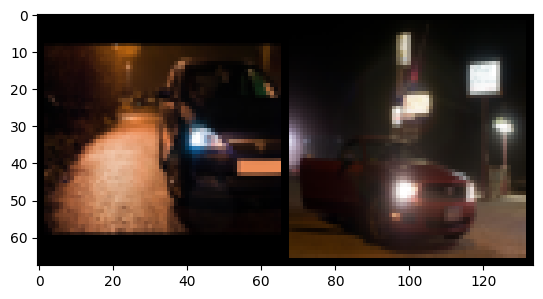

Generated Generated:


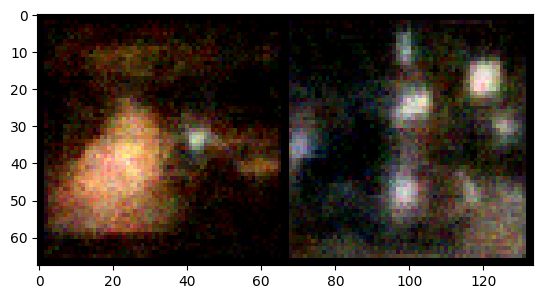

====> Validation Epoch: 100 Average loss: 281.4868
====> Epoch: 101 Average loss: 6.6002
====> Epoch: 101 Average Reconstruction loss: 6.4198
====> Epoch: 101 Average KL loss: 0.1804
Original Samples:


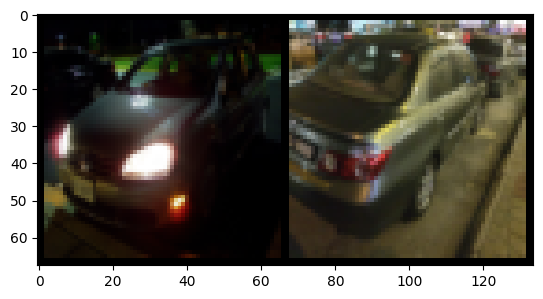

Generated Generated:


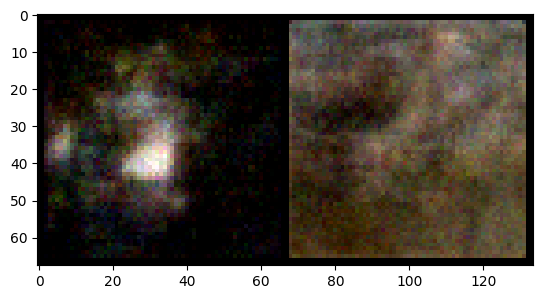

====> Validation Epoch: 101 Average loss: 279.7659
====> Epoch: 102 Average loss: 6.4255
====> Epoch: 102 Average Reconstruction loss: 6.2507
====> Epoch: 102 Average KL loss: 0.1748
Original Samples:


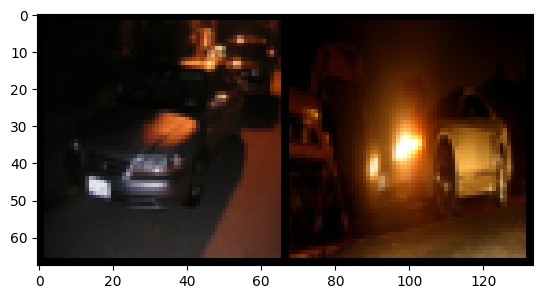

Generated Generated:


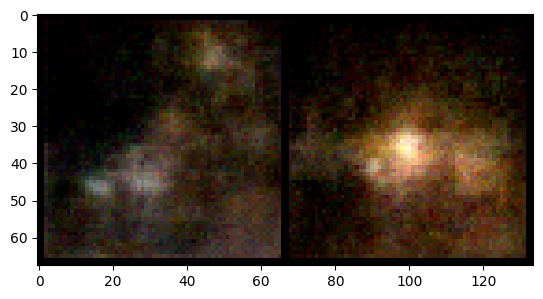

====> Validation Epoch: 102 Average loss: 277.8551
====> Epoch: 103 Average loss: 6.6408
====> Epoch: 103 Average Reconstruction loss: 6.4667
====> Epoch: 103 Average KL loss: 0.1741
Original Samples:


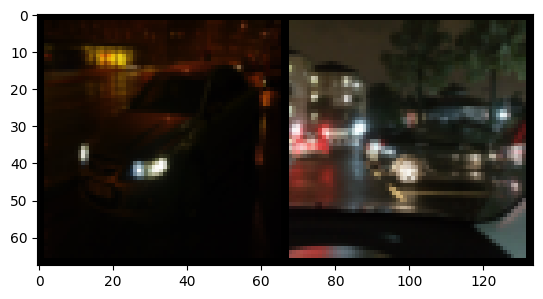

Generated Generated:


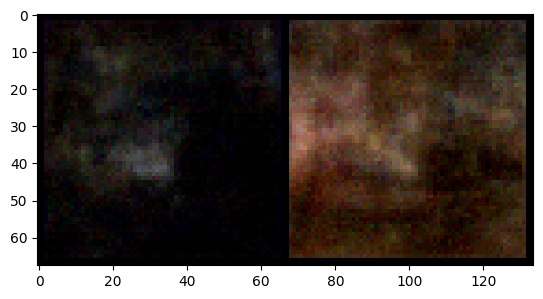

====> Validation Epoch: 103 Average loss: 274.2311
====> Epoch: 104 Average loss: 6.5117
====> Epoch: 104 Average Reconstruction loss: 6.3391
====> Epoch: 104 Average KL loss: 0.1726
Original Samples:


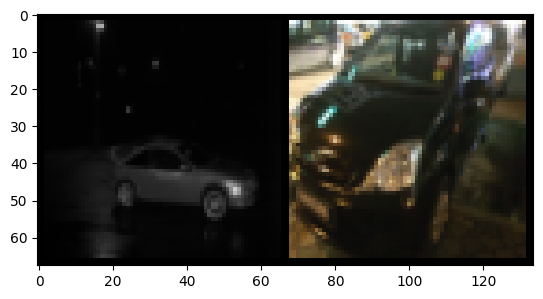

Generated Generated:


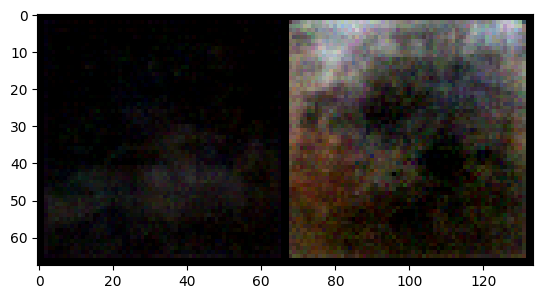

====> Validation Epoch: 104 Average loss: 279.0814
====> Epoch: 105 Average loss: 6.4834
====> Epoch: 105 Average Reconstruction loss: 6.3089
====> Epoch: 105 Average KL loss: 0.1745
Original Samples:


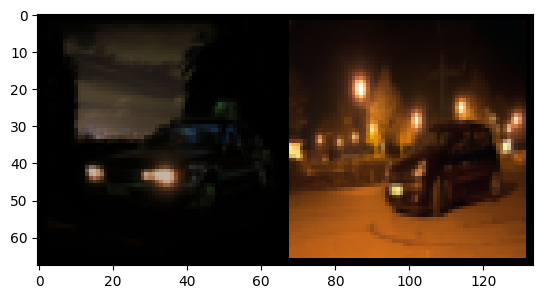

Generated Generated:


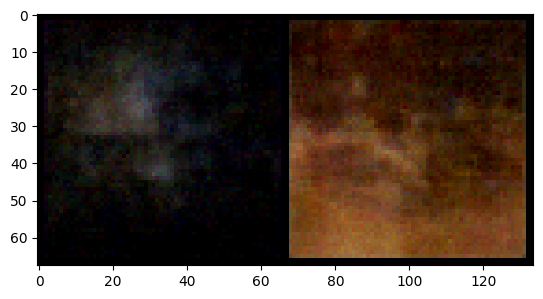

====> Validation Epoch: 105 Average loss: 281.1296
====> Epoch: 106 Average loss: 6.5432
====> Epoch: 106 Average Reconstruction loss: 6.3651
====> Epoch: 106 Average KL loss: 0.1781
Original Samples:


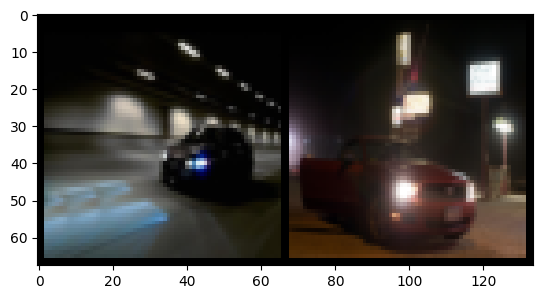

Generated Generated:


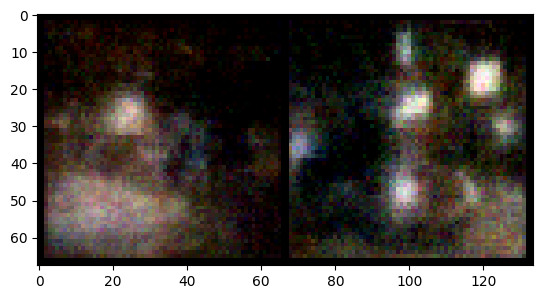

====> Validation Epoch: 106 Average loss: 281.7583
====> Epoch: 107 Average loss: 6.0749
====> Epoch: 107 Average Reconstruction loss: 5.9006
====> Epoch: 107 Average KL loss: 0.1742
Original Samples:


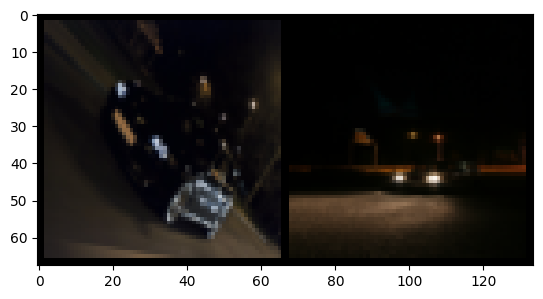

Generated Generated:


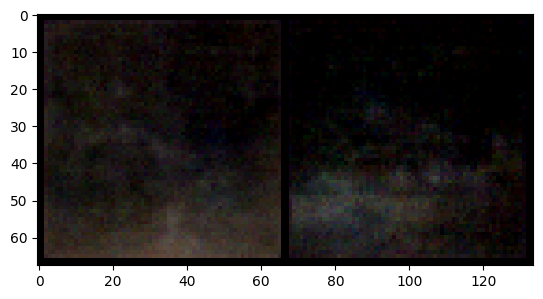

====> Validation Epoch: 107 Average loss: 276.3543
====> Epoch: 108 Average loss: 6.1540
====> Epoch: 108 Average Reconstruction loss: 5.9765
====> Epoch: 108 Average KL loss: 0.1775
Original Samples:


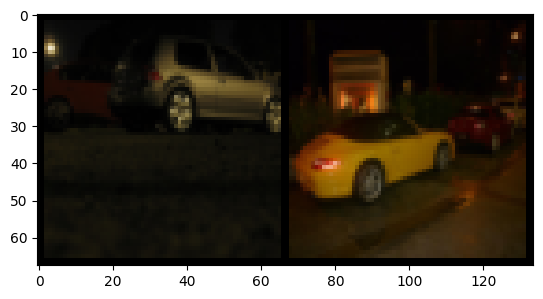

Generated Generated:


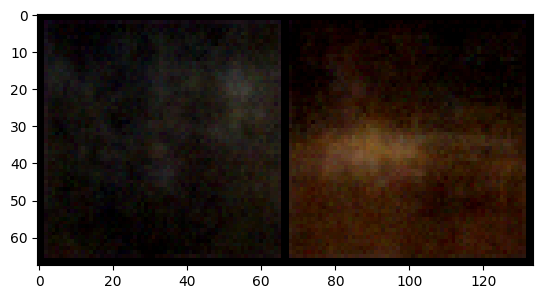

====> Validation Epoch: 108 Average loss: 277.0909
====> Epoch: 109 Average loss: 6.3326
====> Epoch: 109 Average Reconstruction loss: 6.1541
====> Epoch: 109 Average KL loss: 0.1785
Original Samples:


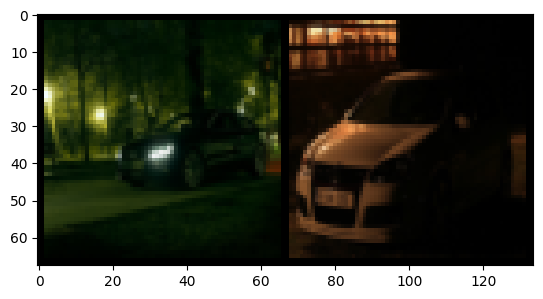

Generated Generated:


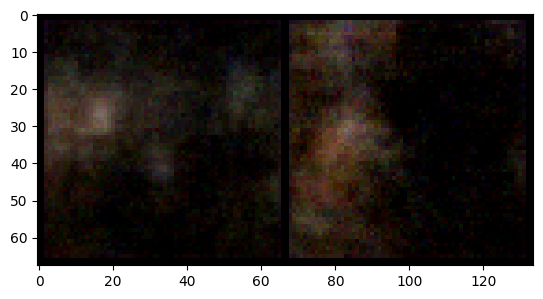

====> Validation Epoch: 109 Average loss: 277.5953
====> Epoch: 110 Average loss: 6.7502
====> Epoch: 110 Average Reconstruction loss: 6.5717
====> Epoch: 110 Average KL loss: 0.1786
Original Samples:


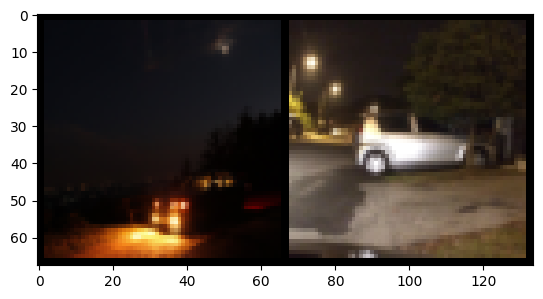

Generated Generated:


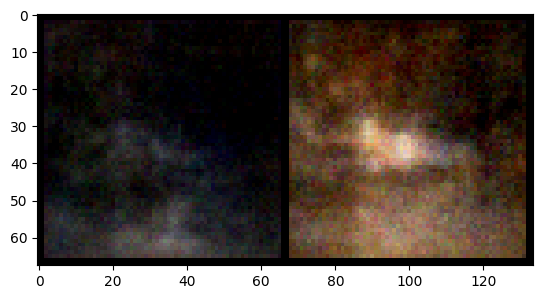

====> Validation Epoch: 110 Average loss: 277.9217
====> Epoch: 111 Average loss: 6.2983
====> Epoch: 111 Average Reconstruction loss: 6.1187
====> Epoch: 111 Average KL loss: 0.1796
Original Samples:


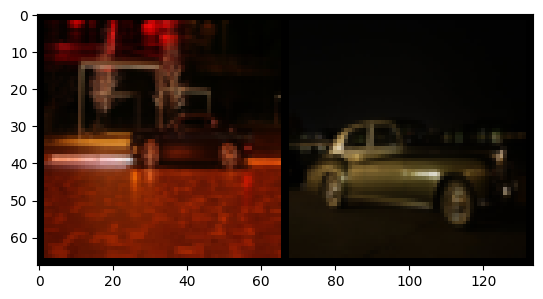

Generated Generated:


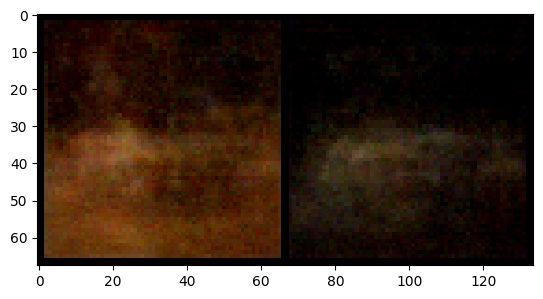

====> Validation Epoch: 111 Average loss: 281.6150
====> Epoch: 112 Average loss: 6.4808
====> Epoch: 112 Average Reconstruction loss: 6.3008
====> Epoch: 112 Average KL loss: 0.1800
Original Samples:


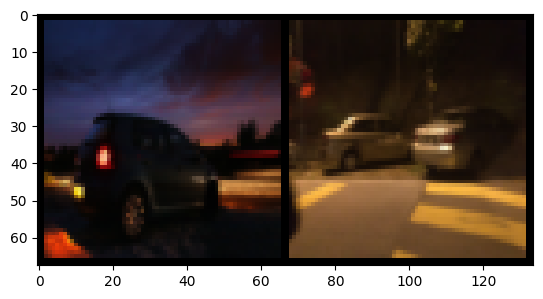

Generated Generated:


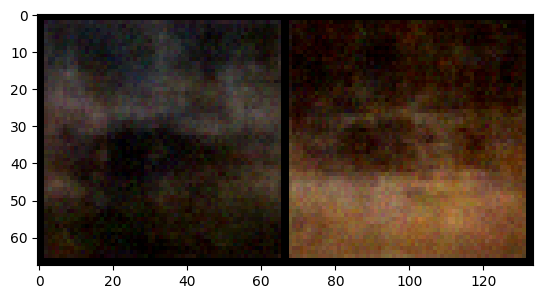

====> Validation Epoch: 112 Average loss: 278.1483
====> Epoch: 113 Average loss: 5.9023
====> Epoch: 113 Average Reconstruction loss: 5.7245
====> Epoch: 113 Average KL loss: 0.1778
Original Samples:


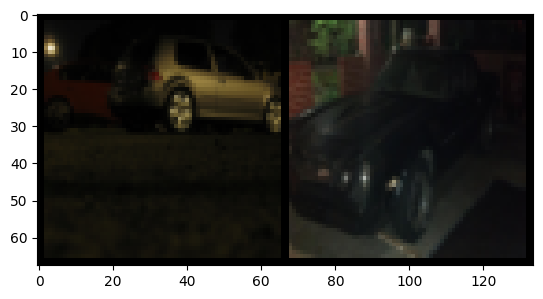

Generated Generated:


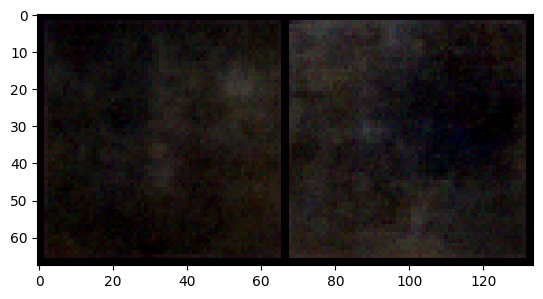

====> Validation Epoch: 113 Average loss: 274.8840
====> Epoch: 114 Average loss: 6.4098
====> Epoch: 114 Average Reconstruction loss: 6.2308
====> Epoch: 114 Average KL loss: 0.1790
Original Samples:


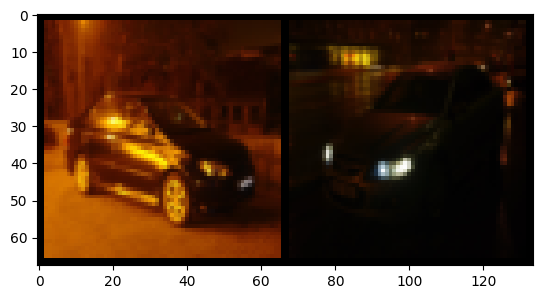

Generated Generated:


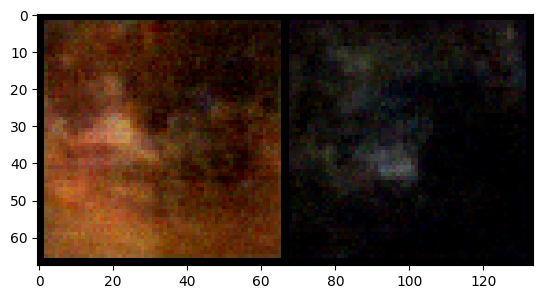

====> Validation Epoch: 114 Average loss: 278.7424
====> Epoch: 115 Average loss: 6.2303
====> Epoch: 115 Average Reconstruction loss: 6.0508
====> Epoch: 115 Average KL loss: 0.1795
Original Samples:


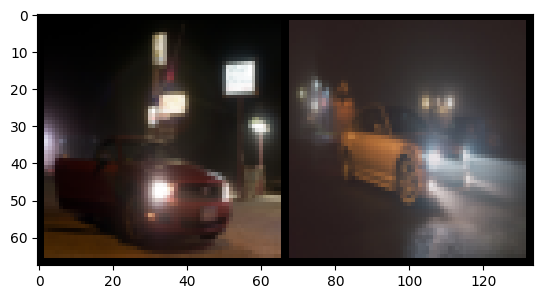

Generated Generated:


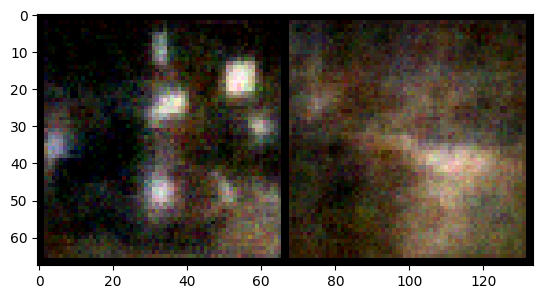

====> Validation Epoch: 115 Average loss: 279.3184
====> Epoch: 116 Average loss: 6.0004
====> Epoch: 116 Average Reconstruction loss: 5.8268
====> Epoch: 116 Average KL loss: 0.1736
Original Samples:


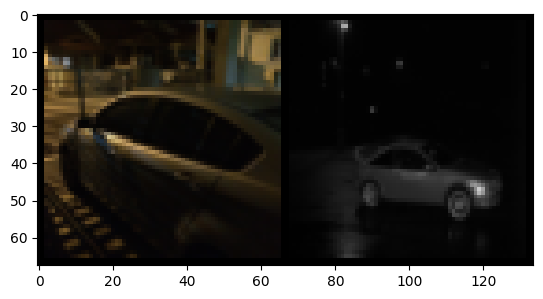

Generated Generated:


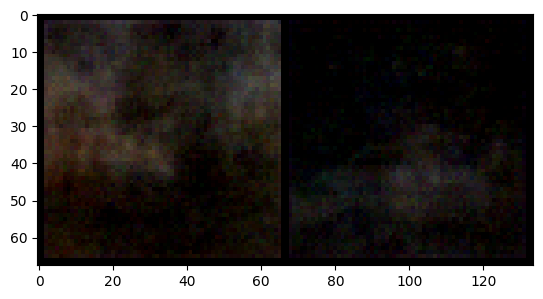

====> Validation Epoch: 116 Average loss: 276.8299
====> Epoch: 117 Average loss: 5.9231
====> Epoch: 117 Average Reconstruction loss: 5.7509
====> Epoch: 117 Average KL loss: 0.1722
Original Samples:


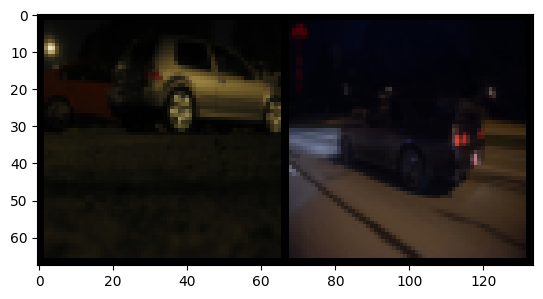

Generated Generated:


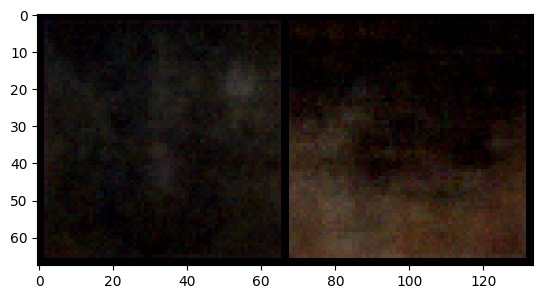

====> Validation Epoch: 117 Average loss: 276.8091
====> Epoch: 118 Average loss: 6.2842
====> Epoch: 118 Average Reconstruction loss: 6.1082
====> Epoch: 118 Average KL loss: 0.1759
Original Samples:


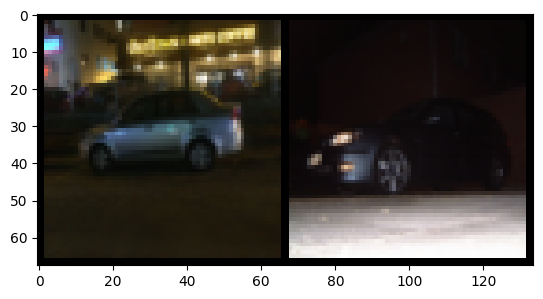

Generated Generated:


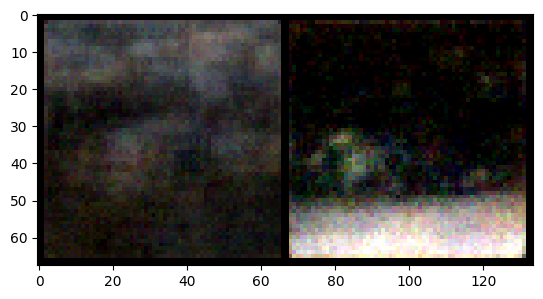

====> Validation Epoch: 118 Average loss: 281.1151
====> Epoch: 119 Average loss: 6.4141
====> Epoch: 119 Average Reconstruction loss: 6.2344
====> Epoch: 119 Average KL loss: 0.1796
Original Samples:


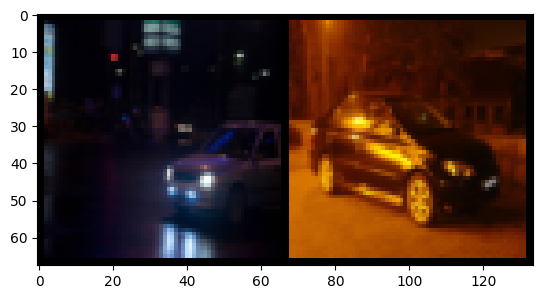

Generated Generated:


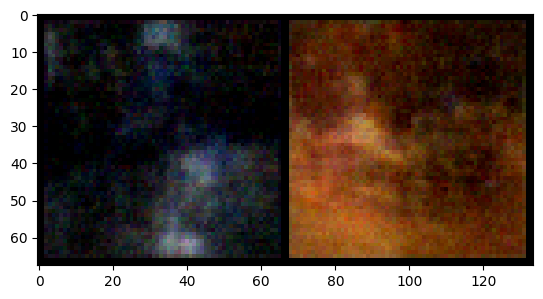

====> Validation Epoch: 119 Average loss: 277.7980
====> Epoch: 120 Average loss: 6.0582
====> Epoch: 120 Average Reconstruction loss: 5.8808
====> Epoch: 120 Average KL loss: 0.1774
Original Samples:


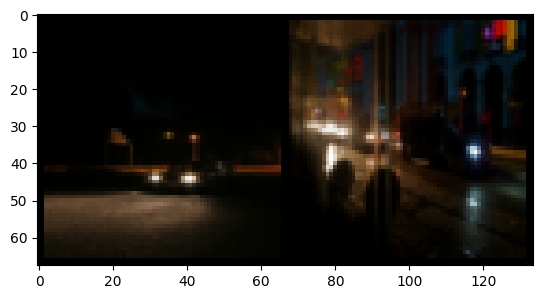

Generated Generated:


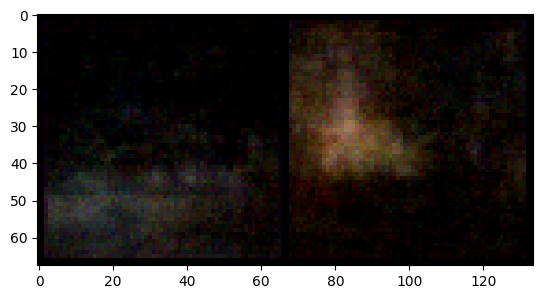

====> Validation Epoch: 120 Average loss: 279.8391
====> Epoch: 121 Average loss: 6.3732
====> Epoch: 121 Average Reconstruction loss: 6.1945
====> Epoch: 121 Average KL loss: 0.1788
Original Samples:


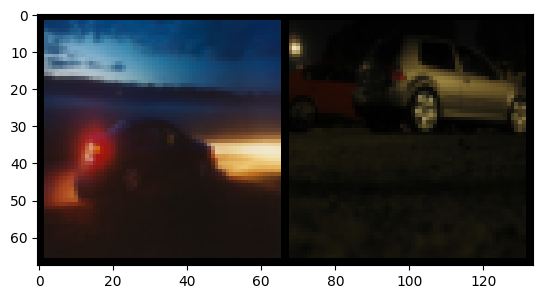

Generated Generated:


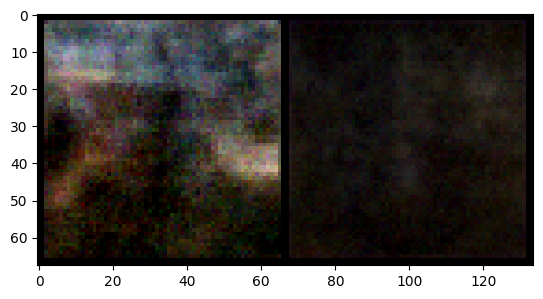

====> Validation Epoch: 121 Average loss: 279.6070
====> Epoch: 122 Average loss: 6.6602
====> Epoch: 122 Average Reconstruction loss: 6.4806
====> Epoch: 122 Average KL loss: 0.1796
Original Samples:


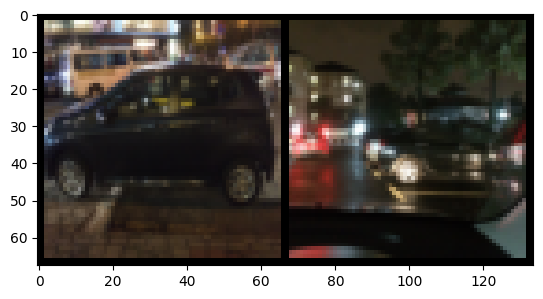

Generated Generated:


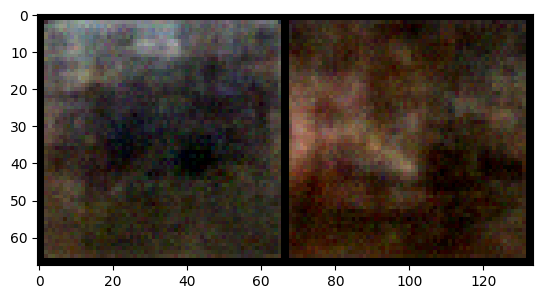

====> Validation Epoch: 122 Average loss: 280.3710
====> Epoch: 123 Average loss: 6.0684
====> Epoch: 123 Average Reconstruction loss: 5.8914
====> Epoch: 123 Average KL loss: 0.1770
Original Samples:


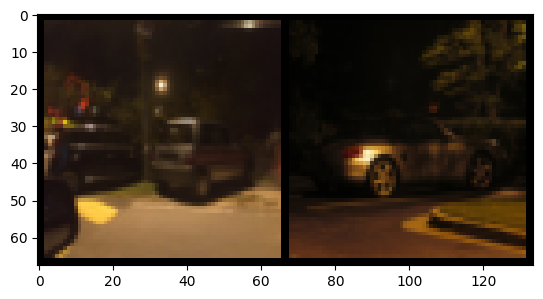

Generated Generated:


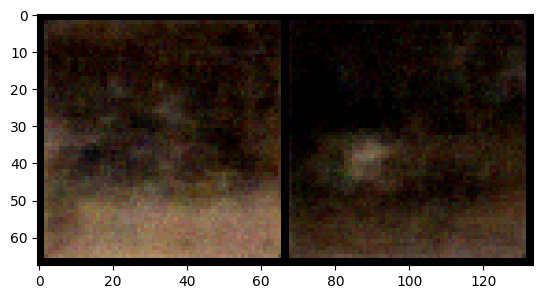

====> Validation Epoch: 123 Average loss: 280.2858
====> Epoch: 124 Average loss: 5.8124
====> Epoch: 124 Average Reconstruction loss: 5.6359
====> Epoch: 124 Average KL loss: 0.1765
Original Samples:


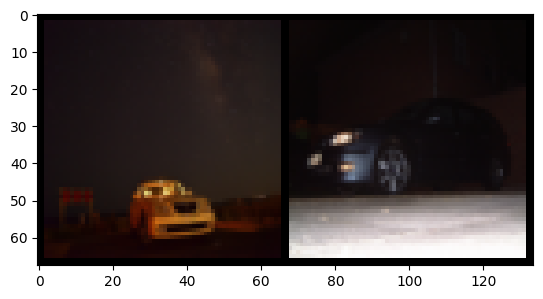

Generated Generated:


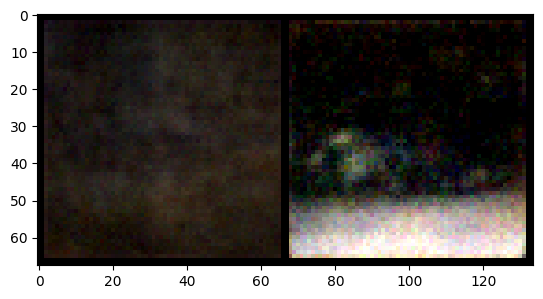

====> Validation Epoch: 124 Average loss: 278.9572
====> Epoch: 125 Average loss: 5.6593
====> Epoch: 125 Average Reconstruction loss: 5.4821
====> Epoch: 125 Average KL loss: 0.1772
Original Samples:


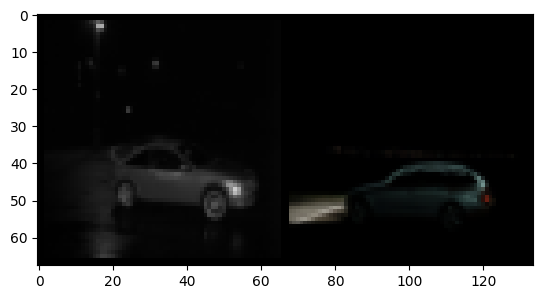

Generated Generated:


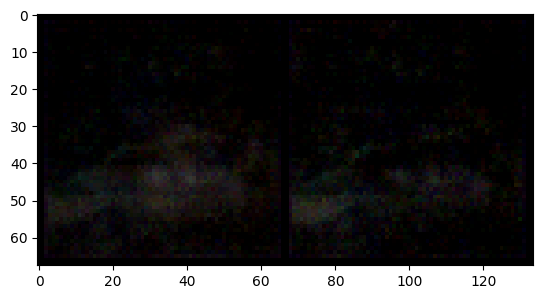

====> Validation Epoch: 125 Average loss: 279.6976
====> Epoch: 126 Average loss: 6.1685
====> Epoch: 126 Average Reconstruction loss: 5.9906
====> Epoch: 126 Average KL loss: 0.1779
Original Samples:


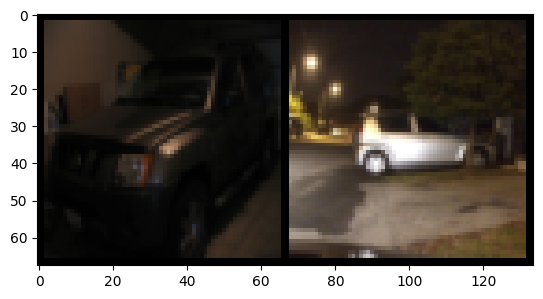

Generated Generated:


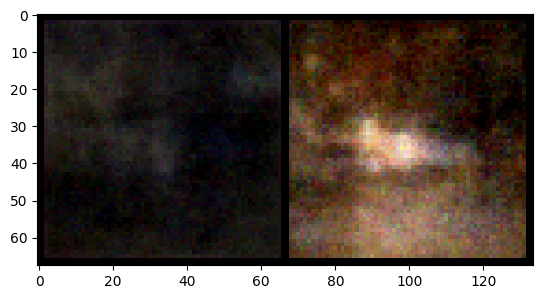

====> Validation Epoch: 126 Average loss: 280.3349
====> Epoch: 127 Average loss: 6.2371
====> Epoch: 127 Average Reconstruction loss: 6.0598
====> Epoch: 127 Average KL loss: 0.1773
Original Samples:


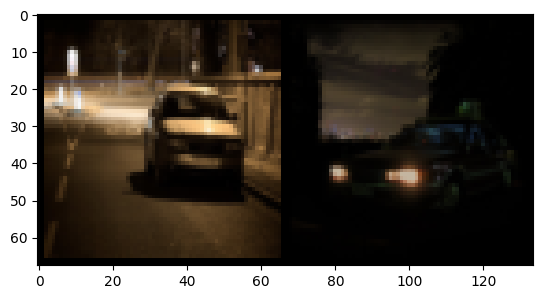

Generated Generated:


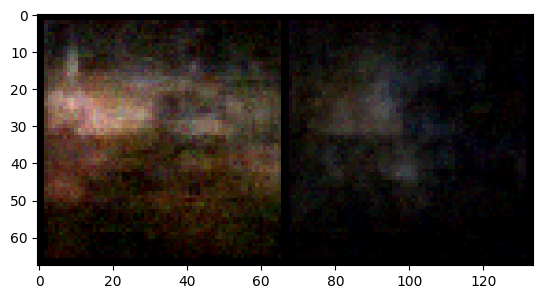

====> Validation Epoch: 127 Average loss: 278.3572
====> Epoch: 128 Average loss: 6.2368
====> Epoch: 128 Average Reconstruction loss: 6.0593
====> Epoch: 128 Average KL loss: 0.1776
Original Samples:


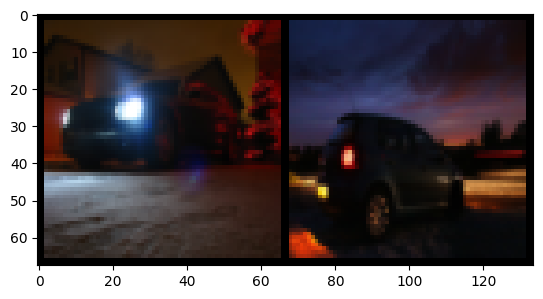

Generated Generated:


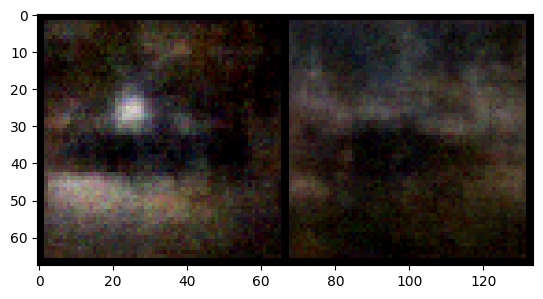

====> Validation Epoch: 128 Average loss: 278.8605
====> Epoch: 129 Average loss: 5.9099
====> Epoch: 129 Average Reconstruction loss: 5.7305
====> Epoch: 129 Average KL loss: 0.1795
Original Samples:


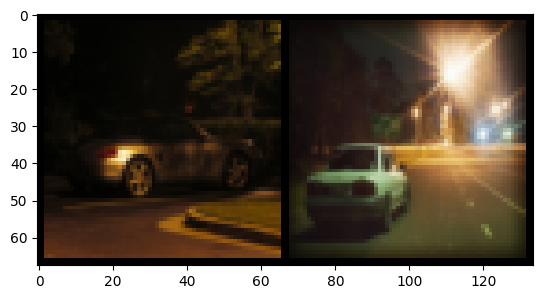

Generated Generated:

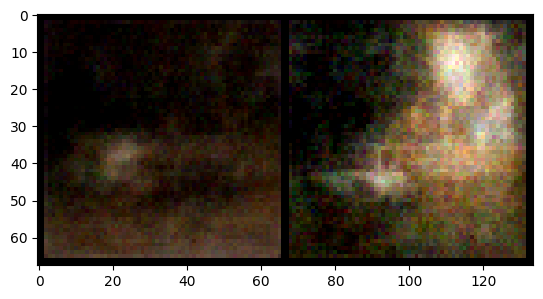

====> Validation Epoch: 129 Average loss: 278.9564
====> Epoch: 130 Average loss: 6.1036
====> Epoch: 130 Average Reconstruction loss: 5.9241
====> Epoch: 130 Average KL loss: 0.1795
Original Samples:


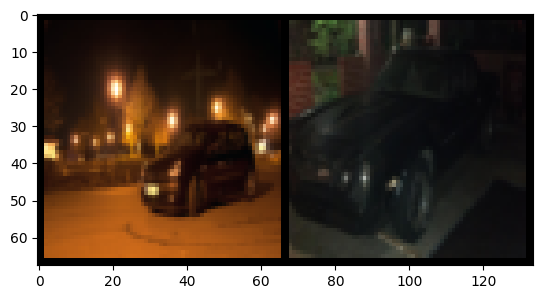

Generated Generated:


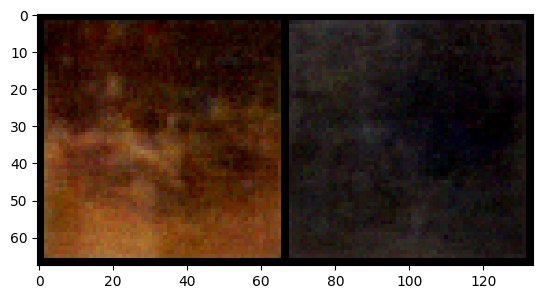

====> Validation Epoch: 130 Average loss: 278.8997
====> Epoch: 131 Average loss: 5.7402
====> Epoch: 131 Average Reconstruction loss: 5.5643
====> Epoch: 131 Average KL loss: 0.1759
Original Samples:


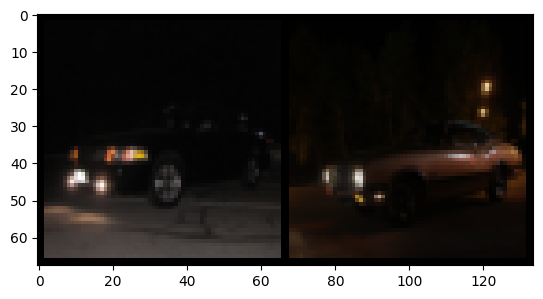

Generated Generated:


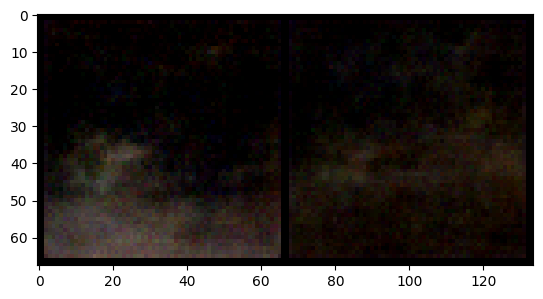

====> Validation Epoch: 131 Average loss: 281.8968
====> Epoch: 132 Average loss: 6.1863
====> Epoch: 132 Average Reconstruction loss: 6.0058
====> Epoch: 132 Average KL loss: 0.1805
Original Samples:


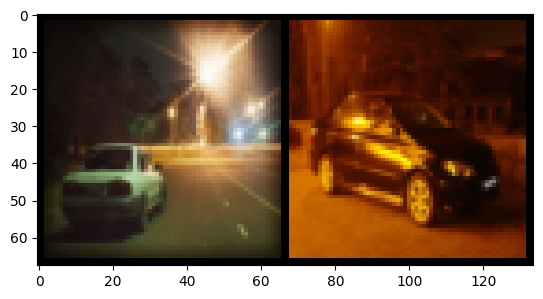

Generated Generated:


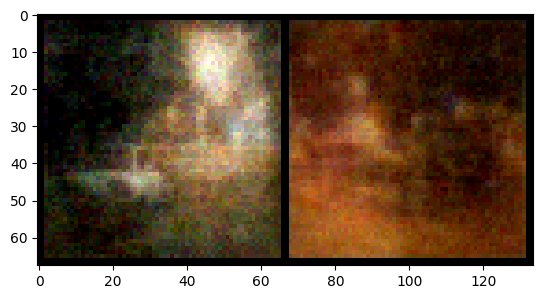

====> Validation Epoch: 132 Average loss: 282.3047
====> Epoch: 133 Average loss: 6.2000
====> Epoch: 133 Average Reconstruction loss: 6.0208
====> Epoch: 133 Average KL loss: 0.1792
Original Samples:


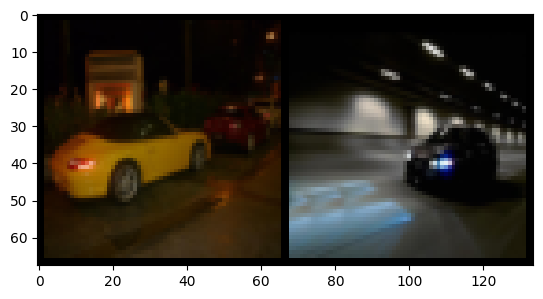

Generated Generated:


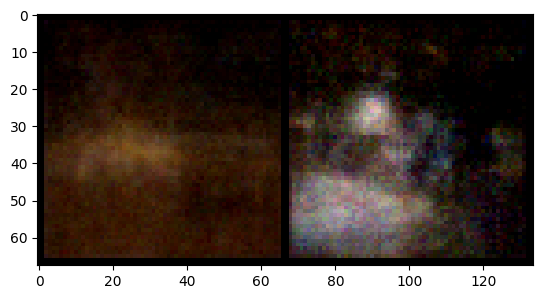

====> Validation Epoch: 133 Average loss: 281.3825
====> Epoch: 134 Average loss: 5.9182
====> Epoch: 134 Average Reconstruction loss: 5.7405
====> Epoch: 134 Average KL loss: 0.1777
Original Samples:


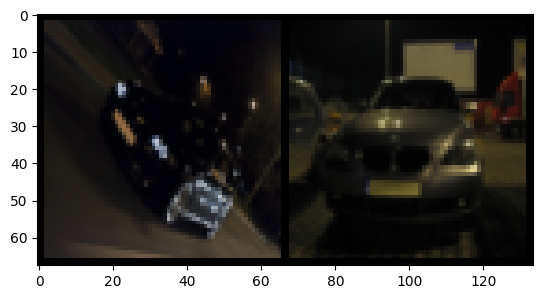

Generated Generated:


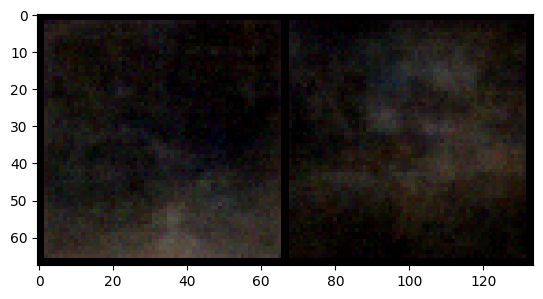

====> Validation Epoch: 134 Average loss: 283.5335
====> Epoch: 135 Average loss: 5.7211
====> Epoch: 135 Average Reconstruction loss: 5.5461
====> Epoch: 135 Average KL loss: 0.1750
Original Samples:


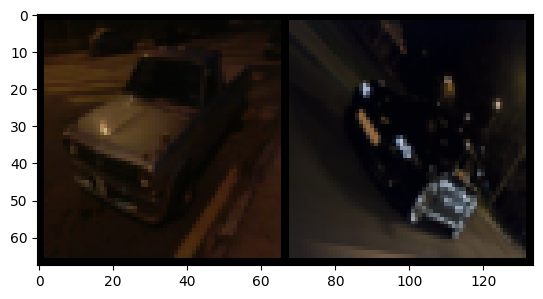

Generated Generated:


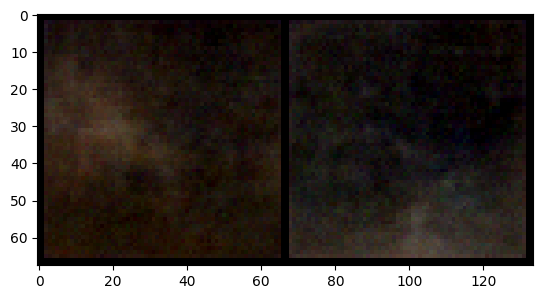

====> Validation Epoch: 135 Average loss: 279.6361
====> Epoch: 136 Average loss: 5.9913
====> Epoch: 136 Average Reconstruction loss: 5.8171
====> Epoch: 136 Average KL loss: 0.1743
Original Samples:


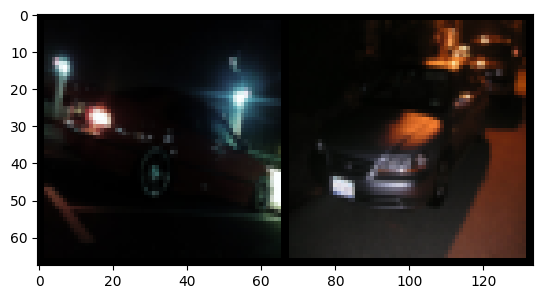

Generated Generated:


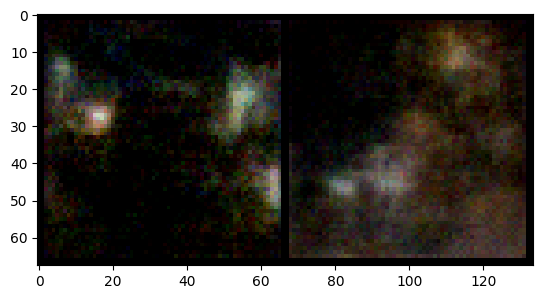

====> Validation Epoch: 136 Average loss: 278.3552
====> Epoch: 137 Average loss: 6.1142
====> Epoch: 137 Average Reconstruction loss: 5.9375
====> Epoch: 137 Average KL loss: 0.1767
Original Samples:


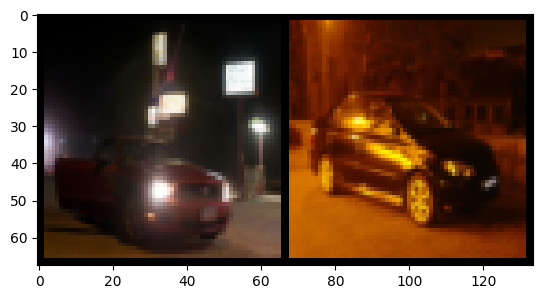

Generated Generated:


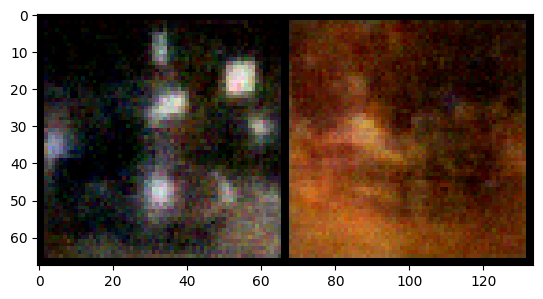

====> Validation Epoch: 137 Average loss: 277.7550
====> Epoch: 138 Average loss: 5.6781
====> Epoch: 138 Average Reconstruction loss: 5.5073
====> Epoch: 138 Average KL loss: 0.1708
Original Samples:


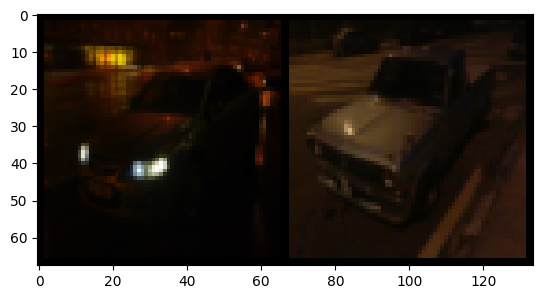

Generated Generated:


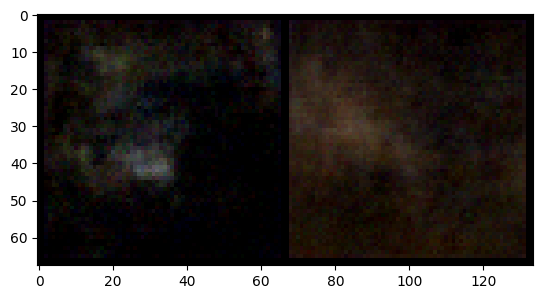

====> Validation Epoch: 138 Average loss: 281.6789
====> Epoch: 139 Average loss: 5.9527
====> Epoch: 139 Average Reconstruction loss: 5.7742
====> Epoch: 139 Average KL loss: 0.1785
Original Samples:


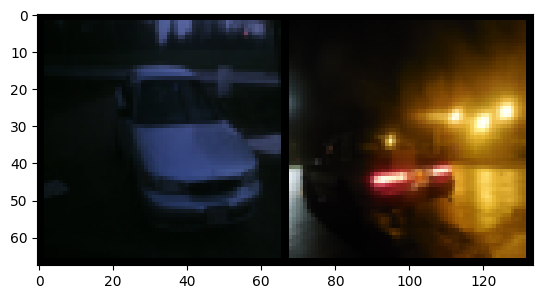

Generated Generated:


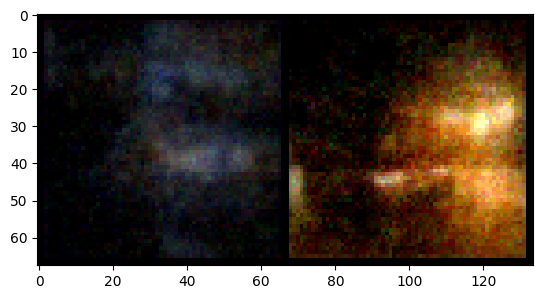

====> Validation Epoch: 139 Average loss: 283.7920
====> Epoch: 140 Average loss: 5.9241
====> Epoch: 140 Average Reconstruction loss: 5.7462
====> Epoch: 140 Average KL loss: 0.1780
Original Samples:


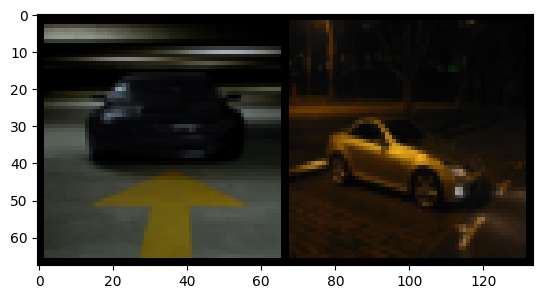

Generated Generated:


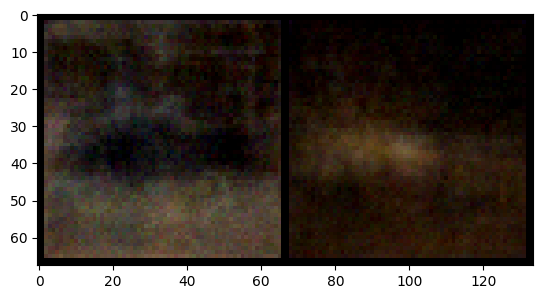

====> Validation Epoch: 140 Average loss: 282.1563
====> Epoch: 141 Average loss: 6.2349
====> Epoch: 141 Average Reconstruction loss: 6.0509
====> Epoch: 141 Average KL loss: 0.1840
Original Samples:


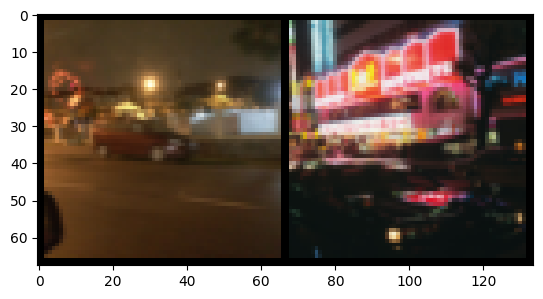

Generated Generated:


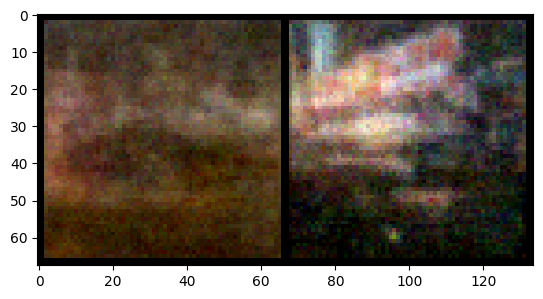

====> Validation Epoch: 141 Average loss: 282.9412
====> Epoch: 142 Average loss: 5.6409
====> Epoch: 142 Average Reconstruction loss: 5.4634
====> Epoch: 142 Average KL loss: 0.1774
Original Samples:


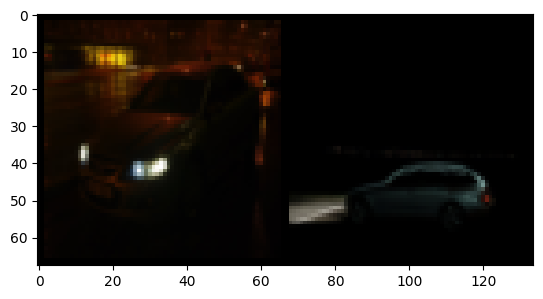

Generated Generated:


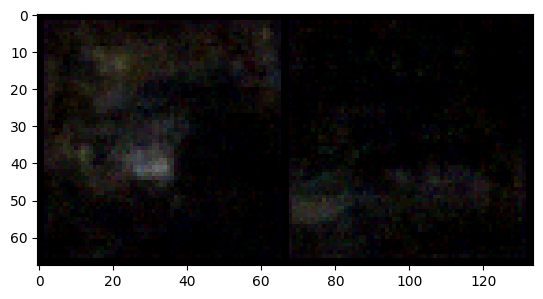

====> Validation Epoch: 142 Average loss: 274.5254
====> Epoch: 143 Average loss: 5.9353
====> Epoch: 143 Average Reconstruction loss: 5.7536
====> Epoch: 143 Average KL loss: 0.1817
Original Samples:


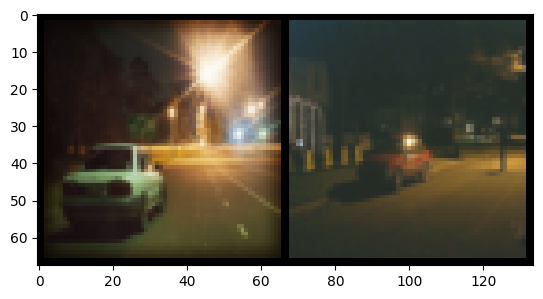

Generated Generated:


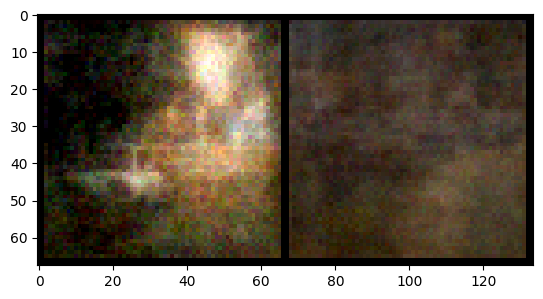

====> Validation Epoch: 143 Average loss: 280.2263
====> Epoch: 144 Average loss: 5.7238
====> Epoch: 144 Average Reconstruction loss: 5.5498
====> Epoch: 144 Average KL loss: 0.1740
Original Samples:


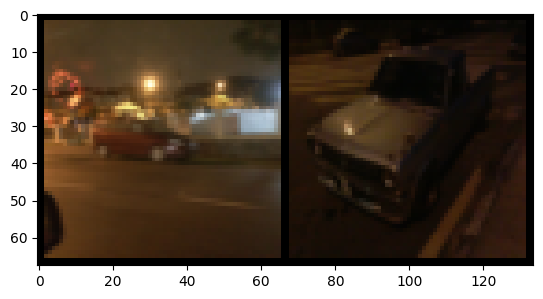

Generated Generated:


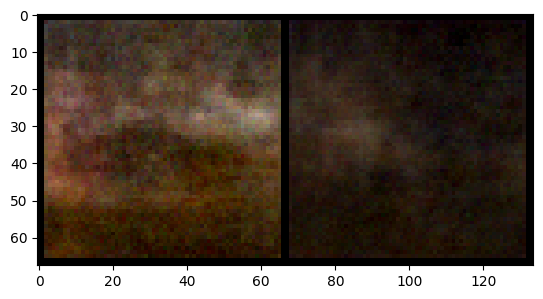

====> Validation Epoch: 144 Average loss: 275.4511
====> Epoch: 145 Average loss: 5.9996
====> Epoch: 145 Average Reconstruction loss: 5.8237
====> Epoch: 145 Average KL loss: 0.1759
Original Samples:


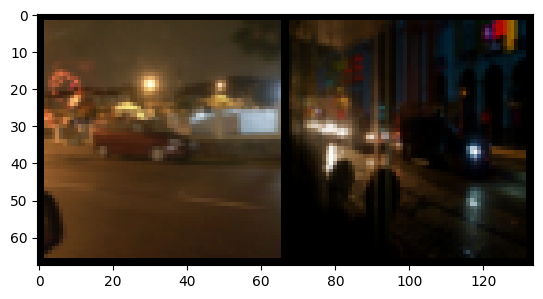

Generated Generated:


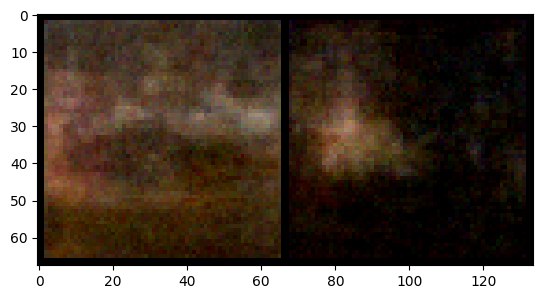

====> Validation Epoch: 145 Average loss: 280.2842
====> Epoch: 146 Average loss: 5.7096
====> Epoch: 146 Average Reconstruction loss: 5.5335
====> Epoch: 146 Average KL loss: 0.1761
Original Samples:


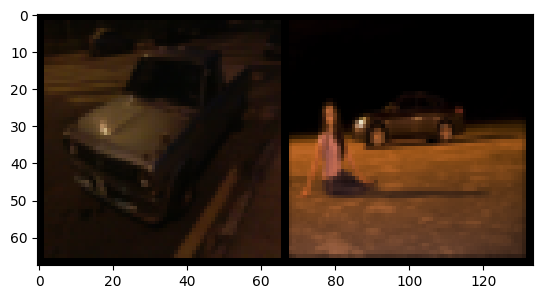

Generated Generated:


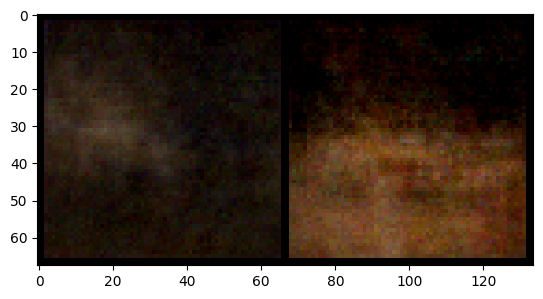

====> Validation Epoch: 146 Average loss: 280.2830
====> Epoch: 147 Average loss: 5.8498
====> Epoch: 147 Average Reconstruction loss: 5.6723
====> Epoch: 147 Average KL loss: 0.1775
Original Samples:


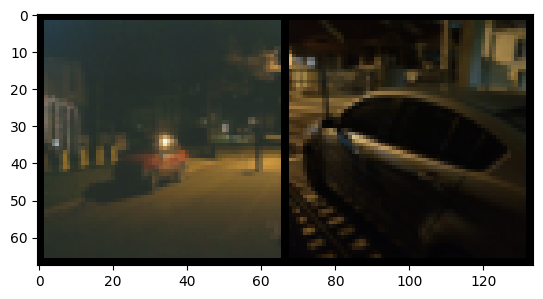

Generated Generated:


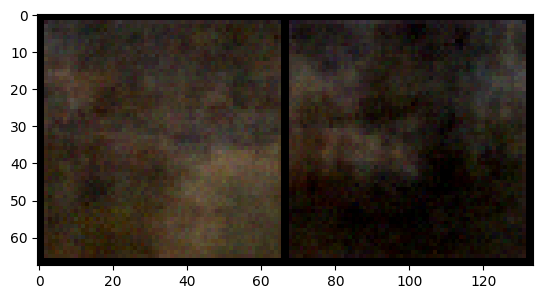

====> Validation Epoch: 147 Average loss: 283.0947
====> Epoch: 148 Average loss: 6.1105
====> Epoch: 148 Average Reconstruction loss: 5.9331
====> Epoch: 148 Average KL loss: 0.1774
Original Samples:


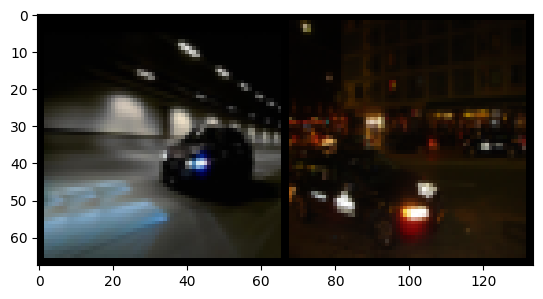

Generated Generated:


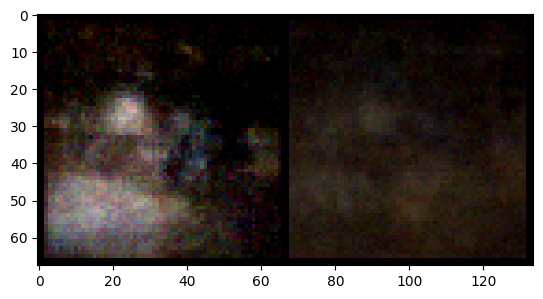

====> Validation Epoch: 148 Average loss: 278.6659
====> Epoch: 149 Average loss: 5.7711
====> Epoch: 149 Average Reconstruction loss: 5.5937
====> Epoch: 149 Average KL loss: 0.1774
Original Samples:


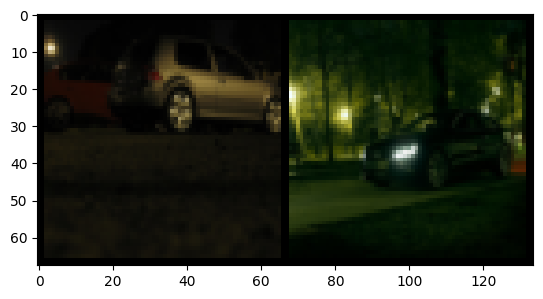

Generated Generated:


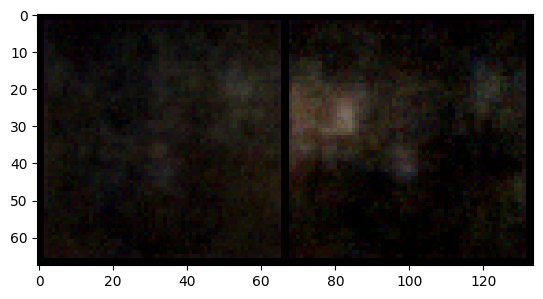

====> Validation Epoch: 149 Average loss: 280.1830
====> Epoch: 150 Average loss: 5.9565
====> Epoch: 150 Average Reconstruction loss: 5.7778
====> Epoch: 150 Average KL loss: 0.1787
Original Samples:


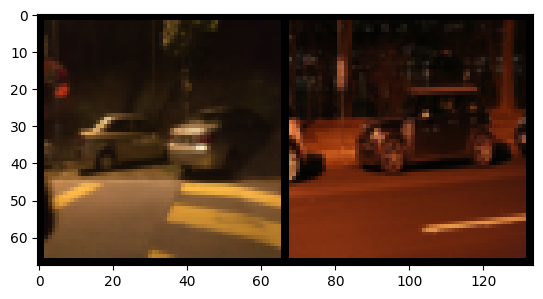

Generated Generated:


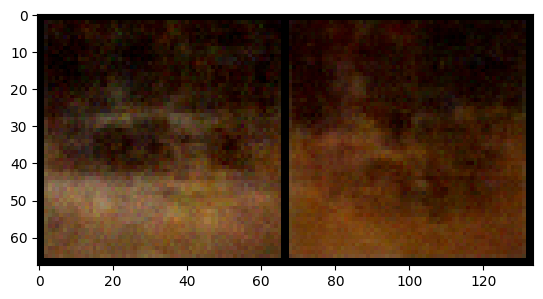

====> Validation Epoch: 150 Average loss: 278.0889
====> Epoch: 151 Average loss: 5.9313
====> Epoch: 151 Average Reconstruction loss: 5.7562
====> Epoch: 151 Average KL loss: 0.1750
Original Samples:


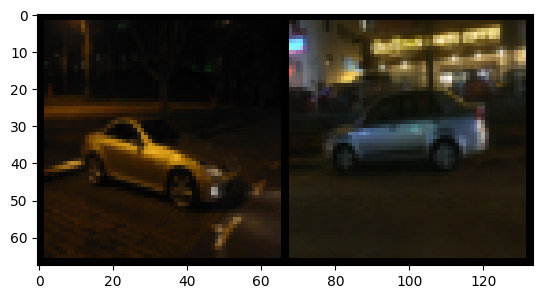

Generated Generated:


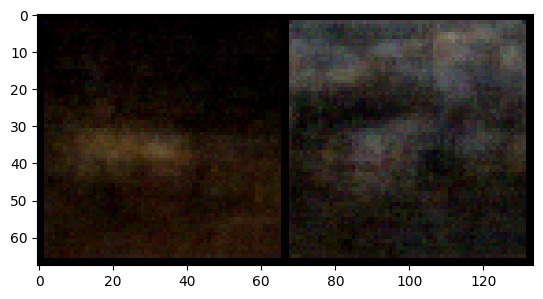

====> Validation Epoch: 151 Average loss: 284.0078
====> Epoch: 152 Average loss: 6.2563
====> Epoch: 152 Average Reconstruction loss: 6.0772
====> Epoch: 152 Average KL loss: 0.1791
Original Samples:


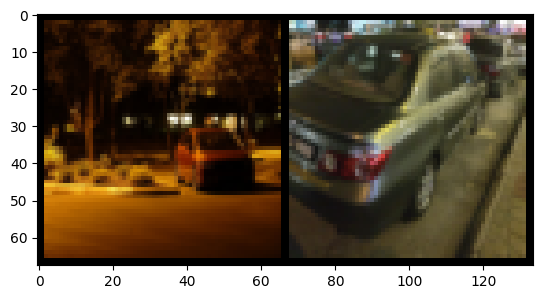

Generated Generated:


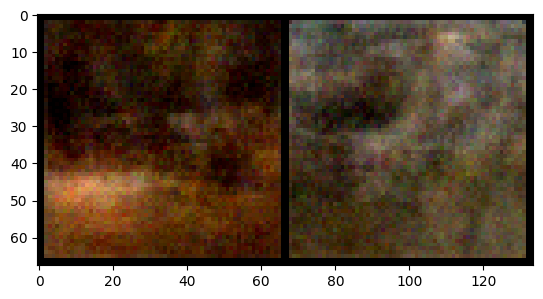

====> Validation Epoch: 152 Average loss: 282.0213
====> Epoch: 153 Average loss: 6.1251
====> Epoch: 153 Average Reconstruction loss: 5.9459
====> Epoch: 153 Average KL loss: 0.1791
Original Samples:


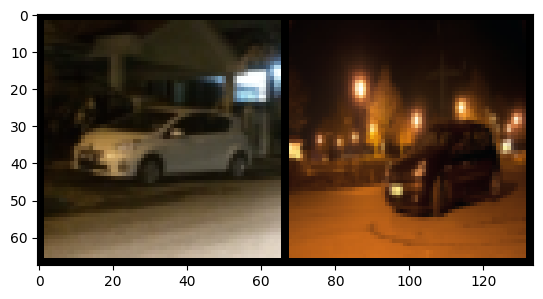

Generated Generated:


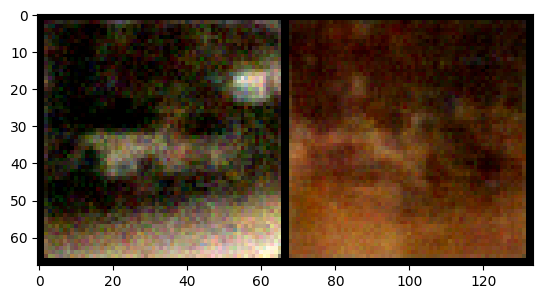

====> Validation Epoch: 153 Average loss: 282.3093
====> Epoch: 154 Average loss: 5.7354
====> Epoch: 154 Average Reconstruction loss: 5.5577
====> Epoch: 154 Average KL loss: 0.1777
Original Samples:


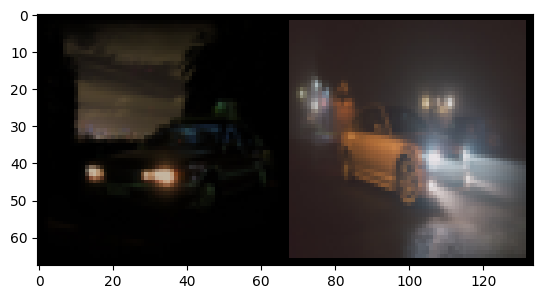

Generated Generated:


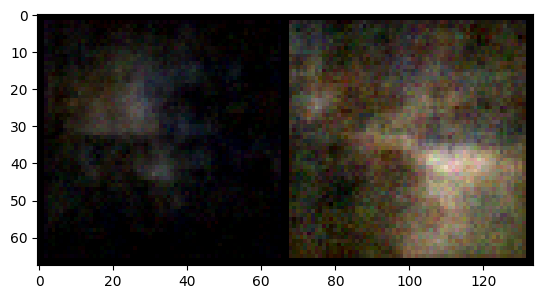

====> Validation Epoch: 154 Average loss: 282.5829
====> Epoch: 155 Average loss: 6.0827
====> Epoch: 155 Average Reconstruction loss: 5.8973
====> Epoch: 155 Average KL loss: 0.1854
Original Samples:


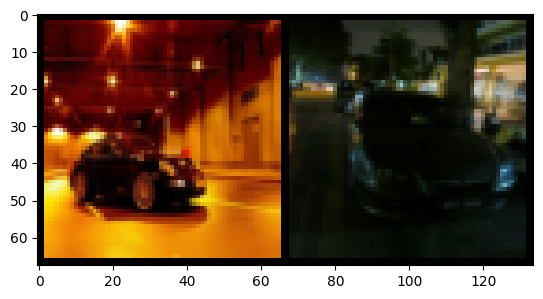

Generated Generated:


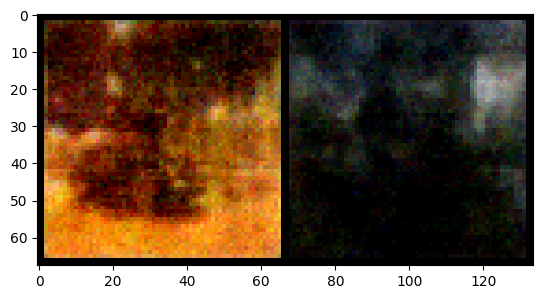

====> Validation Epoch: 155 Average loss: 280.0245
====> Epoch: 156 Average loss: 5.6606
====> Epoch: 156 Average Reconstruction loss: 5.4845
====> Epoch: 156 Average KL loss: 0.1761
Original Samples:


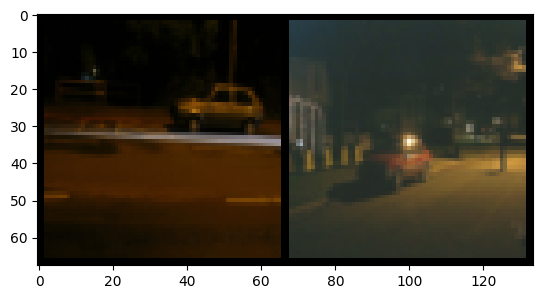

Generated Generated:


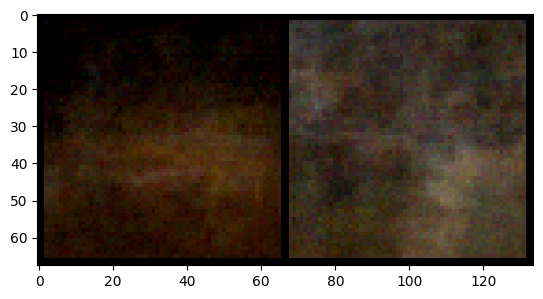

====> Validation Epoch: 156 Average loss: 281.1380
====> Epoch: 157 Average loss: 6.1835
====> Epoch: 157 Average Reconstruction loss: 6.0061
====> Epoch: 157 Average KL loss: 0.1773
Original Samples:


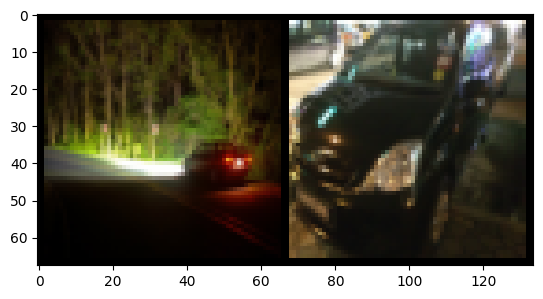

Generated Generated:


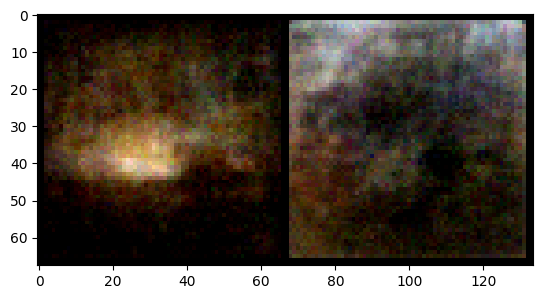

====> Validation Epoch: 157 Average loss: 282.3197
====> Epoch: 158 Average loss: 5.8918
====> Epoch: 158 Average Reconstruction loss: 5.7144
====> Epoch: 158 Average KL loss: 0.1775
Original Samples:


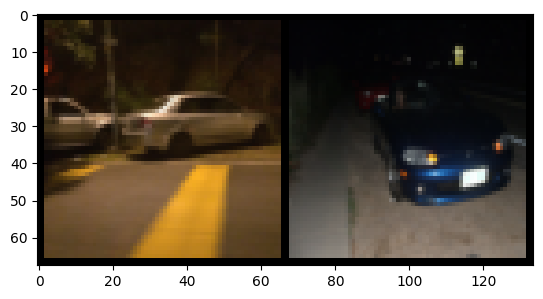

Generated Generated:


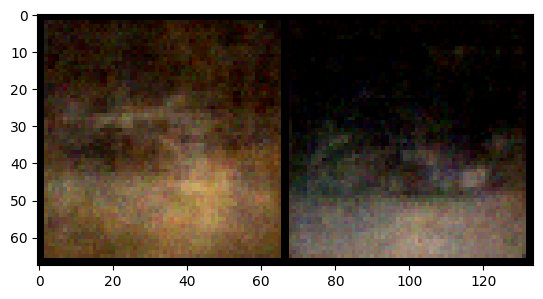

====> Validation Epoch: 158 Average loss: 283.4357
====> Epoch: 159 Average loss: 5.8777
====> Epoch: 159 Average Reconstruction loss: 5.7009
====> Epoch: 159 Average KL loss: 0.1768
Original Samples:


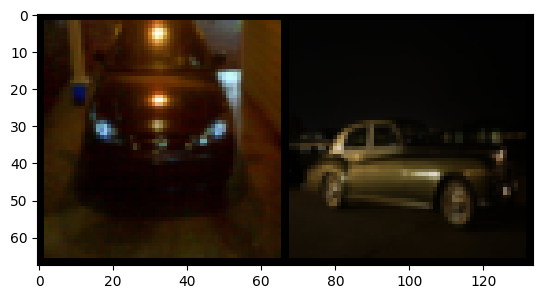

Generated Generated:


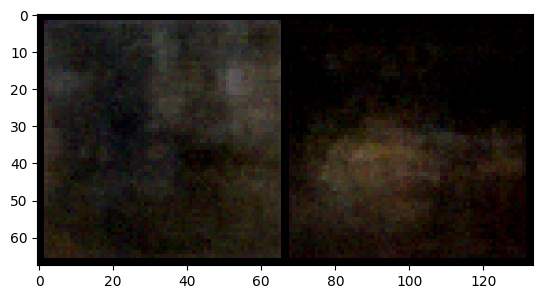

====> Validation Epoch: 159 Average loss: 280.1627
====> Epoch: 160 Average loss: 5.5910
====> Epoch: 160 Average Reconstruction loss: 5.4150
====> Epoch: 160 Average KL loss: 0.1761
Original Samples:


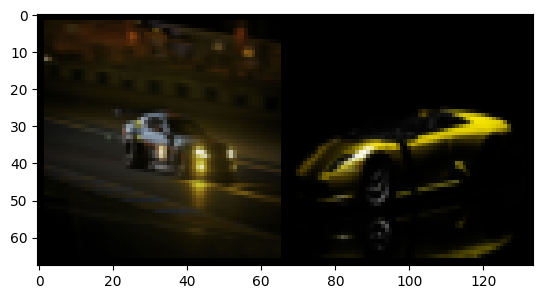

Generated Generated:


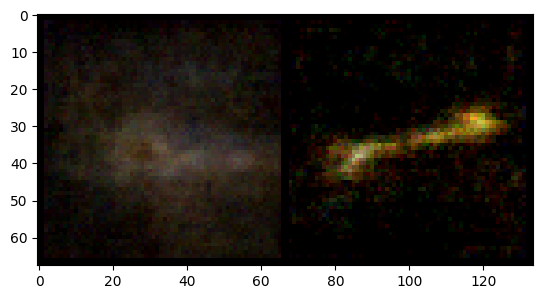

====> Validation Epoch: 160 Average loss: 278.9048
====> Epoch: 161 Average loss: 5.6761
====> Epoch: 161 Average Reconstruction loss: 5.4988
====> Epoch: 161 Average KL loss: 0.1772
Original Samples:


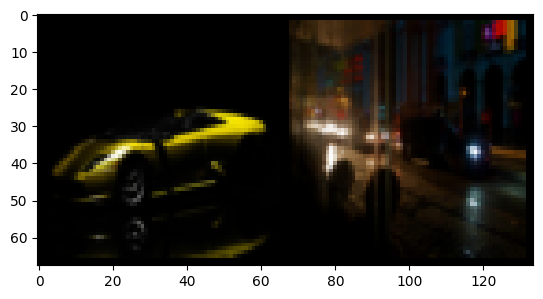

Generated Generated:


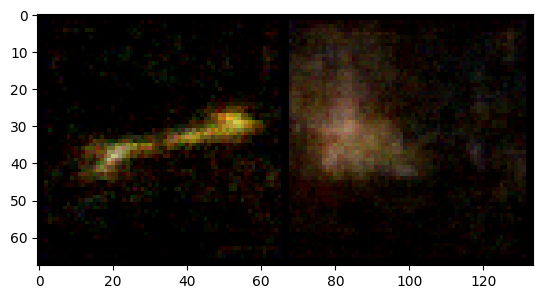

====> Validation Epoch: 161 Average loss: 279.2785
====> Epoch: 162 Average loss: 5.7046
====> Epoch: 162 Average Reconstruction loss: 5.5254
====> Epoch: 162 Average KL loss: 0.1791
Original Samples:


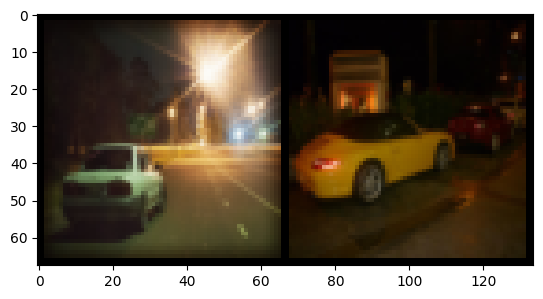

Generated Generated:


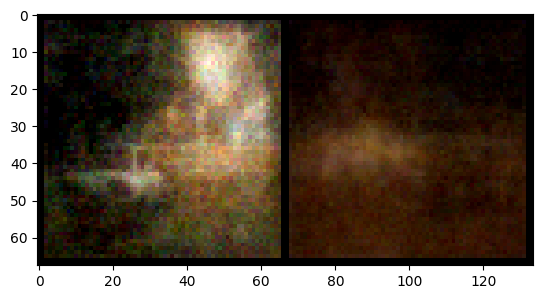

====> Validation Epoch: 162 Average loss: 282.5597
====> Epoch: 163 Average loss: 5.9502
====> Epoch: 163 Average Reconstruction loss: 5.7729
====> Epoch: 163 Average KL loss: 0.1772
Original Samples:


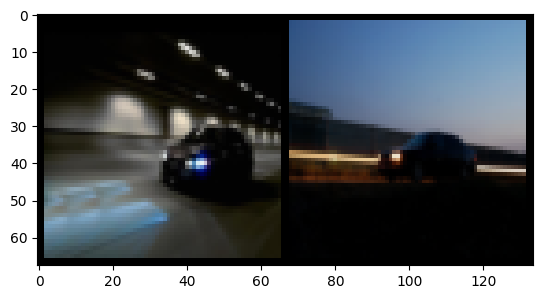

Generated Generated:


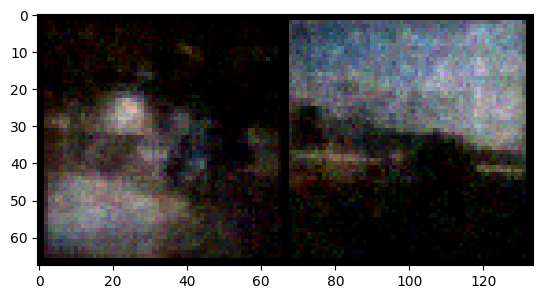

====> Validation Epoch: 163 Average loss: 279.4938
====> Epoch: 164 Average loss: 5.8826
====> Epoch: 164 Average Reconstruction loss: 5.7027
====> Epoch: 164 Average KL loss: 0.1799
Original Samples:


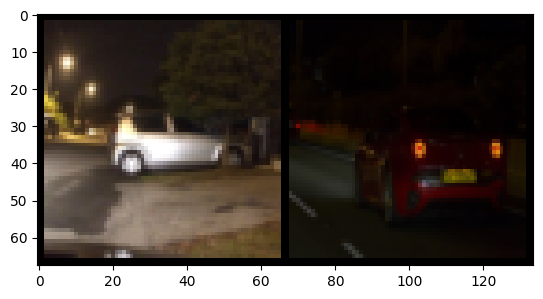

Generated Generated:


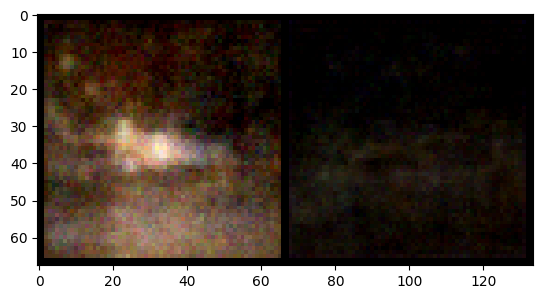

====> Validation Epoch: 164 Average loss: 282.2945
====> Epoch: 165 Average loss: 6.0764
====> Epoch: 165 Average Reconstruction loss: 5.8937
====> Epoch: 165 Average KL loss: 0.1828
Original Samples:


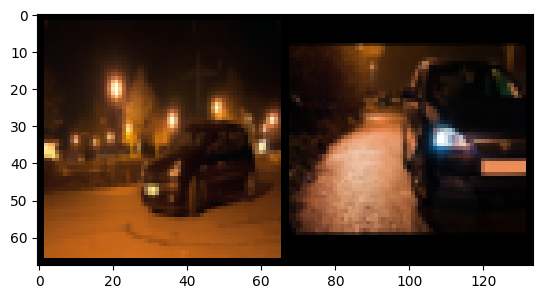

Generated Generated:


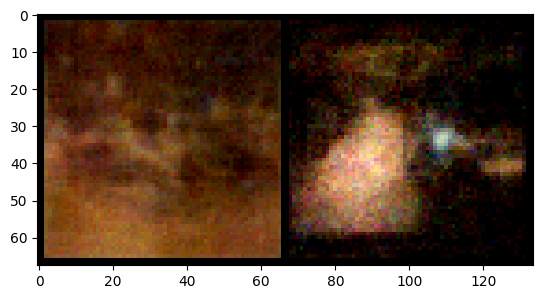

====> Validation Epoch: 165 Average loss: 286.7793
====> Epoch: 166 Average loss: 5.8144
====> Epoch: 166 Average Reconstruction loss: 5.6284
====> Epoch: 166 Average KL loss: 0.1860
Original Samples:


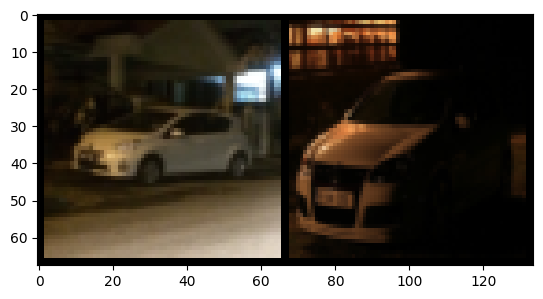

Generated Generated:


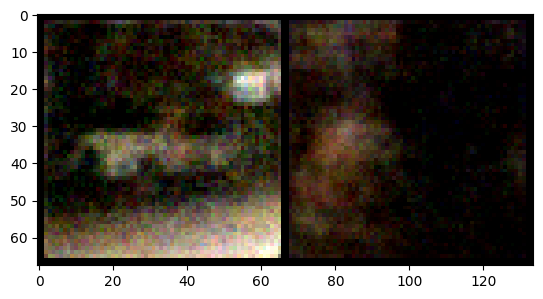

====> Validation Epoch: 166 Average loss: 283.8596
====> Epoch: 167 Average loss: 6.1352
====> Epoch: 167 Average Reconstruction loss: 5.9554
====> Epoch: 167 Average KL loss: 0.1798
Original Samples:


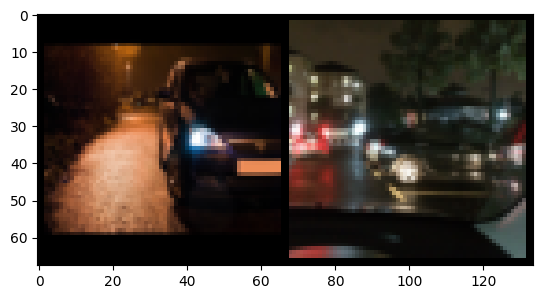

Generated Generated:


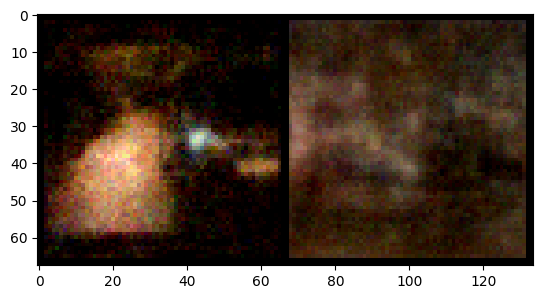

====> Validation Epoch: 167 Average loss: 282.7542
====> Epoch: 168 Average loss: 5.7162
====> Epoch: 168 Average Reconstruction loss: 5.5389
====> Epoch: 168 Average KL loss: 0.1773
Original Samples:


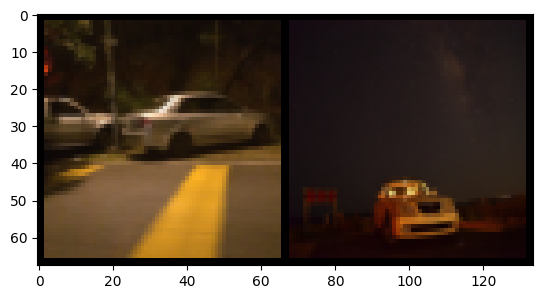

Generated Generated:


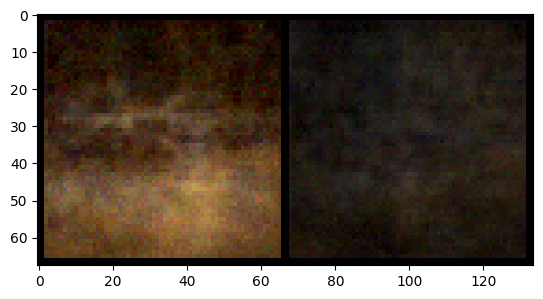

====> Validation Epoch: 168 Average loss: 284.8745
====> Epoch: 169 Average loss: 5.6026
====> Epoch: 169 Average Reconstruction loss: 5.4249
====> Epoch: 169 Average KL loss: 0.1776
Original Samples:


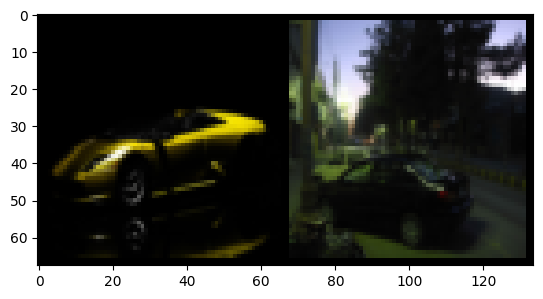

Generated Generated:


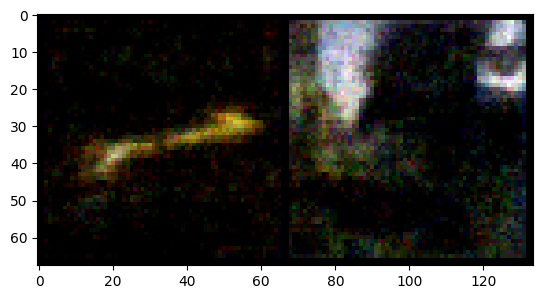

====> Validation Epoch: 169 Average loss: 293.8328
====> Epoch: 170 Average loss: 6.5645
====> Epoch: 170 Average Reconstruction loss: 6.3891
====> Epoch: 170 Average KL loss: 0.1755
Original Samples:


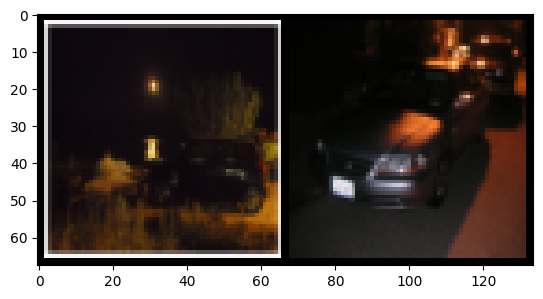

Generated Generated:


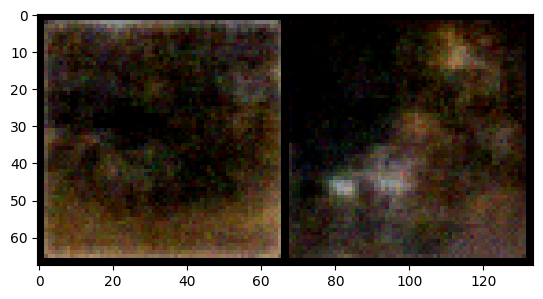

====> Validation Epoch: 170 Average loss: 283.6729
====> Epoch: 171 Average loss: 5.6609
====> Epoch: 171 Average Reconstruction loss: 5.4833
====> Epoch: 171 Average KL loss: 0.1776
Original Samples:


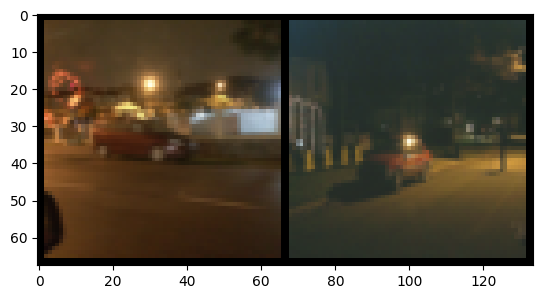

Generated Generated:


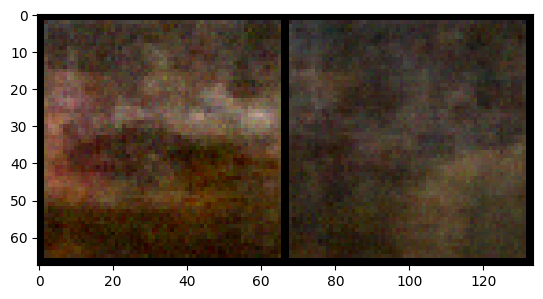

====> Validation Epoch: 171 Average loss: 281.7923
====> Epoch: 172 Average loss: 5.7160
====> Epoch: 172 Average Reconstruction loss: 5.5358
====> Epoch: 172 Average KL loss: 0.1802
Original Samples:


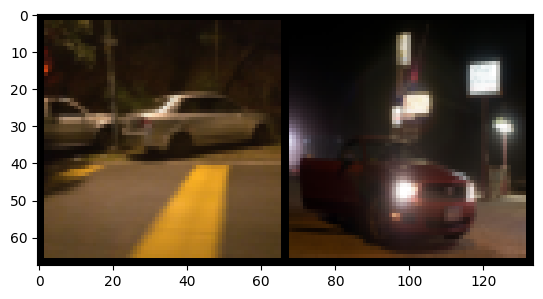

Generated Generated:


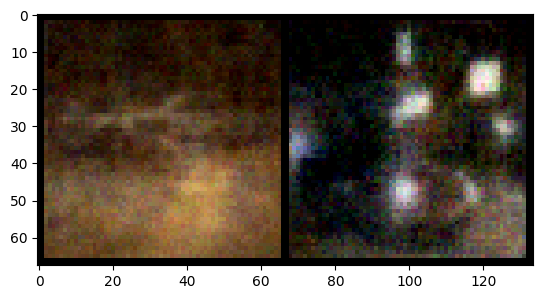

====> Validation Epoch: 172 Average loss: 288.7661
====> Epoch: 173 Average loss: 5.5410
====> Epoch: 173 Average Reconstruction loss: 5.3669
====> Epoch: 173 Average KL loss: 0.1741
Original Samples:


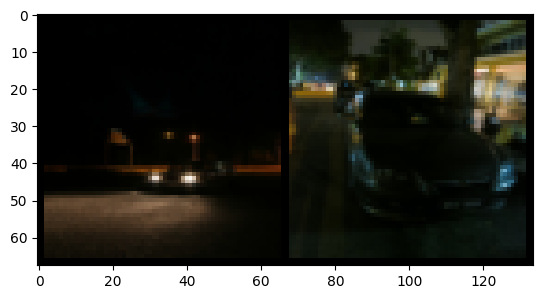

Generated Generated:


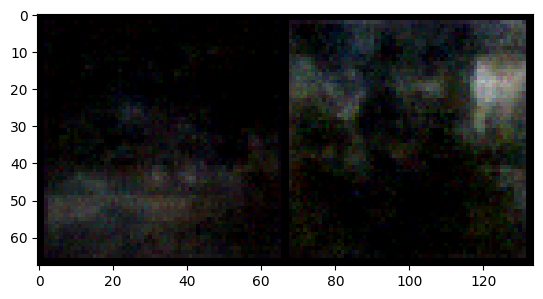

====> Validation Epoch: 173 Average loss: 284.9371
====> Epoch: 174 Average loss: 5.3419
====> Epoch: 174 Average Reconstruction loss: 5.1671
====> Epoch: 174 Average KL loss: 0.1748
Original Samples:


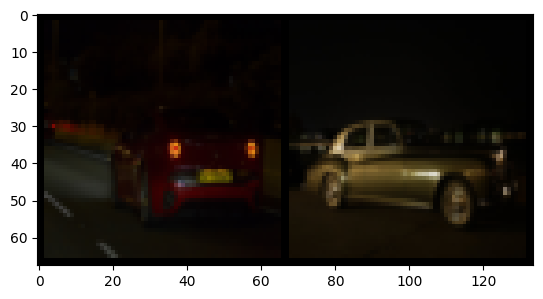

Generated Generated:


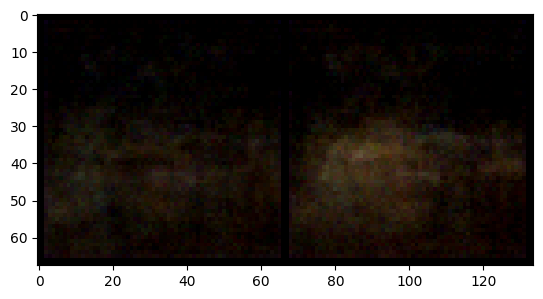

====> Validation Epoch: 174 Average loss: 277.9633
====> Epoch: 175 Average loss: 5.3880
====> Epoch: 175 Average Reconstruction loss: 5.2128
====> Epoch: 175 Average KL loss: 0.1752
Original Samples:


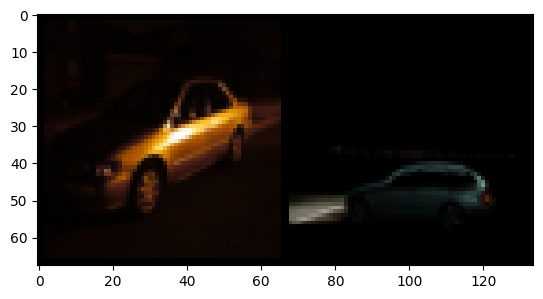

Generated Generated:


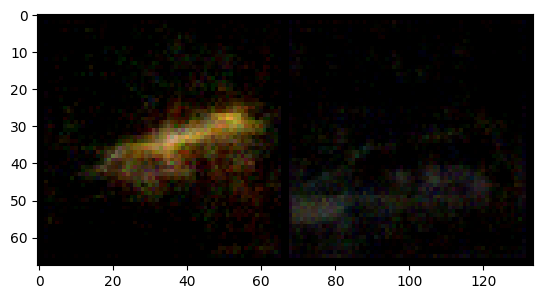

====> Validation Epoch: 175 Average loss: 287.4280
====> Epoch: 176 Average loss: 5.7039
====> Epoch: 176 Average Reconstruction loss: 5.5196
====> Epoch: 176 Average KL loss: 0.1844
Original Samples:


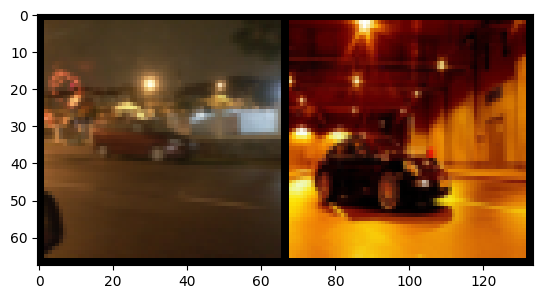

Generated Generated:


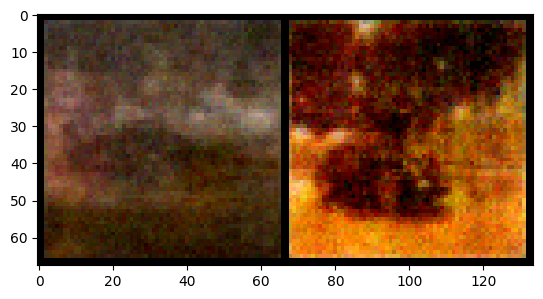

====> Validation Epoch: 176 Average loss: 281.1196
====> Epoch: 177 Average loss: 5.7577
====> Epoch: 177 Average Reconstruction loss: 5.5848
====> Epoch: 177 Average KL loss: 0.1730
Original Samples:


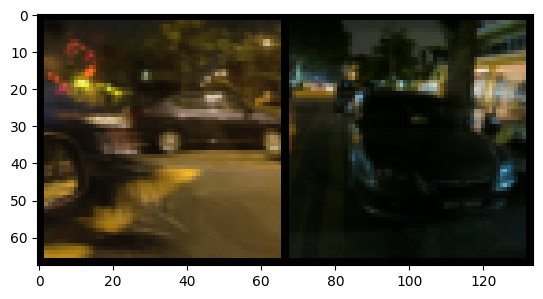

Generated Generated:


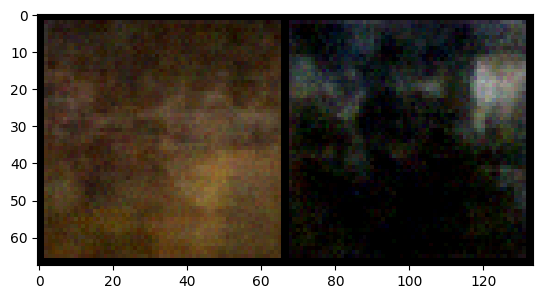

====> Validation Epoch: 177 Average loss: 284.9120
====> Epoch: 178 Average loss: 5.9442
====> Epoch: 178 Average Reconstruction loss: 5.7723
====> Epoch: 178 Average KL loss: 0.1719
Original Samples:


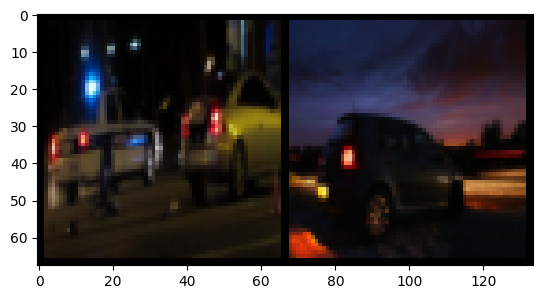

Generated Generated:


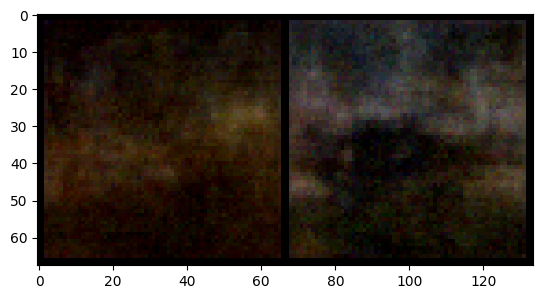

====> Validation Epoch: 178 Average loss: 287.4325
====> Epoch: 179 Average loss: 5.5628
====> Epoch: 179 Average Reconstruction loss: 5.3872
====> Epoch: 179 Average KL loss: 0.1756
Original Samples:


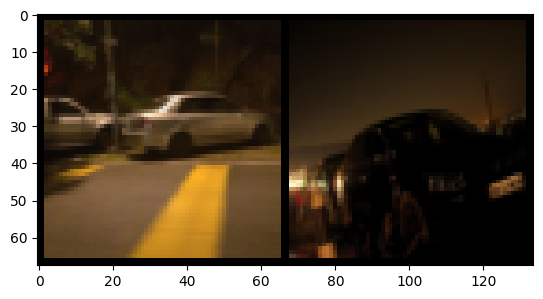

Generated Generated:


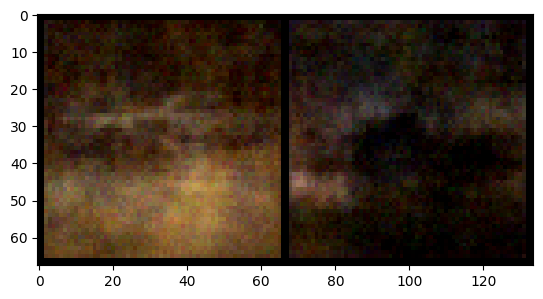

====> Validation Epoch: 179 Average loss: 283.8655
====> Epoch: 180 Average loss: 5.2205
====> Epoch: 180 Average Reconstruction loss: 5.0416
====> Epoch: 180 Average KL loss: 0.1789
Original Samples:


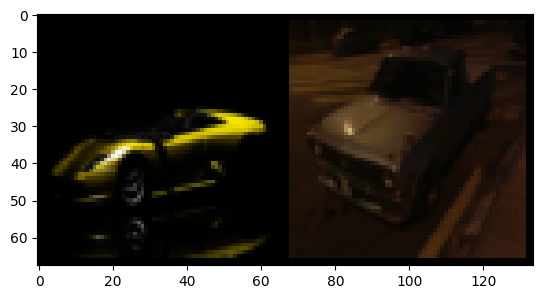

Generated Generated:


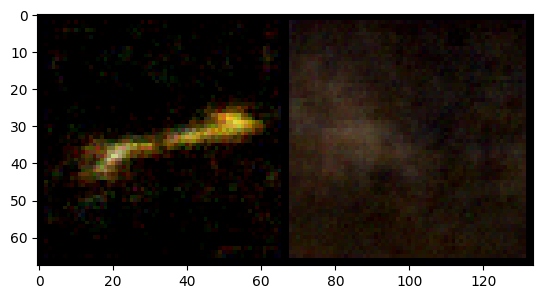

====> Validation Epoch: 180 Average loss: 282.9639
====> Epoch: 181 Average loss: 5.3767
====> Epoch: 181 Average Reconstruction loss: 5.1946
====> Epoch: 181 Average KL loss: 0.1821
Original Samples:


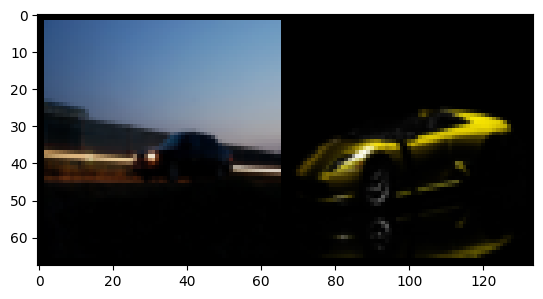

Generated Generated:


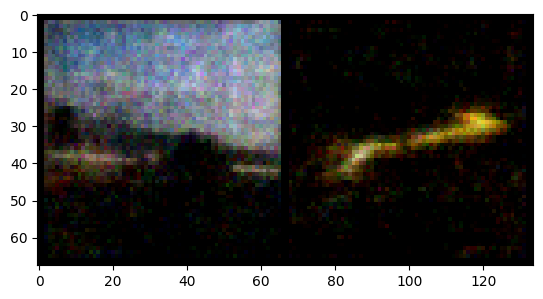

====> Validation Epoch: 181 Average loss: 281.7094
====> Epoch: 182 Average loss: 5.4229
====> Epoch: 182 Average Reconstruction loss: 5.2450
====> Epoch: 182 Average KL loss: 0.1780
Original Samples:


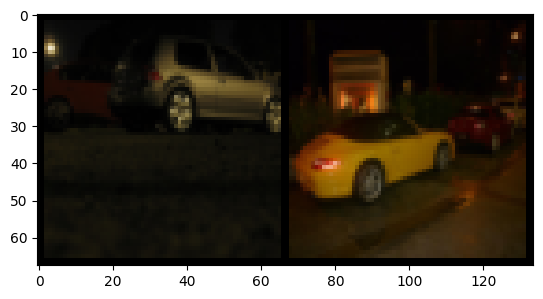

Generated Generated:


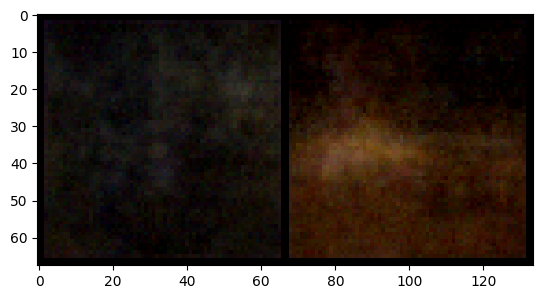

====> Validation Epoch: 182 Average loss: 285.3720
====> Epoch: 183 Average loss: 5.7591
====> Epoch: 183 Average Reconstruction loss: 5.5789
====> Epoch: 183 Average KL loss: 0.1801
Original Samples:


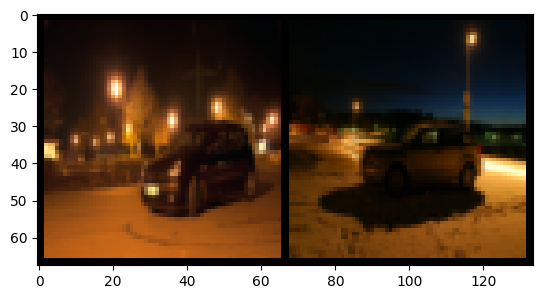

Generated Generated:


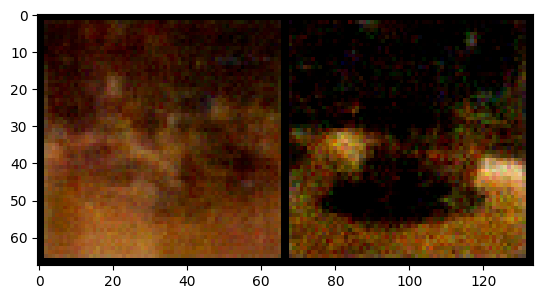

====> Validation Epoch: 183 Average loss: 286.5288
====> Epoch: 184 Average loss: 5.7059
====> Epoch: 184 Average Reconstruction loss: 5.5283
====> Epoch: 184 Average KL loss: 0.1776
Original Samples:


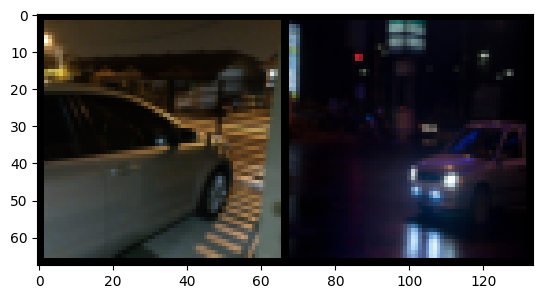

Generated Generated:


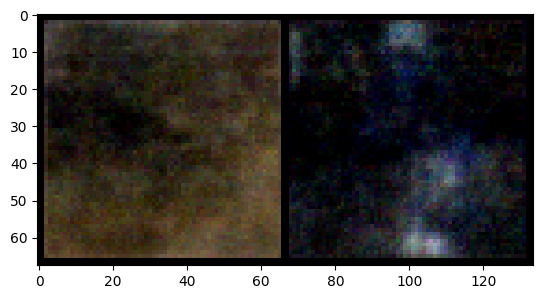

====> Validation Epoch: 184 Average loss: 283.4797
====> Epoch: 185 Average loss: 5.6093
====> Epoch: 185 Average Reconstruction loss: 5.4314
====> Epoch: 185 Average KL loss: 0.1780
Original Samples:


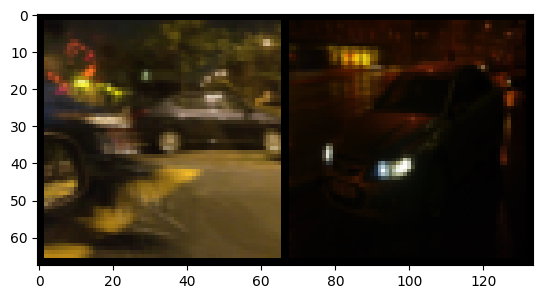

Generated Generated:


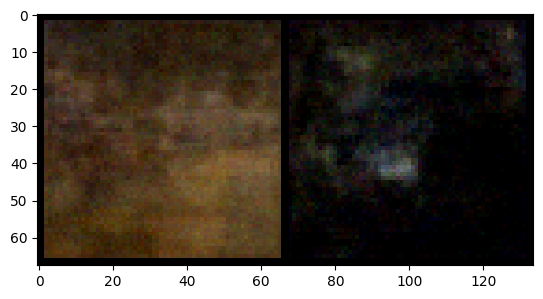

====> Validation Epoch: 185 Average loss: 285.9832
====> Epoch: 186 Average loss: 5.6807
====> Epoch: 186 Average Reconstruction loss: 5.5005
====> Epoch: 186 Average KL loss: 0.1802
Original Samples:


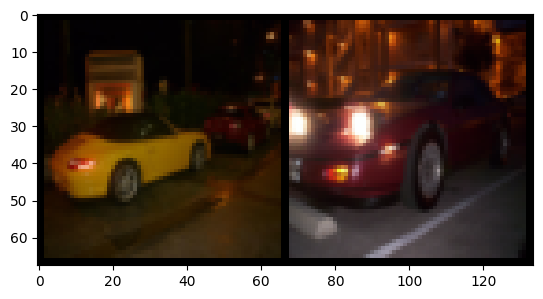

Generated Generated:


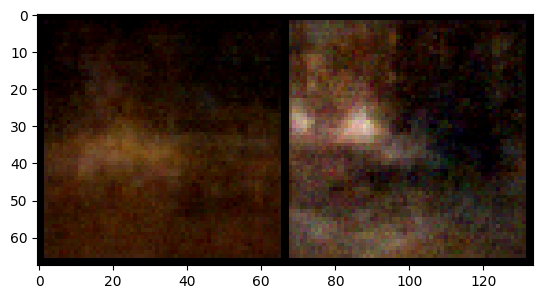

====> Validation Epoch: 186 Average loss: 286.5345
====> Epoch: 187 Average loss: 5.3699
====> Epoch: 187 Average Reconstruction loss: 5.1884
====> Epoch: 187 Average KL loss: 0.1815
Original Samples:


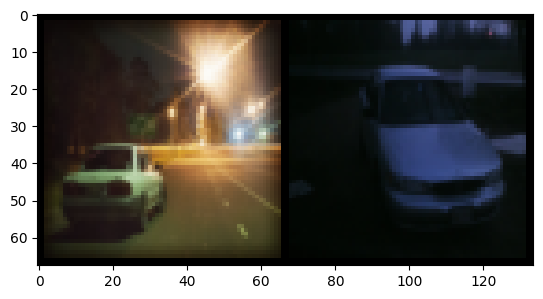

Generated Generated:


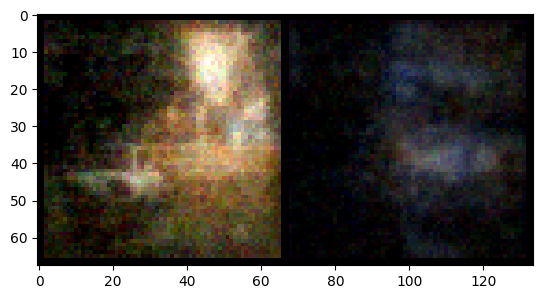

====> Validation Epoch: 187 Average loss: 284.3482
====> Epoch: 188 Average loss: 5.8805
====> Epoch: 188 Average Reconstruction loss: 5.6977
====> Epoch: 188 Average KL loss: 0.1827
Original Samples:


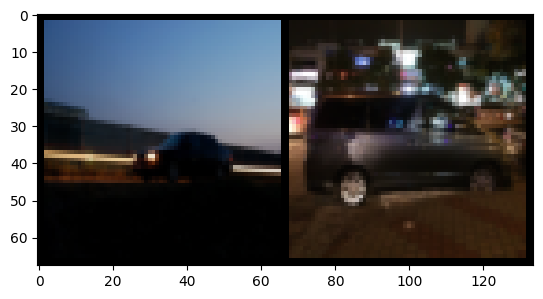

Generated Generated:


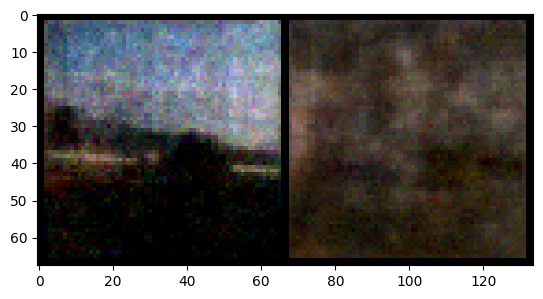

====> Validation Epoch: 188 Average loss: 282.1708
====> Epoch: 189 Average loss: 5.3192
====> Epoch: 189 Average Reconstruction loss: 5.1422
====> Epoch: 189 Average KL loss: 0.1769
Original Samples:


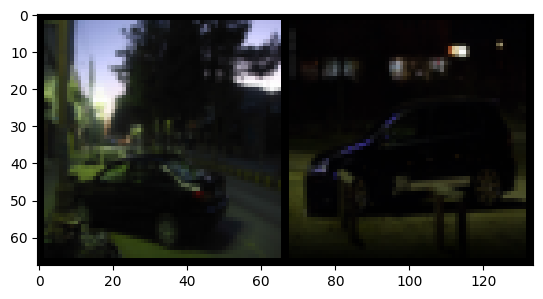

Generated Generated:


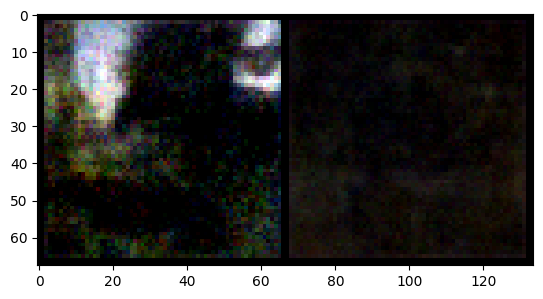

====> Validation Epoch: 189 Average loss: 285.8502
====> Epoch: 190 Average loss: 5.4986
====> Epoch: 190 Average Reconstruction loss: 5.3218
====> Epoch: 190 Average KL loss: 0.1768
Original Samples:


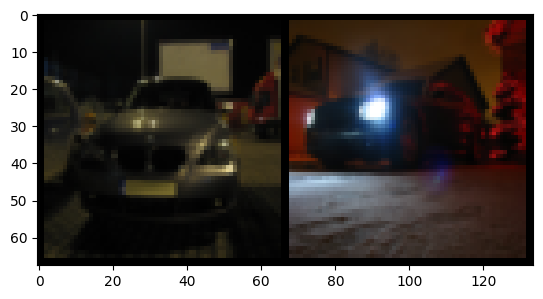

Generated Generated:


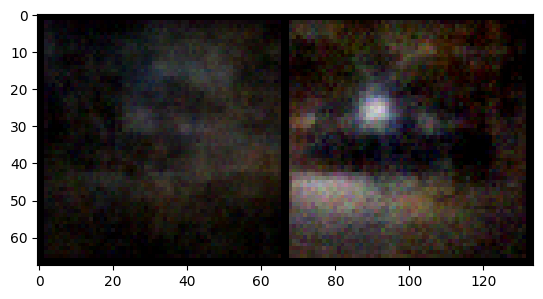

====> Validation Epoch: 190 Average loss: 285.6949
====> Epoch: 191 Average loss: 5.7150
====> Epoch: 191 Average Reconstruction loss: 5.5340
====> Epoch: 191 Average KL loss: 0.1810
Original Samples:


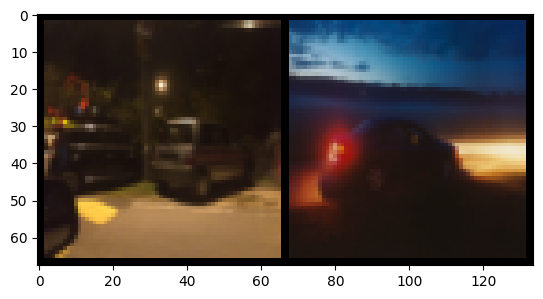

Generated Generated:


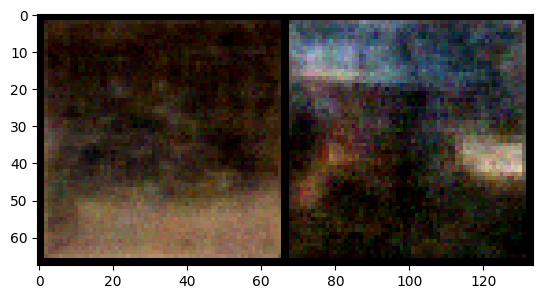

====> Validation Epoch: 191 Average loss: 284.5574
====> Epoch: 192 Average loss: 5.6154
====> Epoch: 192 Average Reconstruction loss: 5.4366
====> Epoch: 192 Average KL loss: 0.1788
Original Samples:


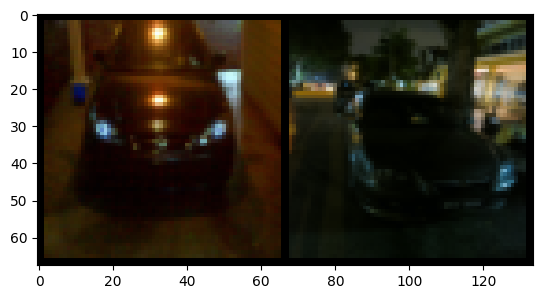

Generated Generated:


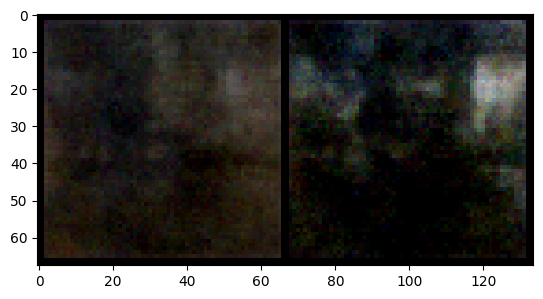

====> Validation Epoch: 192 Average loss: 283.2719
====> Epoch: 193 Average loss: 5.6122
====> Epoch: 193 Average Reconstruction loss: 5.4329
====> Epoch: 193 Average KL loss: 0.1792
Original Samples:


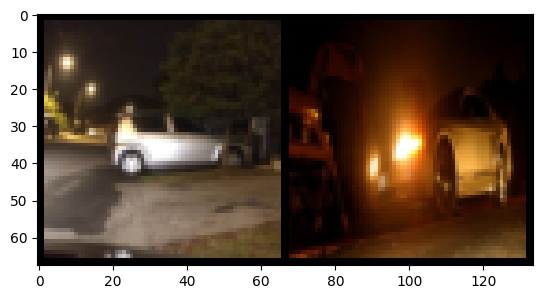

Generated Generated:


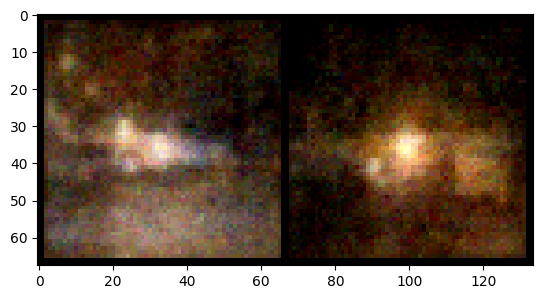

====> Validation Epoch: 193 Average loss: 285.4685
====> Epoch: 194 Average loss: 5.5586
====> Epoch: 194 Average Reconstruction loss: 5.3801
====> Epoch: 194 Average KL loss: 0.1784
Original Samples:


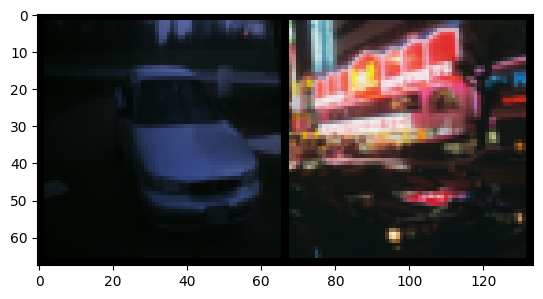

Generated Generated:


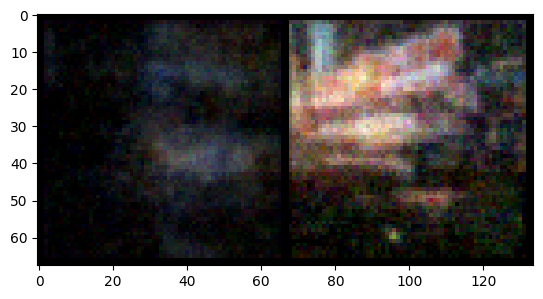

====> Validation Epoch: 194 Average loss: 285.1699
====> Epoch: 195 Average loss: 5.1823
====> Epoch: 195 Average Reconstruction loss: 5.0079
====> Epoch: 195 Average KL loss: 0.1745
Original Samples:


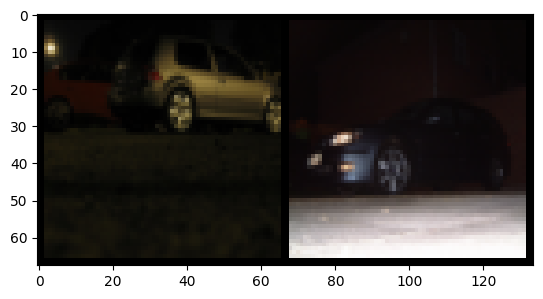

Generated Generated:


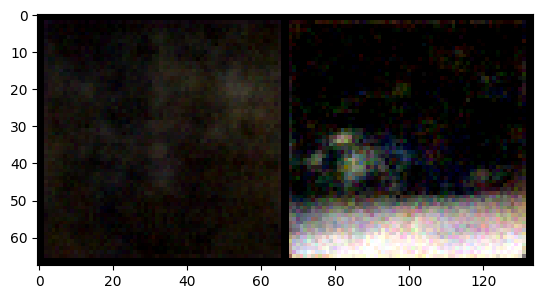

====> Validation Epoch: 195 Average loss: 290.9011
====> Epoch: 196 Average loss: 5.2556
====> Epoch: 196 Average Reconstruction loss: 5.0834
====> Epoch: 196 Average KL loss: 0.1722
Original Samples:


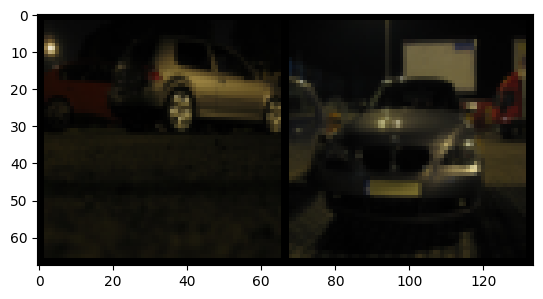

Generated Generated:


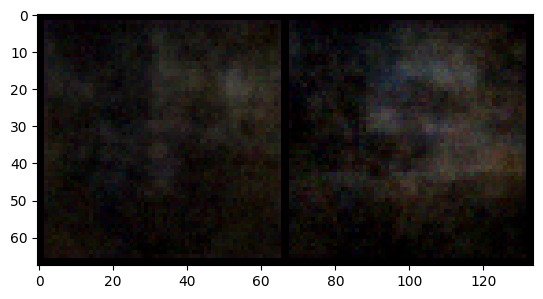

====> Validation Epoch: 196 Average loss: 285.6359
====> Epoch: 197 Average loss: 5.4196
====> Epoch: 197 Average Reconstruction loss: 5.2426
====> Epoch: 197 Average KL loss: 0.1770
Original Samples:


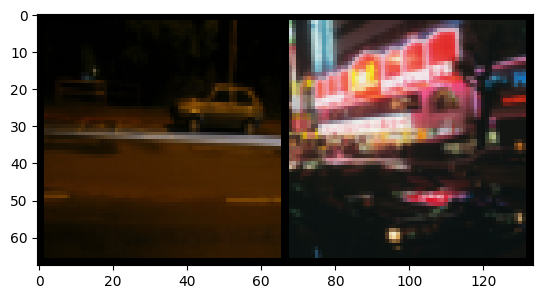

Generated Generated:


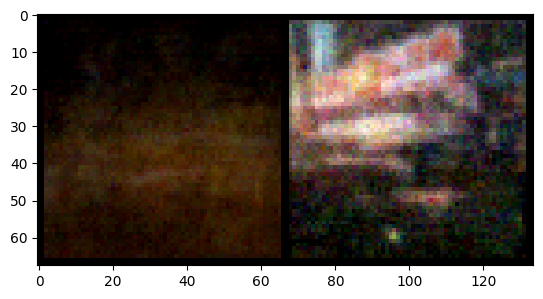

====> Validation Epoch: 197 Average loss: 287.8218
====> Epoch: 198 Average loss: 5.4099
====> Epoch: 198 Average Reconstruction loss: 5.2315
====> Epoch: 198 Average KL loss: 0.1784
Original Samples:


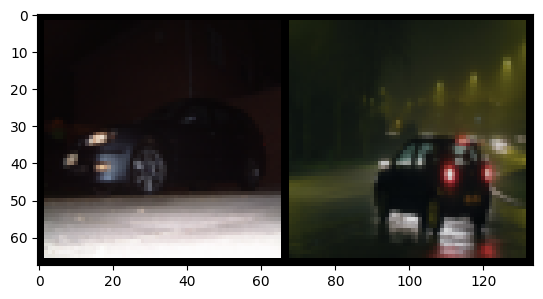

Generated Generated:


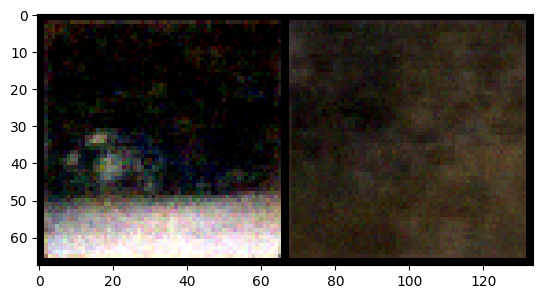

====> Validation Epoch: 198 Average loss: 286.4521
====> Epoch: 199 Average loss: 5.9449
====> Epoch: 199 Average Reconstruction loss: 5.7613
====> Epoch: 199 Average KL loss: 0.1835
Original Samples:


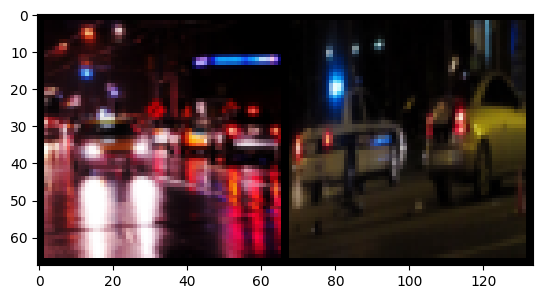

Generated Generated:


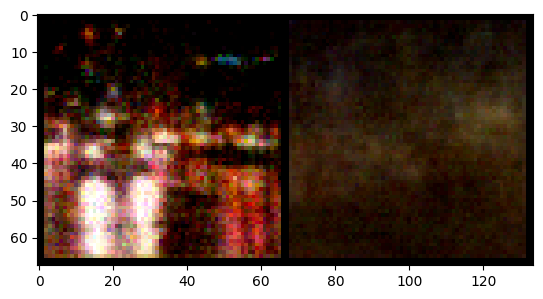

====> Validation Epoch: 199 Average loss: 284.6109
====> Epoch: 200 Average loss: 5.5474
====> Epoch: 200 Average Reconstruction loss: 5.3693
====> Epoch: 200 Average KL loss: 0.1781
Original Samples:


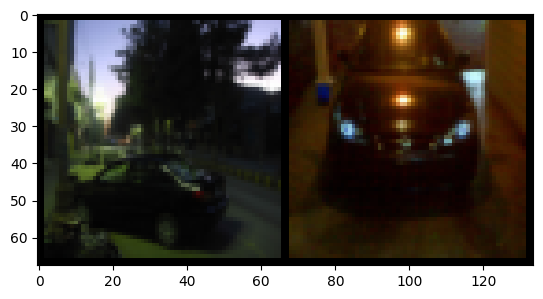

Generated Generated:


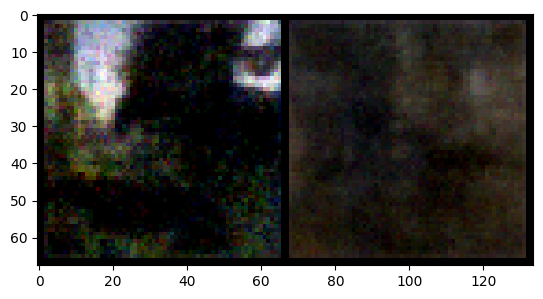

====> Validation Epoch: 200 Average loss: 289.2507


In [ ]:
epochs = 200
for epoch in range(1, epochs + 1):
    train(epoch)
    validate(epoch)

2.g,h

The quality of the image is better in a short amount of epoch, as at 200 epoch we can at least make sense of image as there are multiple cars  in the image.